In [10]:
"""
Module: final_analysis_module.py

Overview:
----------
This module provides an integrated data analysis pipeline for the biomechanical 
and simulated physiological dataset. The dataset contains metrics computed 
from free throw players and includes both joint-level biomechanical measurements 
and simulated physiological signals.

Data Description:
------------------
The dataset comprises:
  • Joint Metrics:
      - joint_energy (Joules): Aggregated energy across joints computed from individual joint-energy columns.
      - joint_power (Watts): Aggregated ongoing power across joints computed from individual joint power columns.
      - energy_acceleration: The derivative of joint_energy over time.
  • Simulated Physiological Metrics:
      - simulated_HR (beats per minute): A simulated heart rate computed from by_trial_exhaustion_score and joint_energy.
      
  • Real Physiological Metrics:
      - exhaustion_rate (continuous): The rate of change of the by_trial_exhaustion_score over time.
      - by_trial_exhaustion_score (continuous): An exhaustion metric measured per trial.
      - injury_risk (binary): A fatigue/injury risk indicator derived from exhaustion and rolling statistics.
  • Asymmetry Features:
      - Examples include hip_asymmetry and wrist_asymmetry which are computed as the absolute differences between left and right side metrics.
  • Temporal Features:
      - exhaustion_rate: Instantaneous rate of change of the by_trial_exhaustion_score.
      - Rolling statistics (e.g., rolling_power_std, rolling_hr_mean, rolling_energy_std).
  • Player Attributes:
      - player_height_in_meters and player_weight__in_kg.
      
Additional derived features such as joint angles, range-of-motion (ROM) metrics, power ratios, and others
are computed during feature engineering.

This module performs:
  1. Data loading and merging.
  2. Feature engineering (including joint feature aggregation and temporal computations).
  3. Correlation analysis of key target variables.
  4. Feature importance analysis using both permutation importance and SHAP values.
  5. Visualization of the analyses.

Usage:
------
    python final_analysis_module.py
"""

import numpy as np
import pandas as pd
import json
import sys
import logging
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
import shap

logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

from ml.load_and_prepare_data.load_data_and_analyze import (
    load_data, prepare_joint_features, feature_engineering, summarize_data,
    scale_for_lstm, check_distribution_and_zscore)

from ml.feature_selection.feature_selection import (
    load_top_features, perform_feature_importance_analysis, save_top_features,
    analyze_joint_injury_features, check_for_invalid_values,
    perform_feature_importance_analysis, analyze_and_display_top_features)





def generate_combined_correlation_matrix(data, features, target_vars, debug=False):
    """
    Generates and displays a combined correlation matrix heatmap using the specified features and target variables.
    
    Parameters:
        data (pd.DataFrame): Input data frame.
        features (list): List of feature names to include in the correlation.
        target_vars (list): List of target variables to include.
        debug (bool): If True, prints additional debug information.
        
    Returns:
        pd.DataFrame: Combined correlation matrix dataframe.
    """
    # Validate existence of features and targets
    valid_features = [feat for feat in features if feat in data.columns]
    valid_targets = [y for y in target_vars if y in data.columns]
    if not valid_targets:
        logging.error("None of the target variables were found in the data.")
        sys.exit(1)
    
    # Combine valid features and targets
    cols = valid_features + valid_targets
    corr_df = data[cols].corr()
    
    if debug:
        print(f"\nCombined correlation matrix for features and targets:\n", corr_df)
    
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
    plt.title('Combined Correlation Matrix (Features and Targets)', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    return corr_df



def analyze_feature_importance(data, features, target, debug=False):
    """
    Computes feature importance for a given target variable using RandomForestRegressor,
    permutation importance, and SHAP values. Returns a combined DataFrame with the results.

    Updates:
      - Uses the actual columns from the X_test split to ensure consistent ordering.
      - Adds debug prints to verify the filtered features and X_test columns.

    Parameters:
      - data (pd.DataFrame): The aggregated DataFrame.
      - features (list): List of candidate feature names.
      - target (str): Target variable name.
      - debug (bool): If True, displays debug plots and prints intermediate steps.
      
    Returns:
      - combined (pd.DataFrame): DataFrame with columns 'Feature', 'Perm_Importance' and 'SHAP_Importance'.
      - rf: The fitted RandomForestRegressor model.
    """
    # Filter the provided features to those present in the DataFrame.
    features = [f for f in features if f in data.columns]
    
    # Prepare data using forward and backward fill.
    X = data[features].ffill().bfill()
    y = data[target].ffill().bfill()

    # Split the data (without shuffling to preserve time order)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Train a RandomForestRegressor.
    rf = RandomForestRegressor(n_estimators=50, random_state=42)
    rf.fit(X_train, y_train)

    # Compute permutation importance.
    perm_result = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=42)
    
    if debug:
        print("Filtered features list (from data):", features)
        print("X_test.columns (used in model):", list(X_test.columns))
        print("Number of features (filtered):", len(features))
        print("Permutation importance array shape:", perm_result.importances_mean.shape)

    # Use the columns from X_test to guarantee the same order and length.
    feature_list = list(X_test.columns)
    perm_df = pd.DataFrame({
        'Feature': feature_list,
        'Perm_Importance': perm_result.importances_mean
    })

    # Compute SHAP values on a sample of X_test for speed.
    explainer = shap.TreeExplainer(rf)
    sample_size = min(100, X_test.shape[0])
    X_test_sample = X_test.sample(sample_size, random_state=42)
    shap_values = explainer.shap_values(X_test_sample)
    shap_importance = np.abs(shap_values).mean(axis=0)
    shap_df = pd.DataFrame({
        'Feature': feature_list,
        'SHAP_Importance': shap_importance
    })
    
    # Merge the permutation and SHAP importance scores.
    combined = pd.merge(perm_df, shap_df, on='Feature')
    combined.sort_values(by='Perm_Importance', ascending=False, inplace=True)
    
    if debug:
        print(f"\nFeature Importance for target '{target}':")
        print(combined)
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Perm_Importance', y='Feature', data=combined)
        plt.title(f'Permutation Importance for {target}')
        plt.tight_layout()
        plt.show()
        shap.summary_plot(shap_values, X_test_sample, plot_type="bar", show=False)
        plt.title(f'SHAP Importance for {target}')
        plt.tight_layout()
        plt.show()
        
    return combined, rf


def compute_z_scores(data, features, debug=False):
    """
    Computes the z-score for each feature in the provided list and 
    adds a new column for each called '<feature>_zscore'.
    
    Parameters:
        data (pd.DataFrame): Input DataFrame.
        features (list): List of feature names to compute z-scores for.
        debug (bool): If True, logs detailed information.
    
    Returns:
        pd.DataFrame: DataFrame with the new z-score columns added.
    """
    for feature in features:
        if feature in data.columns:
            # Ensure the feature is numeric
            if np.issubdtype(data[feature].dtype, np.number):
                mean_val = data[feature].mean()
                std_val = data[feature].std(ddof=0)
                if std_val == 0:
                    logging.warning(f"Standard deviation for feature {feature} is zero, "
                                    f"setting z-score to 0 for all entries.")
                    data[f'{feature}_zscore'] = 0
                else:
                    data[f'{feature}_zscore'] = (data[feature] - mean_val) / std_val
                if debug:
                    logging.info(f"Computed z-score for feature '{feature}': mean={mean_val}, std={std_val}")
            else:
                logging.warning(f"Feature '{feature}' is not numeric, skipping z-score computation.")
        else:
            logging.warning(f"Feature '{feature}' not found in DataFrame, skipping.")
    return data


# ------------------------------- New Visualization Functions ----------------------------------

def plot_histogram_joint_metrics(data, joint_metric_cols=None, bins=30, figsize=(12, 4)):
    """
    Plots histogram distributions for each joint metric specified.

    Parameters:
        data (pd.DataFrame): DataFrame containing the data.
        joint_metric_cols (list): List of column names to plot. Default is 
                                  ['joint_energy', 'joint_power', 'energy_acceleration'].
        bins (int): Number of bins for the histogram.
        figsize (tuple): Overall figure size.
    """
    if joint_metric_cols is None:
        joint_metric_cols = ['joint_energy', 'joint_power', 'energy_acceleration']
    
    num_cols = len(joint_metric_cols)
    plt.figure(figsize=figsize)
    for i, col in enumerate(joint_metric_cols):
        plt.subplot(1, num_cols, i+1)
        if col in data.columns:
            sns.histplot(data[col].dropna(), bins=bins, kde=True)
            plt.title(f'Histogram of {col}')
            plt.xlabel(col)
            plt.ylabel('Frequency')
        else:
            logging.warning(f"Column {col} not found in data")
    plt.tight_layout()
    plt.show()


def plot_scatter_physiological_fatigue(data, phys_metric='simulated_HR', fatigue_metrics=None, figsize=(8, 5)):
    """
    Creates scatter plots showing correlation between a physiological metric and one or more fatigue metrics.

    Parameters:
        data (pd.DataFrame): DataFrame with data.
        phys_metric (str): Name of the physiological metric column (default 'simulated_HR').
        fatigue_metrics (list): List of fatigue metric columns to compare. 
                                Default is ['by_trial_exhaustion_score', 'exhaustion_rate'].
        figsize (tuple): Figure size for each scatter plot.
    """
    if fatigue_metrics is None:
        fatigue_metrics = ['by_trial_exhaustion_score', 'exhaustion_rate']
    
    for fat_metric in fatigue_metrics:
        if phys_metric in data.columns and fat_metric in data.columns:
            plt.figure(figsize=figsize)
            sns.scatterplot(x=data[phys_metric], y=data[fat_metric])
            plt.title(f'{phys_metric} vs {fat_metric}')
            plt.xlabel(phys_metric)
            plt.ylabel(fat_metric)
            plt.tight_layout()
            plt.show()
        else:
            logging.warning(f"Either {phys_metric} or {fat_metric} not found in data")


def plot_temporal_trend_lines(data, trial_col='trial_id', metrics=None, figsize=(12, 6),
                              smooth=False, smoothing_window=3, conf_interval=False,
                              thresholds=None):
    """
    Plots temporal trend lines for specified metrics across trials with optional smoothing
    and confidence intervals.

    Parameters:
        data (pd.DataFrame): DataFrame containing the data.
        trial_col (str): Column representing trial identifiers.
        metrics (list): List of metrics to plot trends for. 
                        Defaults to ['by_trial_exhaustion_score', 'exhaustion_rate', 'simulated_HR'].
        figsize (tuple): Figure size.
        smooth (bool): If True, plots a smoothed trend line using a rolling mean.
        smoothing_window (int): Window size for computing the rolling mean if smooth==True.
        conf_interval (bool): If True, overlays a 95% confidence interval based on the standard error.
        thresholds (dict): Optional dictionary mapping metric names to threshold values 
                           (e.g., {'injury_risk': 0.5, 'by_trial_exhaustion_score': 70}).

    Returns:
        None. Displays the plot.
    """
    import math
    if metrics is None:
        metrics = ['by_trial_exhaustion_score', 'exhaustion_rate', 'simulated_HR']

    # Group data by trial and calculate statistics
    grouped = data.groupby(trial_col)
    trial_ids = grouped.mean().index

    # Prepare a figure
    plt.figure(figsize=figsize)
    
    # Loop through each metric to plot its trend line with optional smoothing and confidence intervals.
    for metric in metrics:
        # Calculate group mean, std and count for confidence intervals
        mean_vals = grouped[metric].mean().values
        std_vals = grouped[metric].std(ddof=0).values
        counts = grouped[metric].count().values
        # Standard error (avoid division by zero)
        se_vals = std_vals / np.sqrt(counts + 1e-6)
        
        # If smoothing is enabled, compute the rolling mean on the aggregated values
        if smooth:
            mean_smoothed = pd.Series(mean_vals).rolling(window=smoothing_window, min_periods=1, center=True).mean().values
            plot_vals = mean_smoothed
        else:
            plot_vals = mean_vals

        # Plot the trend line
        sns.lineplot(x=trial_ids, y=plot_vals, label=metric)
        
        # If confidence intervals are requested, fill between mean - 1.96*SE and mean + 1.96*SE.
        if conf_interval:
            ci_lower = mean_vals - 1.96 * se_vals
            ci_upper = mean_vals + 1.96 * se_vals
            plt.fill_between(trial_ids, ci_lower, ci_upper, alpha=0.2)
        
        # If a threshold is provided for this metric, plot a horizontal line.
        if thresholds is not None and metric in thresholds:
            plt.axhline(y=thresholds[metric], linestyle='--', color='gray',
                        label=f'{metric} threshold')
            
    plt.title("Temporal Trend Lines Across Trials")
    plt.xlabel(trial_col)
    plt.ylabel("Metric Mean Value")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_line_graph_multiple_metrics(data, x_axis='continuous_frame_time', metrics=None, figsize=(12, 6),
                                     thresholds=None):
    """
    Plots line graphs for multiple metrics over a specified x-axis (e.g., time) using 
    different line styles to distinguish between them. Also highlights important thresholds.

    Parameters:
        data (pd.DataFrame): DataFrame containing the data.
        x_axis (str): The column name to use for the x-axis (e.g., time).
        metrics (list): List of metric column names to plot. 
                        Defaults to ['by_trial_exhaustion_score', 'exhaustion_rate', 'simulated_HR'].
        figsize (tuple): Figure size.
        thresholds (dict): Optional dictionary mapping metric names to threshold values 
                           (e.g., {'injury_risk': 0.5}).

    Returns:
        None. Displays the plot.
    """
    if metrics is None:
        metrics = ['by_trial_exhaustion_score', 'exhaustion_rate', 'simulated_HR']
    
    plt.figure(figsize=figsize)
    
    # Loop over each metric to plot with a different line style and color
    for metric in metrics:
        if metric in data.columns:
            # Plot the metric over the x-axis
            plt.plot(data[x_axis], data[metric], label=metric, linestyle='-')
            
            # If a threshold is provided for the metric, draw a horizontal line.
            if thresholds is not None and metric in thresholds:
                plt.axhline(y=thresholds[metric], linestyle='--', color='gray',
                            label=f'{metric} threshold')
        else:
            import logging
            logging.warning(f"Metric {metric} not found in data.")
            
    plt.title("Line Graphs for Multiple Metrics Over Time")
    plt.xlabel(x_axis)
    plt.ylabel("Value")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_bullet_graph(metric_name, actual_value, target_value, performance_bands, figsize=(8, 2)):
    """
    Creates a bullet graph for a single metric comparing the actual value to a target,
    with background performance bands (e.g., poor, satisfactory, excellent).

    Parameters:
        metric_name (str): The name of the metric.
        actual_value (float): The measured value of the metric.
        target_value (float): The target or goal value for the metric.
        performance_bands (dict): Dictionary defining performance bands.
            Format should be:
                {
                  'poor': (min_val, upper_bound_for_poor),
                  'satisfactory': (lower_bound, upper_bound_for_satisfactory),
                  'excellent': (lower_bound, max_val)
                }
        figsize (tuple): Figure size.

    Returns:
        None. Displays the bullet graph.
    """
    plt.figure(figsize=figsize)
    
    # Determine the overall minimum and maximum values from the performance bands.
    # Assumes that performance_bands contains three keys: 'poor', 'satisfactory', 'excellent'
    overall_min = min(band[0] for band in performance_bands.values())
    overall_max = max(band[1] for band in performance_bands.values())
    
    # Create a horizontal bar to represent the overall range.
    plt.barh(y=0, width=overall_max - overall_min, left=overall_min, height=0.5,
             color='lightgray', edgecolor='gray')
    
    # Plot each performance band as a colored segment.
    # (Colors and styling can be customized as desired; here we use default colors.)
    band_positions = {'poor': 0, 'satisfactory': 0, 'excellent': 0}
    colors = {'poor': 'red', 'satisfactory': 'yellow', 'excellent': 'green'}
    for band, (band_min, band_max) in performance_bands.items():
        plt.barh(y=0, width=band_max - band_min, left=band_min, height=0.5,
                 color=colors.get(band, None), edgecolor='none', alpha=0.5)
    
    # Overlay the actual value as a vertical line marker.
    plt.plot([actual_value, actual_value], [-0.1, 0.6], color='black', linewidth=3, label='Actual Value')
    
    # Mark the target value with a distinct marker.
    plt.plot(target_value, 0.25, marker='D', color='blue', markersize=10, label='Target')
    
    # Formatting the plot
    plt.title(f'Bullet Graph for {metric_name}')
    plt.xlim(overall_min, overall_max)
    plt.yticks([])  # Hide the y-axis since it's not needed.
    plt.legend(loc='upper right')
    plt.xlabel(metric_name + ' Value')
    plt.tight_layout()
    plt.show()


def get_descriptive_statistics(data):
    """
    Computes descriptive statistics (Type, Mean, Std Dev, Min, Max) for each variable in the DataFrame.
    
    Returns:
        pd.DataFrame: A DataFrame with one row per variable.
    """
    stats_list = []
    for col in data.columns:
        col_type = data[col].dtype
        if np.issubdtype(data[col].dtype, np.number):
            mean_val = data[col].mean()
            std_val = data[col].std()
            min_val = data[col].min()
            max_val = data[col].max()
        else:
            mean_val = std_val = min_val = max_val = None
        stats_list.append({
            'Variable': col,
            'Type': col_type,
            'Mean': mean_val,
            'Std Dev': std_val,
            'Min': min_val,
            'Max': max_val
        })
    return pd.DataFrame(stats_list)


def get_regression_features(regression_target = ['exhaustion_rate'],
                                numerical_regression = [
        'simulated_HR',          # Highest importance (Perm: 1.386061, SHAP: 0.199147)
        'rolling_hr_mean',       # High importance (Perm: 0.454274, SHAP: 0.077322)
        'joint_energy',          # Medium importance (Perm: 0.109296, SHAP: 0.045438)
        'joint_power',           # Lower importance (Perm: 0.031813, SHAP: 0.023560)
        'energy_acceleration',   # Very low importance
        'wrist_asymmetry',
        'rolling_energy_std',
        'rolling_power_std',
        'hip_asymmetry'],
                                nominal_categorical_regression = [],
                                ordinal_categorical_regression = []
):
    """
    Constructs and returns the feature list and target variable for the regression model.
    
    The feature list is based on feature importance analysis for predicting 'by_trial_exhaustion_score'.
    Notes on selection:
      - Only numerical features are used (categorical lists are empty).
      - 'player_height_in_meters' and 'player_weight__in_kg' have been removed due to zero importance.
      - All features are ordered by importance (as per your analysis).
    
    Returns:
        regression_features (list): Combined list of features for the regression model.
        regression_target (list): Target variable for regression (['by_trial_exhaustion_score']).
    """
    # Nominal/Categorical variables (empty in this case)
    nominal_categorical_regression = ['player_height_in_meters', 'player_weight__in_kg']
    
    # Ordinal/Categorical variables (empty in this case)
    ordinal_categorical_regression = []
    
    # Numerical variables ordered by importance
    numerical_regression = [
        'simulated_HR',          # Highest importance (Perm: 1.386061, SHAP: 0.199147)
        'rolling_hr_mean',       # High importance (Perm: 0.454274, SHAP: 0.077322)
        'joint_energy',          # Medium importance (Perm: 0.109296, SHAP: 0.045438)
        'joint_power',           # Lower importance (Perm: 0.031813, SHAP: 0.023560)
        'energy_acceleration',   # Very low importance
        'wrist_asymmetry',
        'rolling_energy_std',
        'rolling_power_std',
        'hip_asymmetry'
        #  removed due to zero importance
    ]
    
    regression_features = nominal_categorical_regression + ordinal_categorical_regression + numerical_regression
    regression_target = ['exhaustion_rate']
    return regression_features, regression_target


def get_classification_features(classification_target = ['injury_risk'],
                                    numerical_classification = [
        'rolling_hr_mean',       # Highest importance (Perm: 1.079943, SHAP: 0.278289)
        'simulated_HR',          # High importance (Perm: 0.541816, SHAP: 0.082835)
        'joint_energy',          # Medium importance (Perm: 0.154789, SHAP: 0.028769)
        'joint_power',           # Medium importance (Perm: 0.145825, SHAP: 0.028232)
        'energy_acceleration',   # Lower importance (Perm: 0.072137, SHAP: 0.022768)
        'rolling_power_std',     # Lower importance
        'rolling_energy_std',
        'wrist_asymmetry',
        'hip_asymmetry'
    ], 
    nominal_categorical_classification = ['player_height_in_meters', 'player_weight__in_kg'],
    ordinal_categorical_classification = []):
    """
    Constructs and returns the feature list and target variable for the classification model.
    
    The feature list is based on feature importance analysis for predicting 'injury_risk'.
    Notes on selection:
      - Only numerical features are used (categorical lists are empty).
      - 'player_height_in_meters' and 'player_weight__in_kg' have been removed due to zero importance.
      - Although 'simulated_HR' is included, consider evaluating dropping it
        in favor of 'rolling_hr_mean' which has a higher importance.
    
    Returns:
        classification_features (list): Combined list of features for the classification model.
        classification_target (list): Target variable for classification (['injury_risk']).
    """
    # Nominal/Categorical variables (empty in this case)
    nominal_categorical_classification = ['player_height_in_meters', 'player_weight__in_kg']
    
    # Ordinal/Categorical variables (empty in this case)
    ordinal_categorical_classification = []
    
    # Numerical variables ordered by importance
    numerical_classification = [
        'rolling_hr_mean',       # Highest importance (Perm: 1.079943, SHAP: 0.278289)
        'simulated_HR',          # High importance (Perm: 0.541816, SHAP: 0.082835)
        'joint_energy',          # Medium importance (Perm: 0.154789, SHAP: 0.028769)
        'joint_power',           # Medium importance (Perm: 0.145825, SHAP: 0.028232)
        'energy_acceleration',   # Lower importance (Perm: 0.072137, SHAP: 0.022768)
        'rolling_power_std',     # Lower importance
        'rolling_energy_std',
        'wrist_asymmetry',
        'hip_asymmetry'
        
    ]
    
    classification_features = (
        nominal_categorical_classification + ordinal_categorical_classification + numerical_classification
    )
    classification_target = ['injury_risk']
    return classification_features, classification_target



# ========================================================================
#                           MAIN EXECUTION BLOCK
# ========================================================================
if __name__ == "__main__":
    from pathlib import Path
    # Import additional modules from your package structure as needed
    from ml.load_and_prepare_data.load_data_and_analyze import (
        load_data, prepare_joint_features, feature_engineering, summarize_data, prepare_base_datasets)
    
    from ml.feature_selection.feature_selection import (
        load_top_features, perform_feature_importance_analysis, save_top_features,
        analyze_joint_injury_features, check_for_invalid_values,
        analyze_and_display_top_features, run_feature_importance_analysis)
    
    print("="*80)
    print("FINAL ANALYSIS MODULE FOR BIOMECHANICAL & PHYSIOLOGICAL DATA")
    print("="*80)

    
    debug = True
    csv_path="../../data/processed/final_granular_dataset.csv"
    json_path="../../data/basketball/freethrow/participant_information.json"
    data, trial_summary_data, shot_phase_summary_data = prepare_base_datasets(csv_path, json_path, debug=debug)

    # ------------------------------------------------------------
    # Example usage with your DataFrame and “x”, “y” columns:
    # ------------------------------------------------------------
    # Suppose `data` is the DataFrame from your pipeline.


    columns_to_check = ["joint_power", "exhaustion_rate"]
    data, dist_results = check_distribution_and_zscore(data, columns_to_check)

    print("\before scaling z-score columns added to DataFrame:")
    print([col for col in data.columns if col.endswith('_zscore')])

    print("\nbefore scaling Distribution check summary:")
    print(dist_results)
    
    # Suppose we want to scale just these two columns for baseline LSTM:
    columns_to_scale = ["joint_power", "exhaustion_rate"]

    # 1) Use StandardScaler (z-score) as a baseline:
    scaled_data, standard_scaler = scale_for_lstm(
        df=data,
        columns_to_scale=columns_to_scale,
        method="standard",  # or "minmax"
        debug=True
    )
    
    columns_to_check = ["joint_power", "exhaustion_rate"]
    data, dist_results = check_distribution_and_zscore(scaled_data, columns_to_check)

    print("\nFinal z-score columns added to DataFrame:")
    print([col for col in data.columns if col.endswith('_zscore')])

    print("\nDistribution check summary:")
    print(dist_results)
    
    # ---- New: Get the updated feature sets via functions ----
    regression_features, regression_target = get_regression_features()
    classification_features, classification_target = get_classification_features()
    
    # For general exploratory analysis (e.g., z-scores), combine both feature sets into one union:
    all_features = list(set(regression_features + classification_features))
    
    # --- New Step: Compute and Explore Z-Scores ---
    data_with_z = data.copy()  # Assuming compute_z_scores is defined elsewhere in your module.
    # For demonstration, call get_descriptive_statistics on the raw data.
    print("\nDescriptive Statistics for Original Data:")
    print(get_descriptive_statistics(data).head())
    
    # ------------------------------- New Visualization Block ----------------------------------
    print("\nGenerating histogram distributions for joint metrics...")
    # Assuming plot_histogram_joint_metrics and plot_scatter_physiological_fatigue are defined.
    # plot_histogram_joint_metrics(data, joint_metric_cols=['joint_energy', 'joint_power', 'energy_acceleration'])
    plot_scatter_physiological_fatigue(data, phys_metric='joint_power', 
                                        fatigue_metrics=['by_trial_exhaustion_score', 'exhaustion_rate'])
    
    if 'trial_id' not in data.columns:
        logging.warning("'trial_id' column not found. Using DataFrame index as trial identifier.")
        data['trial_id'] = range(1, len(data)+1)
    
    print("\nGenerating temporal trend lines across trials...")
    # Here using the enhanced temporal trend lines function that may be defined earlier.
    # For example: plot_temporal_trend_lines(data, trial_col='trial_id', metrics=['by_trial_exhaustion_score', 'exhaustion_rate'])
    
    # --- New Example: Usage of plot_line_graph_multiple_metrics ---
    print("\nUsage Example: Plotting multi-metric line graph with thresholds...")
    # Define thresholds for the metrics
    line_graph_thresholds = {'by_trial_exhaustion_score': 70, 'exhaustion_rate': 0.5, 'simulated_HR': 100}
    plot_line_graph_multiple_metrics(data, x_axis='continuous_frame_time',
                                     metrics=['by_trial_exhaustion_score', 'exhaustion_rate', 'simulated_HR'],
                                     thresholds=line_graph_thresholds)
    
    # --- New Example: Usage of plot_bullet_graph ---
    print("\nUsage Example: Plotting bullet graph for 'simulated_HR' metric...")
    performance_bands = {'poor': (60, 70), 'satisfactory': (70, 90), 'excellent': (90, 110)}
    plot_bullet_graph(metric_name='simulated_HR', actual_value=95, target_value=90, performance_bands=performance_bands)

    # --- Continue with Existing Steps ---
    # Filter data to only keep the original features and targets for modeling.
    data = data[all_features + regression_target + classification_target].copy()
    
    # Describe data
    desc_stats = get_descriptive_statistics(data)
    print("\nDescriptive Statistics:")
    print(desc_stats)
    
    # Validate dataset (assuming check_for_invalid_values is defined)
    if check_for_invalid_values(data) > 0:
        logging.error("Invalid values detected in feature matrix")
        sys.exit(1)
    
    # Generate correlation matrices for the specified targets (assuming generate_combined_correlation_matrix is defined)
    combined_corr = generate_combined_correlation_matrix(data, all_features, regression_target + classification_target, debug=debug)
    
    # Run feature importance analysis using the imported module (assuming run_feature_importance_analysis is defined)
    output_dir = "../../data/Deep_Learning_Final/feature_lists/base"
    importance_threshold = 0.05
    results = run_feature_importance_analysis(
        dataset=data,
        features=all_features,
        targets=regression_target + classification_target,
        base_output_dir=output_dir,
        output_subdir="feature_lists/shot_phase_summary",
        debug=debug,
        dataset_label="Base Data",
        importance_threshold=importance_threshold,
        n_top=10
    )
    
    # --- New Block: Display Actual Feature Importance and SHAP Importance Scores ---
    print("\nDetailed Feature Importance Scores per target:")
    for target in regression_target + classification_target:
        print(f"\nActual scores for target: '{target}'")
        combined_scores, rf_model = analyze_feature_importance(data, all_features, target, debug=debug)
        print(combined_scores.to_string(index=False))
    
    logging.info("Final analysis completed successfully.")


ImportError: cannot import name 'scale_for_lstm' from 'ml.load_and_prepare_data.load_data_and_analyze' (c:\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\notebooks\Deep_Learning_Final\ml\load_and_prepare_data\load_data_and_analyze.py)

# Preprocessing, Training, Evaluation, and Inference



INFO: Loaded data from ../../data/processed/final_granular_dataset.csv with shape (16047, 228)
INFO: Added 'participant_id' column with value 'P0001'
INFO: Loaded participant information from ../../data/basketball/freethrow/participant_information.json
INFO: Merged participant data. New shape: (16047, 231)
INFO: Step [load_data]: DataFrame shape = (16047, 231)
INFO: Calculated L_SHOULDER_angle with mean: 105.13°
INFO: Calculated R_SHOULDER_angle with mean: 114.71°
INFO: Calculated L_HIP_angle with mean: 156.78°
INFO: Calculated R_HIP_angle with mean: 159.84°
INFO: Calculated L_KNEE_angle with mean: 150.54°
INFO: Calculated R_KNEE_angle with mean: 146.17°
INFO: Calculated L_ANKLE_angle with mean: 119.13°
INFO: Calculated R_ANKLE_angle with mean: 118.34°
INFO: Step [calculate_joint_angles]: DataFrame shape = (2958, 233)
INFO: New columns added: ['L_SHOULDER_angle', 'R_SHOULDER_angle', 'L_HIP_angle', 'R_HIP_angle', 'L_KNEE_angle', 'R_KNEE_angle', 'L_ANKLE_angle', 'R_ANKLE_angle']
INFO:  -

Joint energy columns:  ['L_ANKLE_energy', 'R_ANKLE_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_1STFINGER_energy', 'R_1STFINGER_energy', 'L_5THFINGER_energy', 'R_5THFINGER_energy', 'total_energy']
Joint power columns:  ['L_ANKLE_ongoing_power', 'R_ANKLE_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_1STFINGER_ongoing_power', 'L_5THFINGER_ongoing_power', 'R_1STFINGER_ongoing_power', 'R_5THFINGER_ongoing_power']
All angle columns:  ['entry_angle', 'L_ELBOW_angle', 'L_WRIST_angle', 'L_KNEE_angle', 'L_ELBOW_ongoing_angle', 'L_WRIST_ongoing_angle', 'L_KNEE_ongoing_angle', 'R_ELBOW_angle', 'R_WRIST_angle', 'R_KNEE_angle', 'R_ELBOW_ongoing_angle', 'R_WRIST_ongoing_angle', 'R_KNEE_ongoing_angle', 'initial_release_angle', 'calcu

c:\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\notebooks\Deep_Learning_Final\ml\load_and_prepare_data\load_data_and_analyze.py:714: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'{joint_name}_injury_risk'] = (rolling_series > safe_expanding_quantile(rolling_series)).astype(int)
c:\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\notebooks\Deep_Learning_Final\ml\load_and_prepare_data\load_data_and_analyze.py:711: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'{joint_name}_exhaust

Data columns for Darts processing: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x', 'R_WRIST_y', 'R_WRIST_z', 'L_WRIST_x', 'L_WRIST_y', 'L_WRIST_z', 'R_HIP_x', 'R_HIP_y', 'R_HIP_z', 'L_HIP_x', 'L_HIP_y', 'L_HIP_z', 'R_KNEE_x', 'R_KNEE_y', 'R_KNEE_z', 'L_KNEE_x', 'L_KNEE_y', 'L_KNEE_z', 'R_ANKLE_x', 'R_ANKLE_y', 'R_ANKLE_z', 'L_ANKLE_x', 'L_ANKLE_y', 'L_ANKLE_z', 'R_1STFINGER_x', 'R_1STFINGER_y', 'R_1STFINGER_z', 'R_5THFINGER_x', 'R_5THFINGER_y', 'R_5THFINGER_z', 'L_1STFINGER_x', 'L_1STFINGER_y', 'L_1STFINGER_z', 'L_5THFINGER_x', 'L_5THFINGER_y', 'L_5THFINGER_z', 'R_1STTOE_x', 'R_1STTOE

INFO: Created 'exhaustion_rate' feature.
INFO: Created 'simulated_HR' feature.
INFO: Added trial-level aggregated features: trial_mean_exhaustion, trial_total_joint_energy.
INFO: Step [prepare_joint_features]: DataFrame shape = (2957, 324)
INFO: New columns added: ['joint_energy', 'joint_power', 'energy_acceleration', 'ankle_power_ratio', 'hip_asymmetry', 'ankle_asymmetry', 'wrist_asymmetry', 'elbow_asymmetry', 'knee_asymmetry', '1stfinger_asymmetry', '5thfinger_asymmetry', 'hip_power_ratio', 'ankle_power_ratio', 'wrist_power_ratio', 'elbow_power_ratio', 'knee_power_ratio', '1stfinger_power_ratio', '5thfinger_power_ratio', 'L_KNEE_ROM', 'L_KNEE_ROM_deviation', 'L_KNEE_ROM_extreme', 'R_KNEE_ROM', 'R_KNEE_ROM_deviation', 'R_KNEE_ROM_extreme', 'L_SHOULDER_ROM', 'L_SHOULDER_ROM_deviation', 'L_SHOULDER_ROM_extreme', 'R_SHOULDER_ROM', 'R_SHOULDER_ROM_deviation', 'R_SHOULDER_ROM_extreme', 'L_HIP_ROM', 'L_HIP_ROM_deviation', 'L_HIP_ROM_extreme', 'R_HIP_ROM', 'R_HIP_ROM_deviation', 'R_HIP_ROM_e

print all the columns with by_trial_exhaustion_score:  ['by_trial_exhaustion_score', 'L_ANKLE_energy_by_trial_exhaustion_score', 'R_ANKLE_energy_by_trial_exhaustion_score', 'L_KNEE_energy_by_trial_exhaustion_score', 'R_KNEE_energy_by_trial_exhaustion_score', 'L_HIP_energy_by_trial_exhaustion_score', 'R_HIP_energy_by_trial_exhaustion_score', 'L_ELBOW_energy_by_trial_exhaustion_score', 'R_ELBOW_energy_by_trial_exhaustion_score', 'L_WRIST_energy_by_trial_exhaustion_score', 'R_WRIST_energy_by_trial_exhaustion_score', 'L_1STFINGER_energy_by_trial_exhaustion_score', 'R_1STFINGER_energy_by_trial_exhaustion_score', 'L_5THFINGER_energy_by_trial_exhaustion_score', 'R_5THFINGER_energy_by_trial_exhaustion_score']
Data columns for Darts processing: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR

INFO: New columns added: ['time_since_start', 'rolling_energy_std', 'exhaustion_lag1', 'ema_exhaustion', 'rolling_exhaustion', 'injury_risk', 'L_ANKLE_exhaustion_rate', 'L_ANKLE_rolling_exhaustion', 'L_ANKLE_injury_risk', 'R_ANKLE_exhaustion_rate', 'R_ANKLE_rolling_exhaustion', 'R_ANKLE_injury_risk', 'L_WRIST_exhaustion_rate', 'L_WRIST_rolling_exhaustion', 'L_WRIST_injury_risk', 'R_WRIST_exhaustion_rate', 'R_WRIST_rolling_exhaustion', 'R_WRIST_injury_risk', 'L_ELBOW_exhaustion_rate', 'L_ELBOW_rolling_exhaustion', 'L_ELBOW_injury_risk', 'R_ELBOW_exhaustion_rate', 'R_ELBOW_rolling_exhaustion', 'R_ELBOW_injury_risk', 'L_KNEE_exhaustion_rate', 'L_KNEE_rolling_exhaustion', 'L_KNEE_injury_risk', 'R_KNEE_exhaustion_rate', 'R_KNEE_rolling_exhaustion', 'R_KNEE_injury_risk', 'L_HIP_exhaustion_rate', 'L_HIP_rolling_exhaustion', 'L_HIP_injury_risk', 'R_HIP_exhaustion_rate', 'R_HIP_rolling_exhaustion', 'R_HIP_injury_risk', 'trial_mean_exhaustion_fe', 'trial_injury_rate_fe']
INFO:  - time_since_star


--- DEBUG: summarize_data START ---
Initial data shape: (2957, 322)
Grouping by: ['trial_id']
Aggregation columns: ['joint_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'joint_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'elbow_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 'hip_asymmetry', 'L_ELBOW_angle', 'R_ELBOW_angle', 'L_WRIST_angle', 'R_WRIST_angle', 'L_KNEE_angle', 'R_KNEE_angle', 'L_SHOULDER_ROM', 'R_SHOULDER_ROM', 'L_WRIST_ROM', 'R_WRIST_ROM', 'L_KNEE_ROM', 'R_KNEE_ROM', 'L_HIP_ROM', 'R_HIP_ROM', 'exhaustion_rate', 'by_trial_exhaustion_score', 'injury_risk', 'energy_acceleration', 'power_avg_5', 'rolling_power_std', 'rolling_hr_mean', 'simulated_HR', 'player_height_in_meters', 'player_weight__in_kg']
Lag columns: ['join

INFO: Created binary flag for L WRIST ROM extremes: L_WRIST_ROM_extreme
INFO: Computed ROM for R WRIST as R_WRIST_ROM
INFO: Computed ROM deviation for R WRIST as R_WRIST_ROM_deviation
INFO: Created binary flag for R WRIST ROM extremes: R_WRIST_ROM_extreme
INFO: Sorted data by 'participant_id' and 'continuous_frame_time'.
INFO: Created 'exhaustion_rate' feature.
INFO: Created 'simulated_HR' feature.
INFO: Added trial-level aggregated features: trial_mean_exhaustion, trial_total_joint_energy.
INFO: Added shot-phase-level aggregated features: shot_phase_mean_exhaustion, shot_phase_total_joint_energy.
INFO: Step [prepare_joint_features]: DataFrame shape = (2957, 326)
INFO: New columns added: ['joint_energy', 'joint_power', 'energy_acceleration', 'ankle_power_ratio', 'hip_asymmetry', 'ankle_asymmetry', 'wrist_asymmetry', 'elbow_asymmetry', 'knee_asymmetry', '1stfinger_asymmetry', '5thfinger_asymmetry', 'hip_power_ratio', 'ankle_power_ratio', 'wrist_power_ratio', 'elbow_power_ratio', 'knee_p

print all the columns with by_trial_exhaustion_score:  ['by_trial_exhaustion_score', 'L_ANKLE_energy_by_trial_exhaustion_score', 'R_ANKLE_energy_by_trial_exhaustion_score', 'L_KNEE_energy_by_trial_exhaustion_score', 'R_KNEE_energy_by_trial_exhaustion_score', 'L_HIP_energy_by_trial_exhaustion_score', 'R_HIP_energy_by_trial_exhaustion_score', 'L_ELBOW_energy_by_trial_exhaustion_score', 'R_ELBOW_energy_by_trial_exhaustion_score', 'L_WRIST_energy_by_trial_exhaustion_score', 'R_WRIST_energy_by_trial_exhaustion_score', 'L_1STFINGER_energy_by_trial_exhaustion_score', 'R_1STFINGER_energy_by_trial_exhaustion_score', 'L_5THFINGER_energy_by_trial_exhaustion_score', 'R_5THFINGER_energy_by_trial_exhaustion_score']


INFO: Step [feature_engineering]: DataFrame shape = (2956, 330)
INFO: New columns added: ['time_since_start', 'rolling_energy_std', 'exhaustion_lag1', 'ema_exhaustion', 'rolling_exhaustion', 'injury_risk', 'L_ANKLE_exhaustion_rate', 'L_ANKLE_rolling_exhaustion', 'L_ANKLE_injury_risk', 'R_ANKLE_exhaustion_rate', 'R_ANKLE_rolling_exhaustion', 'R_ANKLE_injury_risk', 'L_WRIST_exhaustion_rate', 'L_WRIST_rolling_exhaustion', 'L_WRIST_injury_risk', 'R_WRIST_exhaustion_rate', 'R_WRIST_rolling_exhaustion', 'R_WRIST_injury_risk', 'L_ELBOW_exhaustion_rate', 'L_ELBOW_rolling_exhaustion', 'L_ELBOW_injury_risk', 'R_ELBOW_exhaustion_rate', 'R_ELBOW_rolling_exhaustion', 'R_ELBOW_injury_risk', 'L_KNEE_exhaustion_rate', 'L_KNEE_rolling_exhaustion', 'L_KNEE_injury_risk', 'R_KNEE_exhaustion_rate', 'R_KNEE_rolling_exhaustion', 'R_KNEE_injury_risk', 'L_HIP_exhaustion_rate', 'L_HIP_rolling_exhaustion', 'L_HIP_injury_risk', 'R_HIP_exhaustion_rate', 'R_HIP_rolling_exhaustion', 'R_HIP_injury_risk', 'trial_mean_

Data columns for Darts processing: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x', 'R_WRIST_y', 'R_WRIST_z', 'L_WRIST_x', 'L_WRIST_y', 'L_WRIST_z', 'R_HIP_x', 'R_HIP_y', 'R_HIP_z', 'L_HIP_x', 'L_HIP_y', 'L_HIP_z', 'R_KNEE_x', 'R_KNEE_y', 'R_KNEE_z', 'L_KNEE_x', 'L_KNEE_y', 'L_KNEE_z', 'R_ANKLE_x', 'R_ANKLE_y', 'R_ANKLE_z', 'L_ANKLE_x', 'L_ANKLE_y', 'L_ANKLE_z', 'R_1STFINGER_x', 'R_1STFINGER_y', 'R_1STFINGER_z', 'R_5THFINGER_x', 'R_5THFINGER_y', 'R_5THFINGER_z', 'L_1STFINGER_x', 'L_1STFINGER_y', 'L_1STFINGER_z', 'L_5THFINGER_x', 'L_5THFINGER_y', 'L_5THFINGER_z', 'R_1STTOE_x', 'R_1STTOE

INFO: === Base Dataset Analysis (Overall + Joint-Specific) ===
INFO: Skipping analysis for Base Data; using pre-saved feature lists from ..\..\data\Deep_Learning_Final\feature_lists\base
INFO: Loaded feature list for 'exhaustion_rate': ['joint_power', 'joint_energy', 'ema_exhaustion', 'power_avg_5', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'simulated_HR', 'wrist_asymmetry', 'rolling_exhaustion', 'wrist_power_ratio']
INFO: [Base Data] Loaded top features for target 'exhaustion_rate': ['joint_power', 'joint_energy', 'ema_exhaustion', 'power_avg_5', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'simulated_HR', 'wrist_asymmetry', 'rolling_exhaustion', 'wrist_power_ratio']
INFO: Loaded feature list for 'injury_risk': ['rolling_exhaustion', 'ema_exhaustion', 'knee_power_ratio', 'exhaustion_lag1', 'hip_asymmetry', 'power_avg_5', 'time_since_start', 'knee_asymmetry', 'L_SHOULDER_ROM', 'elbow_power_ratio']
INFO: [Base Data] Loaded top features for target 'injury_risk': ['rolling_exhaustion', 'ema_exhaustion

Available target columns: ['by_trial_exhaustion_score', 'overall_exhaustion_score', 'L_ANKLE_energy_by_trial_exhaustion_score', 'L_ANKLE_energy_overall_exhaustion_score', 'R_ANKLE_energy_by_trial_exhaustion_score', 'R_ANKLE_energy_overall_exhaustion_score', 'L_KNEE_energy_by_trial_exhaustion_score', 'L_KNEE_energy_overall_exhaustion_score', 'R_KNEE_energy_by_trial_exhaustion_score', 'R_KNEE_energy_overall_exhaustion_score', 'L_HIP_energy_by_trial_exhaustion_score', 'L_HIP_energy_overall_exhaustion_score', 'R_HIP_energy_by_trial_exhaustion_score', 'R_HIP_energy_overall_exhaustion_score', 'L_ELBOW_energy_by_trial_exhaustion_score', 'L_ELBOW_energy_overall_exhaustion_score', 'R_ELBOW_energy_by_trial_exhaustion_score', 'R_ELBOW_energy_overall_exhaustion_score', 'L_WRIST_energy_by_trial_exhaustion_score', 'L_WRIST_energy_overall_exhaustion_score', 'R_WRIST_energy_by_trial_exhaustion_score', 'R_WRIST_energy_overall_exhaustion_score', 'L_1STFINGER_energy_by_trial_exhaustion_score', 'L_1STFING

INFO: Training exhaustion model...


Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.7624 - val_loss: 2.0492
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3880 - val_loss: 2.0921
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3875 - val_loss: 2.0094
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2933 - val_loss: 1.8909
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2853 - val_loss: 1.8252
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2683 - val_loss: 1.6225
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3122 - val_loss: 1.4237
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2740 - val_loss: 1.3344
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2396 - val_loss: 1.2001
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2359 - val_loss: 1.1440
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2375 - val_loss: 1.1434
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2

INFO: Features provided for training injury model: ['joint_power', 'joint_energy', 'elbow_asymmetry', 'knee_asymmetry', 'L_WRIST_angle', 'R_WRIST_angle', 'exhaustion_lag1', 'power_avg_5', 'simulated_HR', 'player_height_in_meters', 'player_weight__in_kg']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x', 'R_WRIST_y', 'R_WRIST_z', 'L_WRIST_x', 'L_WRIST_y', 'L_WRIST_z', 'R_HIP_x', 'R_HIP_y', 'R_HIP_z', 'L_HIP_x', 'L_HIP_y', 'L_HIP_z', 'R_KNEE_x', 'R_KNEE_y', 'R_KNEE_z', 'L_KNEE_x', 'L_KNEE_y', 'L_KNEE_z', 'R_ANKLE_x', 'R_ANKLE_y', 'R_ANKLE_z', 'L_ANKLE_x

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6911 - loss: 0.5896 - val_accuracy: 0.8348 - val_loss: 0.4006
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8007 - loss: 0.4410 - val_accuracy: 0.8518 - val_loss: 0.3247
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8138 - loss: 0.4122 - val_accuracy: 0.8501 - val_loss: 0.3094
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8173 - loss: 0.3882 - val_accuracy: 0.8773 - val_loss: 0.2936
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8482 - loss: 0.3652 - val_accuracy: 0.8586 - val_loss: 0.3043
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8508 - loss: 0.3482 - val_accuracy: 0.8756 - val_loss: 0.2760
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8410 - loss: 0.3397 - val_accuracy: 0.8790 - val_loss: 0.2763
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8486 - loss: 0.3407 - val_accuracy: 0.8705 - v

INFO: Training joint-specific injury model for L_ANKLE_injury_risk using features: ['rolling_exhaustion', 'R_SHOULDER_ROM', 'L_HIP_ROM', 'L_ANKLE_ROM', 'time_since_start', 'wrist_power_ratio', 'L_ANKLE_ROM_deviation', '5thfinger_power_ratio', 'joint_power', 'R_HIP_ROM']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'R_SHOULDER_ROM', 'L_HIP_ROM', 'L_ANKLE_ROM', 'time_since_start', 'wrist_power_ratio', 'L_ANKLE_ROM_deviation', '5thfinger_power_ratio', 'joint_power', 'R_HIP_ROM']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7675 - loss: 1.4129 - val_accuracy: 0.7751 - val_loss: 0.5898
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8327 - loss: 0.5816 - val_accuracy: 0.7359 - val_loss: 1.6464
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8269 - loss: 0.5836 - val_accuracy: 0.7615 - val_loss: 1.0600
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8616 - loss: 0.4441 - val_accuracy: 0.7547 - val_loss: 1.3546
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8462 - loss: 0.5741 - val_accuracy: 0.7751 - val_loss: 1.2046
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8641 - loss: 0.4775 - val_accuracy: 0.7564 - val_loss: 1.7102


INFO: Successfully trained joint model for L_ANKLE_injury_risk.
INFO: Training joint-specific injury model for R_ANKLE_injury_risk using features: ['rolling_exhaustion', 'exhaustion_lag1', 'L_SHOULDER_ROM', 'joint_energy', 'R_SHOULDER_ROM', 'L_KNEE_ROM_deviation', 'joint_power', 'L_HIP_ROM', 'L_KNEE_ROM', 'rolling_hr_mean']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'exhaustion_lag1', 'L_SHOULDER_ROM', 'joint_energy', 'R_SHOULDER_ROM', 'L_KNEE_ROM_deviation', 'joint_power', 'L_HIP_ROM', 'L_KNEE_ROM', 'rolling_hr_mean']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6823 - loss: 3.0484 - val_accuracy: 0.7479 - val_loss: 0.4744
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7053 - loss: 0.7132 - val_accuracy: 0.7700 - val_loss: 0.4423
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6595 - loss: 0.8890 - val_accuracy: 0.6048 - val_loss: 1.2777
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6896 - loss: 0.7301 - val_accuracy: 0.6899 - val_loss: 0.5391
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7144 - loss: 0.6142 - val_accuracy: 0.7342 - val_loss: 0.4859
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7063 - loss: 0.5691 - val_accuracy: 0.7462 - val_loss: 0.4623
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7322 - loss: 0.5325 - val_accuracy: 0.7359 - val_loss: 0.4481


INFO: Successfully trained joint model for R_ANKLE_injury_risk.
INFO: Training joint-specific injury model for L_WRIST_injury_risk using features: ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', 'power_avg_5', 'L_ANKLE_ROM_deviation', 'rolling_hr_mean', 'L_ANKLE_ROM', 'joint_energy', 'energy_acceleration', 'R_SHOULDER_ROM']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', 'power_avg_5', 'L_ANKLE_ROM_deviation', 'rolling_hr_mean', 'L_ANKLE_ROM', 'joint_energy', 'energy_acceleration', 'R_SHOULDER_ROM']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_EL

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7298 - loss: 1.3521 - val_accuracy: 0.8518 - val_loss: 0.3576
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8167 - loss: 0.4261 - val_accuracy: 0.9063 - val_loss: 0.2900
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8341 - loss: 0.4331 - val_accuracy: 0.8450 - val_loss: 0.2994
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8359 - loss: 0.3414 - val_accuracy: 0.8705 - val_loss: 0.2932
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8504 - loss: 0.3272 - val_accuracy: 0.8552 - val_loss: 0.3344
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8431 - loss: 0.3622 - val_accuracy: 0.9012 - val_loss: 0.2737
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8578 - loss: 0.3170 - val_accuracy: 0.8654 - val_loss: 0.3071
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8512 - loss: 0.3507 - val_accuracy: 0.8637 - v

INFO: Successfully trained joint model for L_WRIST_injury_risk.
INFO: Training joint-specific injury model for R_WRIST_injury_risk using features: ['rolling_exhaustion', 'wrist_power_ratio', '5thfinger_power_ratio', 'elbow_power_ratio', 'exhaustion_lag1', 'joint_power', 'R_HIP_ROM', '1stfinger_power_ratio', 'rolling_hr_mean', '5thfinger_asymmetry']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'wrist_power_ratio', '5thfinger_power_ratio', 'elbow_power_ratio', 'exhaustion_lag1', 'joint_power', 'R_HIP_ROM', '1stfinger_power_ratio', 'rolling_hr_mean', '5thfinger_asymmetry']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOUL

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7900 - loss: 1.7600 - val_accuracy: 0.8739 - val_loss: 0.2763
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8481 - loss: 0.3865 - val_accuracy: 0.9080 - val_loss: 0.2469
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8739 - loss: 0.2751 - val_accuracy: 0.8552 - val_loss: 0.2934
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8746 - loss: 0.3563 - val_accuracy: 0.8876 - val_loss: 0.2979
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8737 - loss: 0.2678 - val_accuracy: 0.8688 - val_loss: 0.2795
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8884 - loss: 0.2525 - val_accuracy: 0.8467 - val_loss: 0.4449
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8880 - loss: 0.2557 - val_accuracy: 0.8467 - val_loss: 0.3192


INFO: Successfully trained joint model for R_WRIST_injury_risk.
INFO: Training joint-specific injury model for L_ELBOW_injury_risk using features: ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', '5thfinger_asymmetry', 'rolling_hr_mean', 'energy_acceleration', 'elbow_power_ratio', 'rolling_energy_std', 'R_ANKLE_ROM', 'time_since_start']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', '5thfinger_asymmetry', 'rolling_hr_mean', 'energy_acceleration', 'elbow_power_ratio', 'rolling_energy_std', 'R_ANKLE_ROM', 'time_since_start']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDE

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7186 - loss: 1.2395 - val_accuracy: 0.8211 - val_loss: 0.4054
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7728 - loss: 0.6542 - val_accuracy: 0.8330 - val_loss: 0.3731
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7937 - loss: 0.5629 - val_accuracy: 0.8552 - val_loss: 0.3379
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8027 - loss: 0.4466 - val_accuracy: 0.8671 - val_loss: 0.3105
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8291 - loss: 0.3728 - val_accuracy: 0.8842 - val_loss: 0.2858
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8030 - loss: 0.4410 - val_accuracy: 0.8876 - val_loss: 0.2651
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8368 - loss: 0.3973 - val_accuracy: 0.8910 - val_loss: 0.2491
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8440 - loss: 0.3468 - val_accuracy: 0.9012 - v

INFO: Successfully trained joint model for L_ELBOW_injury_risk.
INFO: Training joint-specific injury model for R_ELBOW_injury_risk using features: ['rolling_exhaustion', 'wrist_power_ratio', 'joint_power', 'elbow_power_ratio', '5thfinger_power_ratio', 'energy_acceleration', 'R_SHOULDER_ROM', 'joint_energy', 'exhaustion_lag1', 'knee_power_ratio']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'wrist_power_ratio', 'joint_power', 'elbow_power_ratio', '5thfinger_power_ratio', 'energy_acceleration', 'R_SHOULDER_ROM', 'joint_energy', 'exhaustion_lag1', 'knee_power_ratio']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z'

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7959 - loss: 1.3996 - val_accuracy: 0.9284 - val_loss: 0.2251
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8389 - loss: 0.4930 - val_accuracy: 0.9165 - val_loss: 0.2075
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8351 - loss: 0.4416 - val_accuracy: 0.9284 - val_loss: 0.2054
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8592 - loss: 0.4608 - val_accuracy: 0.9250 - val_loss: 0.1835
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8618 - loss: 0.4060 - val_accuracy: 0.9302 - val_loss: 0.1746
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8483 - loss: 0.5397 - val_accuracy: 0.9336 - val_loss: 0.1778
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8799 - loss: 0.3663 - val_accuracy: 0.9404 - val_loss: 0.1812
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8678 - loss: 0.3965 - val_accuracy: 0.9319 - v

INFO: Successfully trained joint model for R_ELBOW_injury_risk.
INFO: Training joint-specific injury model for L_KNEE_injury_risk using features: ['rolling_exhaustion', 'L_ANKLE_ROM', 'R_HIP_ROM', 'ema_exhaustion', 'L_HIP_ROM', 'L_ANKLE_ROM_deviation', 'rolling_hr_mean', 'R_KNEE_ROM_deviation', 'time_since_start', 'L_KNEE_ROM_deviation']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'L_ANKLE_ROM', 'R_HIP_ROM', 'ema_exhaustion', 'L_HIP_ROM', 'L_ANKLE_ROM_deviation', 'rolling_hr_mean', 'R_KNEE_ROM_deviation', 'time_since_start', 'L_KNEE_ROM_deviation']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7184 - loss: 1.4800 - val_accuracy: 0.8109 - val_loss: 0.3918
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7687 - loss: 0.4781 - val_accuracy: 0.7939 - val_loss: 0.3595
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8212 - loss: 0.4364 - val_accuracy: 0.8569 - val_loss: 0.3271
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8188 - loss: 0.4272 - val_accuracy: 0.8467 - val_loss: 0.2821
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8523 - loss: 0.3676 - val_accuracy: 0.8399 - val_loss: 0.3027
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8658 - loss: 0.3239 - val_accuracy: 0.8279 - val_loss: 0.3638
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8748 - loss: 0.2880 - val_accuracy: 0.8467 - val_loss: 0.3258
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8814 - loss: 0.3069 - val_accuracy: 0.8399 - v

INFO: Successfully trained joint model for L_KNEE_injury_risk.
INFO: Training joint-specific injury model for R_KNEE_injury_risk using features: ['rolling_exhaustion', 'exhaustion_lag1', 'R_HIP_ROM', 'knee_power_ratio', 'R_KNEE_ROM', 'rolling_power_std', '5thfinger_power_ratio', 'rolling_hr_mean', 'R_KNEE_ROM_deviation', 'wrist_power_ratio']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'exhaustion_lag1', 'R_HIP_ROM', 'knee_power_ratio', 'R_KNEE_ROM', 'rolling_power_std', '5thfinger_power_ratio', 'rolling_hr_mean', 'R_KNEE_ROM_deviation', 'wrist_power_ratio']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_E

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6605 - loss: 2.7722 - val_accuracy: 0.7104 - val_loss: 1.7869
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7048 - loss: 1.0772 - val_accuracy: 0.7155 - val_loss: 0.7719
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7442 - loss: 0.5847 - val_accuracy: 0.7325 - val_loss: 0.4664
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7576 - loss: 0.5262 - val_accuracy: 0.7411 - val_loss: 0.4336
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7642 - loss: 0.5221 - val_accuracy: 0.7632 - val_loss: 0.3988
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7957 - loss: 0.4783 - val_accuracy: 0.8433 - val_loss: 0.3671
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7987 - loss: 0.4525 - val_accuracy: 0.8518 - val_loss: 0.3467
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8255 - loss: 0.4209 - val_accuracy: 0.8501 - v

INFO: Successfully trained joint model for R_KNEE_injury_risk.
INFO: Training joint-specific injury model for L_HIP_injury_risk using features: ['rolling_exhaustion', 'wrist_power_ratio', 'ema_exhaustion', 'L_ANKLE_ROM', 'L_KNEE_ROM_deviation', 'exhaustion_lag1', 'hip_asymmetry', 'time_since_start', 'L_KNEE_ROM', 'ankle_asymmetry']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'wrist_power_ratio', 'ema_exhaustion', 'L_ANKLE_ROM', 'L_KNEE_ROM_deviation', 'exhaustion_lag1', 'hip_asymmetry', 'time_since_start', 'L_KNEE_ROM', 'ankle_asymmetry']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7424 - loss: 1.4130 - val_accuracy: 0.8262 - val_loss: 0.3636
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7897 - loss: 0.4872 - val_accuracy: 0.8569 - val_loss: 0.3154
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8301 - loss: 0.3876 - val_accuracy: 0.8722 - val_loss: 0.3035
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8364 - loss: 0.3907 - val_accuracy: 0.8365 - val_loss: 0.2976
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8675 - loss: 0.3398 - val_accuracy: 0.8603 - val_loss: 0.3138
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8928 - loss: 0.2722 - val_accuracy: 0.8518 - val_loss: 0.2972
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8889 - loss: 0.2995 - val_accuracy: 0.8177 - val_loss: 0.4686
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8876 - loss: 0.3113 - val_accuracy: 0.8654 - v

INFO: Successfully trained joint model for L_HIP_injury_risk.
INFO: Training joint-specific injury model for R_HIP_injury_risk using features: ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', 'wrist_power_ratio', 'L_KNEE_ROM_deviation', 'R_SHOULDER_ROM', 'time_since_start', 'rolling_hr_mean', 'L_SHOULDER_ROM', 'hip_asymmetry']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', 'wrist_power_ratio', 'L_KNEE_ROM_deviation', 'R_SHOULDER_ROM', 'time_since_start', 'rolling_hr_mean', 'L_SHOULDER_ROM', 'hip_asymmetry']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6799 - loss: 2.3043 - val_accuracy: 0.6865 - val_loss: 0.8474
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7215 - loss: 0.6295 - val_accuracy: 0.7428 - val_loss: 0.4412
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7912 - loss: 0.4394 - val_accuracy: 0.7717 - val_loss: 0.4188
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8064 - loss: 0.4256 - val_accuracy: 0.7700 - val_loss: 0.4100
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8204 - loss: 0.3853 - val_accuracy: 0.7632 - val_loss: 0.4332
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8157 - loss: 0.3916 - val_accuracy: 0.7717 - val_loss: 0.4199
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8268 - loss: 0.3669 - val_accuracy: 0.7751 - val_loss: 0.4365
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8457 - loss: 0.3407 - val_accuracy: 0.8007 - v

INFO: Successfully trained joint model for R_HIP_injury_risk.
INFO: Training joint-specific injury model for L_ANKLE_exhaustion_rate using features: ['rolling_exhaustion', 'hip_power_ratio', 'elbow_asymmetry', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'rolling_power_std', 'wrist_asymmetry', 'rolling_hr_mean', 'simulated_HR', 'time_since_start']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'hip_power_ratio', 'elbow_asymmetry', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'rolling_power_std', 'wrist_asymmetry', 'rolling_hr_mean', 'simulated_HR', 'time_since_start']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x',

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0061 - loss: 0.0183 - val_accuracy: 0.0034 - val_loss: 0.0064
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0052 - loss: 0.0069 - val_accuracy: 0.0034 - val_loss: 0.0064
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0046 - loss: 0.0068 - val_accuracy: 0.0034 - val_loss: 0.0064
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0069 - loss: 0.0068 - val_accuracy: 0.0034 - val_loss: 0.0064
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0094 - loss: 0.0069 - val_accuracy: 0.0034 - val_loss: 0.0064
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0068 - loss: 0.0070 - val_accuracy: 0.0034 - val_loss: 0.0064


INFO: Successfully trained joint model for L_ANKLE_exhaustion_rate.
INFO: Training joint-specific injury model for R_ANKLE_exhaustion_rate using features: ['rolling_exhaustion', 'exhaustion_lag1', 'elbow_asymmetry', 'L_SHOULDER_ROM', 'hip_power_ratio', 'rolling_energy_std', 'rolling_power_std', 'R_SHOULDER_ROM', 'power_avg_5', 'R_ANKLE_ROM_deviation']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'exhaustion_lag1', 'elbow_asymmetry', 'L_SHOULDER_ROM', 'hip_power_ratio', 'rolling_energy_std', 'rolling_power_std', 'R_SHOULDER_ROM', 'power_avg_5', 'R_ANKLE_ROM_deviation']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDE

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0071 - loss: 0.0595 - val_accuracy: 0.0051 - val_loss: 0.0049
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0077 - loss: 0.0058 - val_accuracy: 0.0051 - val_loss: 0.0049
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0053 - loss: 0.0056 - val_accuracy: 0.0051 - val_loss: 0.0049
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0059 - loss: 0.0058 - val_accuracy: 0.0051 - val_loss: 0.0049
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0039 - loss: 0.0056 - val_accuracy: 0.0051 - val_loss: 0.0049
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0091 - loss: 0.0057 - val_accuracy: 0.0051 - val_loss: 0.0049


INFO: Successfully trained joint model for R_ANKLE_exhaustion_rate.
INFO: Training joint-specific injury model for L_WRIST_exhaustion_rate using features: ['joint_power', 'exhaustion_lag1', 'rolling_energy_std', 'joint_energy', 'elbow_asymmetry', 'rolling_power_std', 'ankle_power_ratio', 'simulated_HR', 'power_avg_5', 'energy_acceleration']
INFO: Features provided for training injury model: ['joint_power', 'exhaustion_lag1', 'rolling_energy_std', 'joint_energy', 'elbow_asymmetry', 'rolling_power_std', 'ankle_power_ratio', 'simulated_HR', 'power_avg_5', 'energy_acceleration']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0068 - loss: 0.0162 - val_accuracy: 0.0034 - val_loss: 0.0068
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0080 - loss: 0.0073 - val_accuracy: 0.0034 - val_loss: 0.0068
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0058 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0069
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0090 - loss: 0.0072 - val_accuracy: 0.0034 - val_loss: 0.0073
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0112 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0068
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0065 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0068
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0071 - loss: 0.0073 - val_accuracy: 0.0034 - val_loss: 0.0068


INFO: Successfully trained joint model for L_WRIST_exhaustion_rate.
INFO: Training joint-specific injury model for R_WRIST_exhaustion_rate using features: ['ema_exhaustion', 'joint_energy', 'joint_power', 'exhaustion_lag1', 'simulated_HR', 'hip_asymmetry', 'wrist_power_ratio', 'power_avg_5', '5thfinger_power_ratio', 'rolling_exhaustion']
INFO: Features provided for training injury model: ['ema_exhaustion', 'joint_energy', 'joint_power', 'exhaustion_lag1', 'simulated_HR', 'hip_asymmetry', 'wrist_power_ratio', 'power_avg_5', '5thfinger_power_ratio', 'rolling_exhaustion']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0082 - loss: 0.0179 - val_accuracy: 0.0034 - val_loss: 0.0098
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0053 - loss: 0.0075 - val_accuracy: 0.0034 - val_loss: 0.0080
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0086 - loss: 0.0073 - val_accuracy: 0.0034 - val_loss: 0.0075
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0062 - loss: 0.0071 - val_accuracy: 0.0034 - val_loss: 0.0075
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0072 - loss: 0.0071 - val_accuracy: 0.0034 - val_loss: 0.0075
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0051 - loss: 0.0072 - val_accuracy: 0.0034 - val_loss: 0.0075
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0045 - loss: 0.0073 - val_accuracy: 0.0034 - val_loss: 0.0075
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0071 - loss: 0.0072 - val_accuracy: 0.0034 - v

INFO: Successfully trained joint model for R_WRIST_exhaustion_rate.
INFO: Training joint-specific injury model for L_ELBOW_exhaustion_rate using features: ['joint_power', 'ema_exhaustion', 'power_avg_5', 'rolling_energy_std', 'rolling_power_std', 'joint_energy', 'L_SHOULDER_ROM', 'energy_acceleration', 'elbow_asymmetry', 'simulated_HR']
INFO: Features provided for training injury model: ['joint_power', 'ema_exhaustion', 'power_avg_5', 'rolling_energy_std', 'rolling_power_std', 'joint_energy', 'L_SHOULDER_ROM', 'energy_acceleration', 'elbow_asymmetry', 'simulated_HR']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y'

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0035 - loss: 0.0188 - val_accuracy: 0.0034 - val_loss: 0.0082
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0074 - loss: 0.0090 - val_accuracy: 0.0034 - val_loss: 0.0082
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0040 - loss: 0.0089 - val_accuracy: 0.0034 - val_loss: 0.0082
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0056 - loss: 0.0089 - val_accuracy: 0.0034 - val_loss: 0.0082
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0090 - loss: 0.0090 - val_accuracy: 0.0034 - val_loss: 0.0082
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0050 - loss: 0.0089 - val_accuracy: 0.0034 - val_loss: 0.0082


INFO: Successfully trained joint model for L_ELBOW_exhaustion_rate.
INFO: Training joint-specific injury model for R_ELBOW_exhaustion_rate using features: ['power_avg_5', 'wrist_power_ratio', 'joint_energy', 'simulated_HR', 'joint_power', 'hip_asymmetry', 'rolling_exhaustion', 'elbow_power_ratio', 'L_HIP_ROM', '1stfinger_power_ratio']
INFO: Features provided for training injury model: ['power_avg_5', 'wrist_power_ratio', 'joint_energy', 'simulated_HR', 'joint_power', 'hip_asymmetry', 'rolling_exhaustion', 'elbow_power_ratio', 'L_HIP_ROM', '1stfinger_power_ratio']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0062 - loss: 0.0320 - val_accuracy: 0.0034 - val_loss: 0.0079
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0050 - loss: 0.0085 - val_accuracy: 0.0034 - val_loss: 0.0079
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0062 - loss: 0.0086 - val_accuracy: 0.0034 - val_loss: 0.0079
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0048 - loss: 0.0086 - val_accuracy: 0.0034 - val_loss: 0.0079
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0054 - loss: 0.0086 - val_accuracy: 0.0034 - val_loss: 0.0079
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0071 - loss: 0.0085 - val_accuracy: 0.0034 - val_loss: 0.0079


INFO: Successfully trained joint model for R_ELBOW_exhaustion_rate.
INFO: Training joint-specific injury model for L_KNEE_exhaustion_rate using features: ['rolling_hr_mean', 'energy_acceleration', 'elbow_power_ratio', 'joint_power', 'ema_exhaustion', 'rolling_exhaustion', 'wrist_power_ratio', '1stfinger_power_ratio', 'exhaustion_lag1', 'L_HIP_ROM']
INFO: Features provided for training injury model: ['rolling_hr_mean', 'energy_acceleration', 'elbow_power_ratio', 'joint_power', 'ema_exhaustion', 'rolling_exhaustion', 'wrist_power_ratio', '1stfinger_power_ratio', 'exhaustion_lag1', 'L_HIP_ROM']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z',

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0103 - loss: 0.0141 - val_accuracy: 0.0034 - val_loss: 0.0063
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0074 - loss: 0.0068 - val_accuracy: 0.0034 - val_loss: 0.0063
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0046 - loss: 0.0067 - val_accuracy: 0.0034 - val_loss: 0.0063
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0051 - loss: 0.0067 - val_accuracy: 0.0034 - val_loss: 0.0063
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0092 - loss: 0.0067 - val_accuracy: 0.0034 - val_loss: 0.0063
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0047 - loss: 0.0067 - val_accuracy: 0.0034 - val_loss: 0.0063


INFO: Successfully trained joint model for L_KNEE_exhaustion_rate.
INFO: Training joint-specific injury model for R_KNEE_exhaustion_rate using features: ['rolling_exhaustion', 'rolling_hr_mean', 'ema_exhaustion', 'elbow_power_ratio', 'joint_power', 'energy_acceleration', '5thfinger_power_ratio', 'exhaustion_lag1', 'simulated_HR', 'joint_energy']
INFO: Features provided for training injury model: ['rolling_exhaustion', 'rolling_hr_mean', 'ema_exhaustion', 'elbow_power_ratio', 'joint_power', 'energy_acceleration', '5thfinger_power_ratio', 'exhaustion_lag1', 'simulated_HR', 'joint_energy']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_E

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.0078 - loss: 0.0179 - val_accuracy: 0.0034 - val_loss: 0.0060
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0057 - loss: 0.0064 - val_accuracy: 0.0034 - val_loss: 0.0060
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0067 - loss: 0.0066 - val_accuracy: 0.0034 - val_loss: 0.0060
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0054 - loss: 0.0065 - val_accuracy: 0.0034 - val_loss: 0.0060
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0090 - loss: 0.0064 - val_accuracy: 0.0034 - val_loss: 0.0060
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0057 - loss: 0.0065 - val_accuracy: 0.0034 - val_loss: 0.0060


INFO: Successfully trained joint model for R_KNEE_exhaustion_rate.
INFO: Training joint-specific injury model for L_HIP_exhaustion_rate using features: ['power_avg_5', 'ema_exhaustion', 'joint_power', 'exhaustion_lag1', 'hip_power_ratio', 'wrist_power_ratio', 'rolling_exhaustion', 'wrist_asymmetry', 'L_HIP_ROM', 'simulated_HR']
INFO: Features provided for training injury model: ['power_avg_5', 'ema_exhaustion', 'joint_power', 'exhaustion_lag1', 'hip_power_ratio', 'wrist_power_ratio', 'rolling_exhaustion', 'wrist_asymmetry', 'L_HIP_ROM', 'simulated_HR']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0046 - loss: 0.0435 - val_accuracy: 0.0034 - val_loss: 0.0074
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0096 - loss: 0.0076 - val_accuracy: 0.0034 - val_loss: 0.0069
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0059 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0069
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0076 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0069
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0076 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0069
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0071 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0069
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0079 - loss: 0.0075 - val_accuracy: 0.0034 - val_loss: 0.0069


INFO: Successfully trained joint model for L_HIP_exhaustion_rate.
INFO: Training joint-specific injury model for R_HIP_exhaustion_rate using features: ['power_avg_5', 'rolling_exhaustion', 'ema_exhaustion', 'exhaustion_lag1', 'simulated_HR', 'hip_power_ratio', 'joint_energy', 'wrist_power_ratio', 'joint_power', 'L_HIP_ROM']
INFO: Features provided for training injury model: ['power_avg_5', 'rolling_exhaustion', 'ema_exhaustion', 'exhaustion_lag1', 'simulated_HR', 'hip_power_ratio', 'joint_energy', 'wrist_power_ratio', 'joint_power', 'L_HIP_ROM']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBO

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.0068 - loss: 0.0348 - val_accuracy: 0.0034 - val_loss: 0.0307
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0083 - loss: 0.0076 - val_accuracy: 0.0034 - val_loss: 0.0251
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0069 - loss: 0.0076 - val_accuracy: 0.0034 - val_loss: 0.0294
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0046 - loss: 0.0075 - val_accuracy: 0.0034 - val_loss: 0.0250
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0094 - loss: 0.0076 - val_accuracy: 0.0034 - val_loss: 0.0197
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0069 - loss: 0.0074 - val_accuracy: 0.0034 - val_loss: 0.0144
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0046 - loss: 0.0077 - val_accuracy: 0.0034 - val_loss: 0.0107
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0063 - loss: 0.0074 - val_accuracy: 0.0034 - v

INFO: Successfully trained joint model for R_HIP_exhaustion_rate.
INFO: Using preloaded features for L_ANKLE_exhaustion_rate: ['rolling_exhaustion', 'hip_power_ratio', 'elbow_asymmetry', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'rolling_power_std', 'wrist_asymmetry', 'rolling_hr_mean', 'simulated_HR', 'time_since_start']
INFO: Features provided for training exhaustion model: ['rolling_exhaustion', 'hip_power_ratio', 'elbow_asymmetry', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'rolling_power_std', 'wrist_asymmetry', 'rolling_hr_mean', 'simulated_HR', 'time_since_start']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_EL

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.7237 - val_loss: 1.2000
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4301 - val_loss: 1.0637
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3760 - val_loss: 0.9042
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3220 - val_loss: 0.8487
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3178 - val_loss: 0.8796
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3086 - val_loss: 0.9017
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2897 - val_loss: 0.8851
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2668 - val_loss: 0.8638
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2531 - val_loss: 0.8090
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2841 - val_loss: 0.8015
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2466 - val_loss: 0.8535
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2

INFO: Successfully trained joint exhaustion model for L_ANKLE_exhaustion_rate.
INFO: Using preloaded features for R_ANKLE_exhaustion_rate: ['rolling_exhaustion', 'exhaustion_lag1', 'elbow_asymmetry', 'L_SHOULDER_ROM', 'hip_power_ratio', 'rolling_energy_std', 'rolling_power_std', 'R_SHOULDER_ROM', 'power_avg_5', 'R_ANKLE_ROM_deviation']
INFO: Features provided for training exhaustion model: ['rolling_exhaustion', 'exhaustion_lag1', 'elbow_asymmetry', 'L_SHOULDER_ROM', 'hip_power_ratio', 'rolling_energy_std', 'rolling_power_std', 'R_SHOULDER_ROM', 'power_avg_5', 'R_ANKLE_ROM_deviation']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELB

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.9134 - val_loss: 0.8229
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5538 - val_loss: 1.0319
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5052 - val_loss: 1.1257
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4602 - val_loss: 1.2086
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4392 - val_loss: 1.1342
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4397 - val_loss: 1.1607


INFO: Successfully trained joint exhaustion model for R_ANKLE_exhaustion_rate.
INFO: Using preloaded features for L_WRIST_exhaustion_rate: ['joint_power', 'exhaustion_lag1', 'rolling_energy_std', 'joint_energy', 'elbow_asymmetry', 'rolling_power_std', 'ankle_power_ratio', 'simulated_HR', 'power_avg_5', 'energy_acceleration']
INFO: Features provided for training exhaustion model: ['joint_power', 'exhaustion_lag1', 'rolling_energy_std', 'joint_energy', 'elbow_asymmetry', 'rolling_power_std', 'ankle_power_ratio', 'simulated_HR', 'power_avg_5', 'energy_acceleration']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4923 - val_loss: 0.9234
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2215 - val_loss: 0.8842
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2104 - val_loss: 0.8479
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3013 - val_loss: 0.8016
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2161 - val_loss: 0.7581
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2498 - val_loss: 0.7445
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2262 - val_loss: 0.6948
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2290 - val_loss: 0.7070
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2461 - val_loss: 0.6989
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2183 - val_loss: 0.6619
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2061 - val_loss: 0.6718
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1

INFO: Successfully trained joint exhaustion model for L_WRIST_exhaustion_rate.
INFO: Using preloaded features for R_WRIST_exhaustion_rate: ['ema_exhaustion', 'joint_energy', 'joint_power', 'exhaustion_lag1', 'simulated_HR', 'hip_asymmetry', 'wrist_power_ratio', 'power_avg_5', '5thfinger_power_ratio', 'rolling_exhaustion']
INFO: Features provided for training exhaustion model: ['ema_exhaustion', 'joint_energy', 'joint_power', 'exhaustion_lag1', 'simulated_HR', 'hip_asymmetry', 'wrist_power_ratio', 'power_avg_5', '5thfinger_power_ratio', 'rolling_exhaustion']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3915 - val_loss: 0.6133
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3857 - val_loss: 0.5554
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2355 - val_loss: 0.5218
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3611 - val_loss: 0.5224
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2826 - val_loss: 0.5292
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1749 - val_loss: 0.5081
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1809 - val_loss: 0.5052
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1566 - val_loss: 0.4995
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2342 - val_loss: 0.5151
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1934 - val_loss: 0.4931
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1907 - val_loss: 0.5077
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3

INFO: Successfully trained joint exhaustion model for R_WRIST_exhaustion_rate.
INFO: Using preloaded features for L_ELBOW_exhaustion_rate: ['joint_power', 'ema_exhaustion', 'power_avg_5', 'rolling_energy_std', 'rolling_power_std', 'joint_energy', 'L_SHOULDER_ROM', 'energy_acceleration', 'elbow_asymmetry', 'simulated_HR']
INFO: Features provided for training exhaustion model: ['joint_power', 'ema_exhaustion', 'power_avg_5', 'rolling_energy_std', 'rolling_power_std', 'joint_energy', 'L_SHOULDER_ROM', 'energy_acceleration', 'elbow_asymmetry', 'simulated_HR']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.4931 - val_loss: 0.6507
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2348 - val_loss: 0.5976
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3291 - val_loss: 0.5880
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2634 - val_loss: 0.5395
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2371 - val_loss: 0.5371
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2518 - val_loss: 0.5437
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2175 - val_loss: 0.5049
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2298 - val_loss: 0.5030
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1769 - val_loss: 0.4901
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2155 - val_loss: 0.4937
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2959 - val_loss: 0.4878
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2

INFO: Successfully trained joint exhaustion model for L_ELBOW_exhaustion_rate.
INFO: Using preloaded features for R_ELBOW_exhaustion_rate: ['power_avg_5', 'wrist_power_ratio', 'joint_energy', 'simulated_HR', 'joint_power', 'hip_asymmetry', 'rolling_exhaustion', 'elbow_power_ratio', 'L_HIP_ROM', '1stfinger_power_ratio']
INFO: Features provided for training exhaustion model: ['power_avg_5', 'wrist_power_ratio', 'joint_energy', 'simulated_HR', 'joint_power', 'hip_asymmetry', 'rolling_exhaustion', 'elbow_power_ratio', 'L_HIP_ROM', '1stfinger_power_ratio']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', '

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5183 - val_loss: 0.5811
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3282 - val_loss: 0.5242
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3298 - val_loss: 0.5121
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2937 - val_loss: 0.5094
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2598 - val_loss: 0.5073
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2348 - val_loss: 0.4980
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2335 - val_loss: 0.5062
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2086 - val_loss: 0.4930
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2254 - val_loss: 0.4939
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2424 - val_loss: 0.5094
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2721 - val_loss: 0.5161
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2

INFO: Successfully trained joint exhaustion model for R_ELBOW_exhaustion_rate.
INFO: Using preloaded features for L_KNEE_exhaustion_rate: ['rolling_hr_mean', 'energy_acceleration', 'elbow_power_ratio', 'joint_power', 'ema_exhaustion', 'rolling_exhaustion', 'wrist_power_ratio', '1stfinger_power_ratio', 'exhaustion_lag1', 'L_HIP_ROM']
INFO: Features provided for training exhaustion model: ['rolling_hr_mean', 'energy_acceleration', 'elbow_power_ratio', 'joint_power', 'ema_exhaustion', 'rolling_exhaustion', 'wrist_power_ratio', '1stfinger_power_ratio', 'exhaustion_lag1', 'L_HIP_ROM']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x'

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6976 - val_loss: 0.5026
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2509 - val_loss: 0.4234
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2907 - val_loss: 0.4284
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2410 - val_loss: 0.4051
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2128 - val_loss: 0.4246
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2019 - val_loss: 0.4276
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2032 - val_loss: 0.4398
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1733 - val_loss: 0.4020
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1985 - val_loss: 0.4134
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2344 - val_loss: 0.4335
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1611 - val_loss: 0.4123
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1

INFO: Successfully trained joint exhaustion model for L_KNEE_exhaustion_rate.
INFO: Using preloaded features for R_KNEE_exhaustion_rate: ['rolling_exhaustion', 'rolling_hr_mean', 'ema_exhaustion', 'elbow_power_ratio', 'joint_power', 'energy_acceleration', '5thfinger_power_ratio', 'exhaustion_lag1', 'simulated_HR', 'joint_energy']
INFO: Features provided for training exhaustion model: ['rolling_exhaustion', 'rolling_hr_mean', 'ema_exhaustion', 'elbow_power_ratio', 'joint_power', 'energy_acceleration', '5thfinger_power_ratio', 'exhaustion_lag1', 'simulated_HR', 'joint_energy']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5654 - val_loss: 0.5100
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2539 - val_loss: 0.4192
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2223 - val_loss: 0.4192
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2524 - val_loss: 0.3840
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2460 - val_loss: 0.3698
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2506 - val_loss: 0.3560
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1975 - val_loss: 0.3439
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2015 - val_loss: 0.3326
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1938 - val_loss: 0.3349
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2184 - val_loss: 0.3300
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1822 - val_loss: 0.3194
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2

INFO: Successfully trained joint exhaustion model for R_KNEE_exhaustion_rate.
INFO: Using preloaded features for L_HIP_exhaustion_rate: ['power_avg_5', 'ema_exhaustion', 'joint_power', 'exhaustion_lag1', 'hip_power_ratio', 'wrist_power_ratio', 'rolling_exhaustion', 'wrist_asymmetry', 'L_HIP_ROM', 'simulated_HR']
INFO: Features provided for training exhaustion model: ['power_avg_5', 'ema_exhaustion', 'joint_power', 'exhaustion_lag1', 'hip_power_ratio', 'wrist_power_ratio', 'rolling_exhaustion', 'wrist_asymmetry', 'L_HIP_ROM', 'simulated_HR']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x',

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.6057 - val_loss: 0.9221
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2094 - val_loss: 0.6646
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1747 - val_loss: 0.5992
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1778 - val_loss: 0.5611
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1708 - val_loss: 0.4820
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1706 - val_loss: 0.4438
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1465 - val_loss: 0.3888
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1678 - val_loss: 0.3719
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1627 - val_loss: 0.3397
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1734 - val_loss: 0.3572
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1700 - val_loss: 0.2910
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1

INFO: Successfully trained joint exhaustion model for L_HIP_exhaustion_rate.
INFO: Using preloaded features for R_HIP_exhaustion_rate: ['power_avg_5', 'rolling_exhaustion', 'ema_exhaustion', 'exhaustion_lag1', 'simulated_HR', 'hip_power_ratio', 'joint_energy', 'wrist_power_ratio', 'joint_power', 'L_HIP_ROM']
INFO: Features provided for training exhaustion model: ['power_avg_5', 'rolling_exhaustion', 'ema_exhaustion', 'exhaustion_lag1', 'simulated_HR', 'hip_power_ratio', 'joint_energy', 'wrist_power_ratio', 'joint_power', 'L_HIP_ROM']
INFO: Available train_data columns: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELB

Epoch 1/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5050 - val_loss: 0.6441
Epoch 2/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2480 - val_loss: 0.5008
Epoch 3/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2202 - val_loss: 0.4428
Epoch 4/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2080 - val_loss: 0.4354
Epoch 5/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1678 - val_loss: 0.4129
Epoch 6/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2217 - val_loss: 0.4168
Epoch 7/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1936 - val_loss: 0.3738
Epoch 8/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2194 - val_loss: 0.3604
Epoch 9/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1668 - val_loss: 0.3591
Epoch 10/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2159 - val_loss: 0.3269
Epoch 11/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1762 - val_loss: 0.3178
Epoch 12/200
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1

INFO: Successfully trained joint exhaustion model for R_HIP_exhaustion_rate.
INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

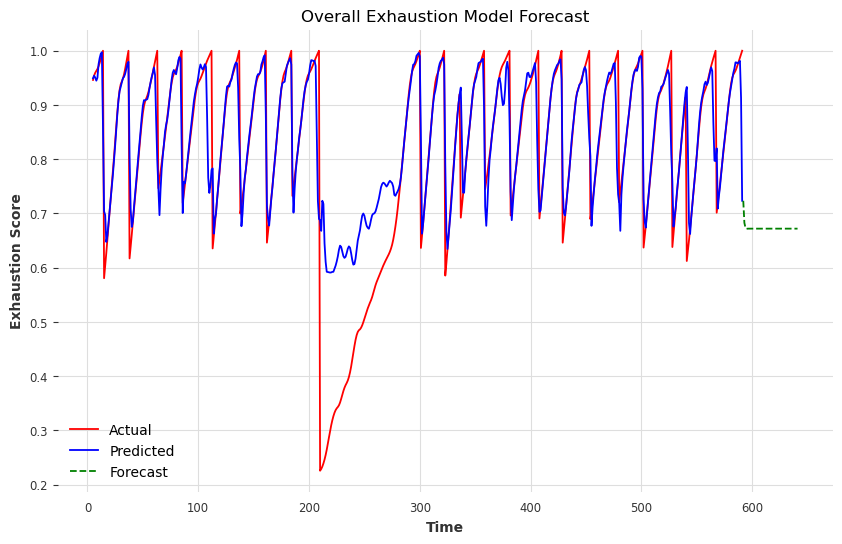

INFO: Created LSTM sequences: (587, 5, 11), (587,)


X_forecast shape: (592, 11), min: 8.951173136040325e-16, max: 90.7
X_forecast_scaled shape: (592, 11), min: -6.002000570705961, max: 5.488644275565178
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
predictions_prob shape: (587, 1), min: 5.8163332141702995e-05, max: 0.9944286942481995
After clipping - min: 5.8163332141702995e-05, max: 0.9944286942481995
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━

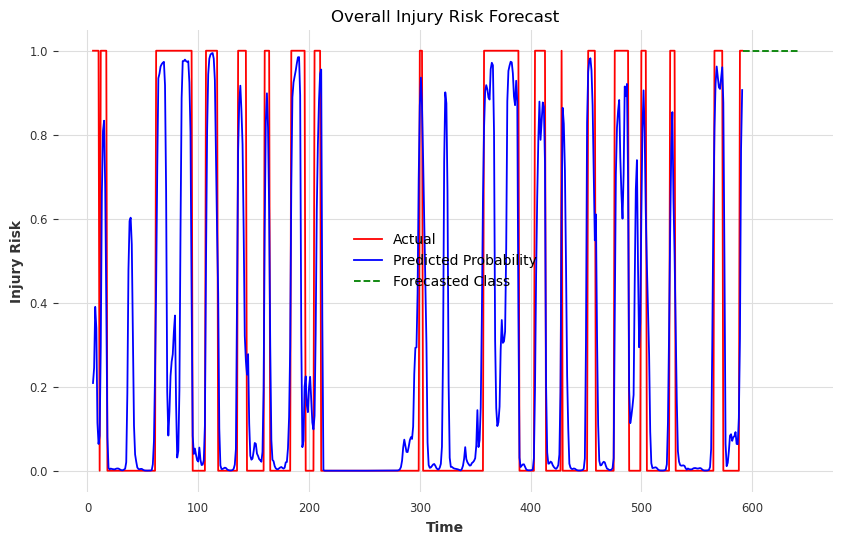

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

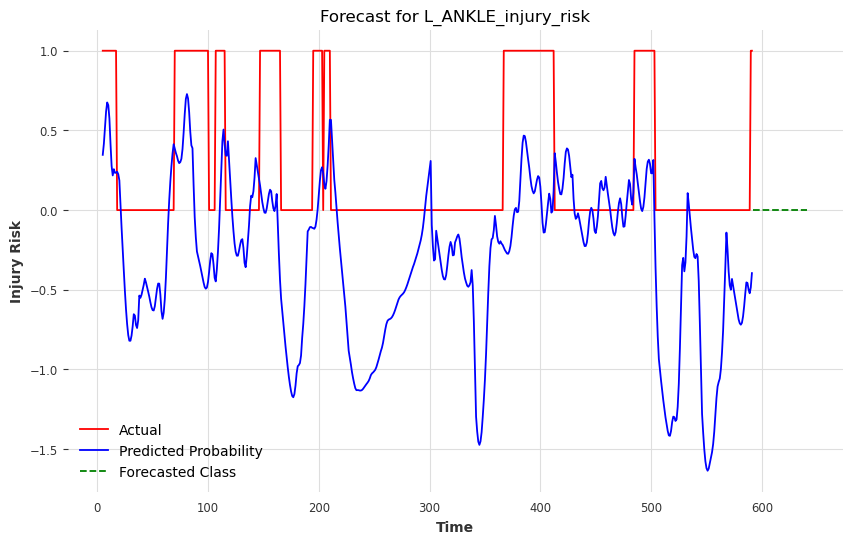

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

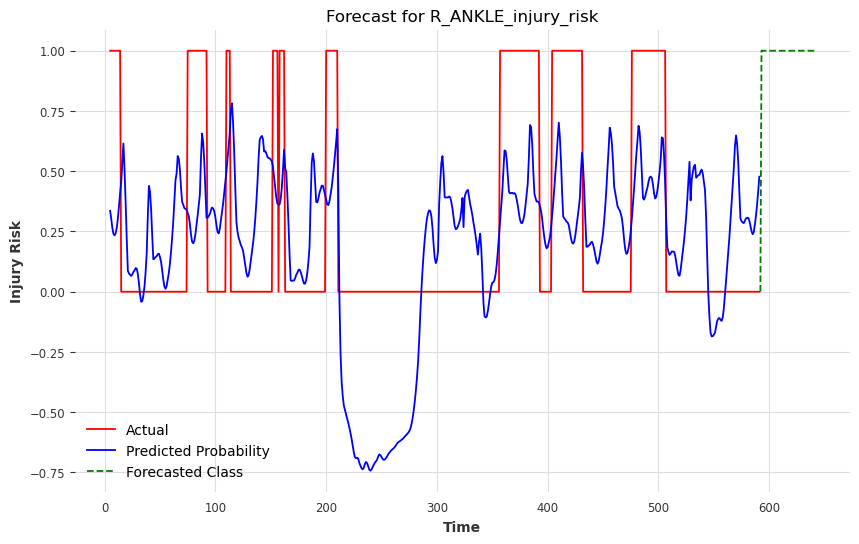

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

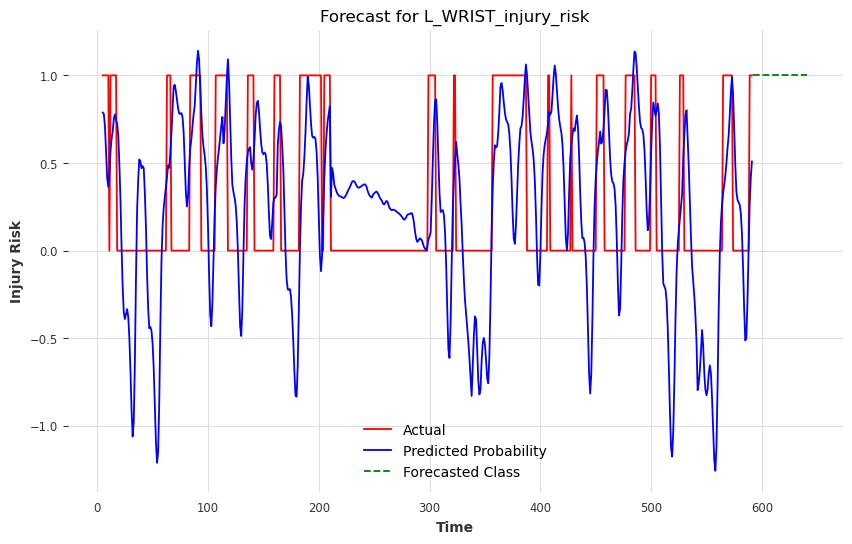

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━

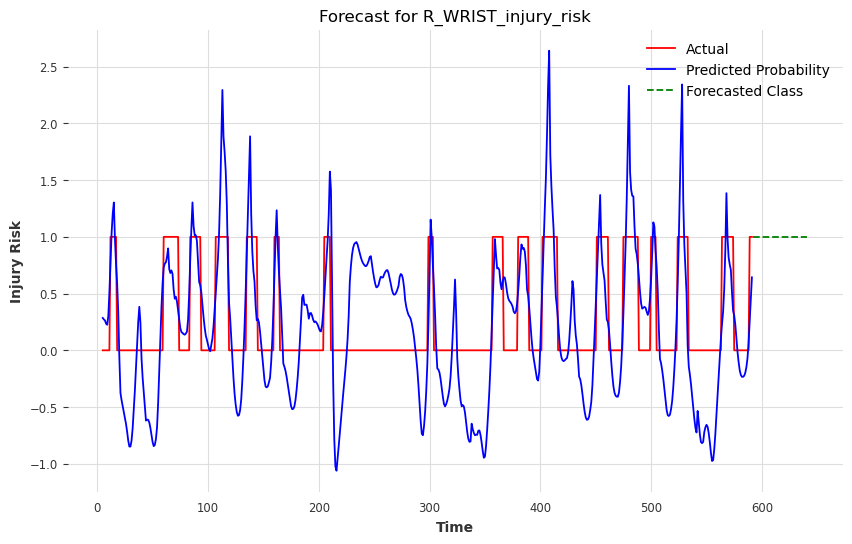

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

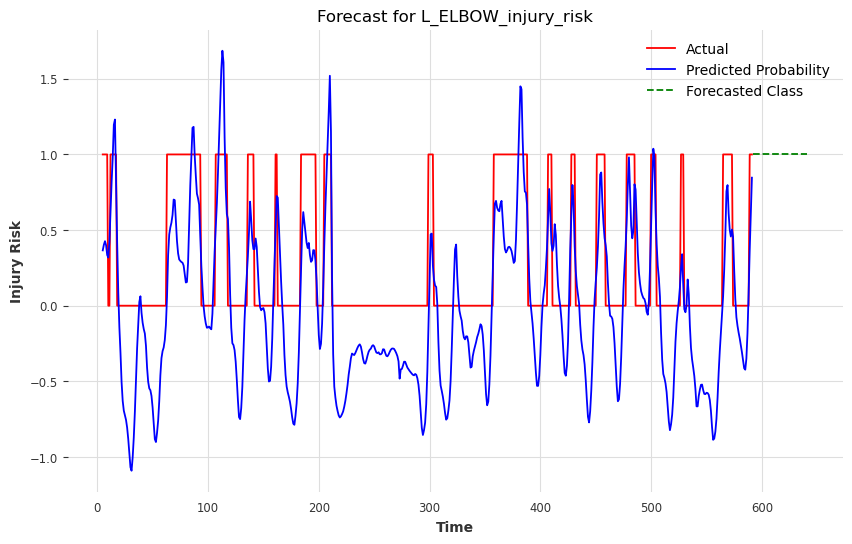

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━

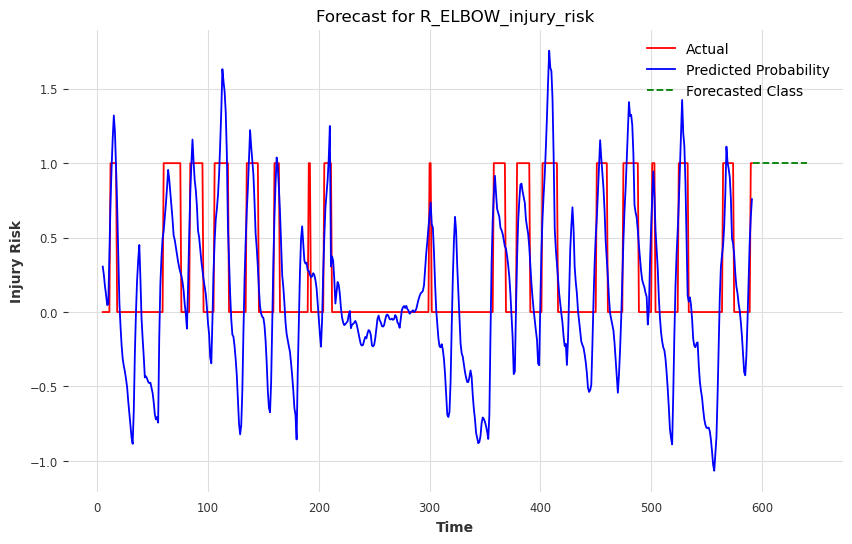

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━

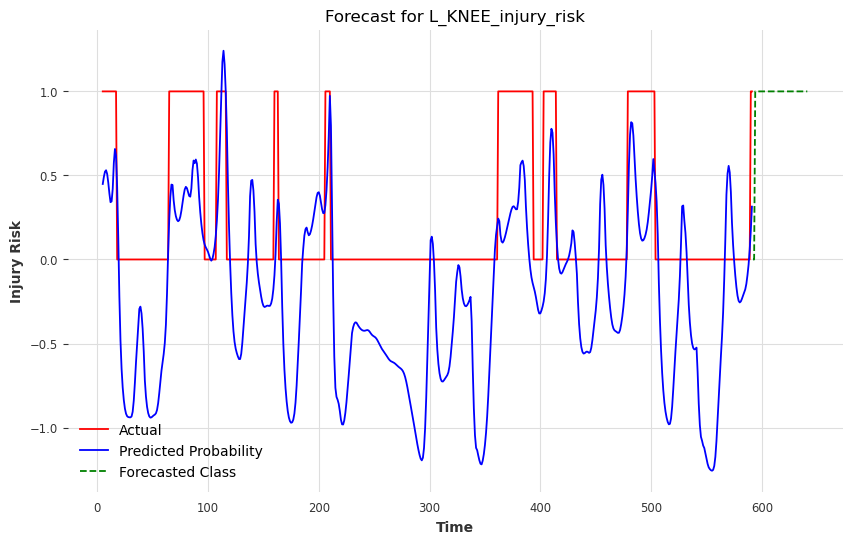

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

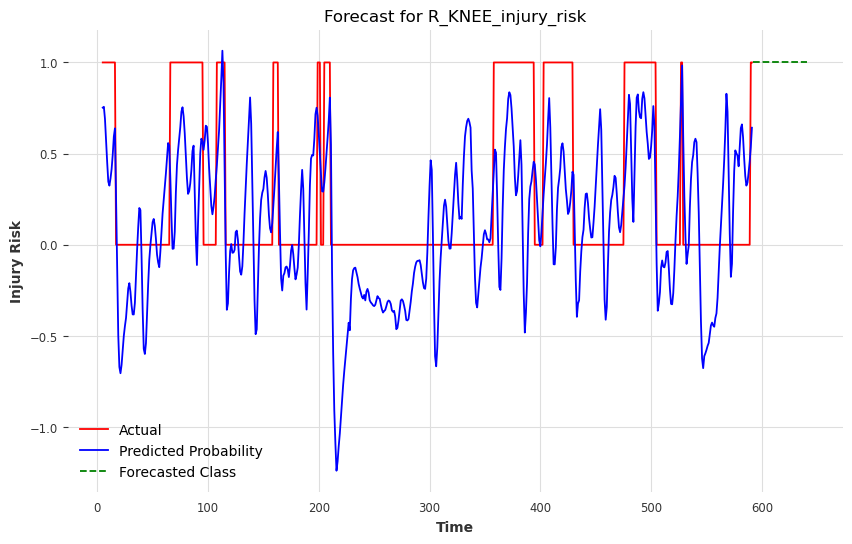

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━

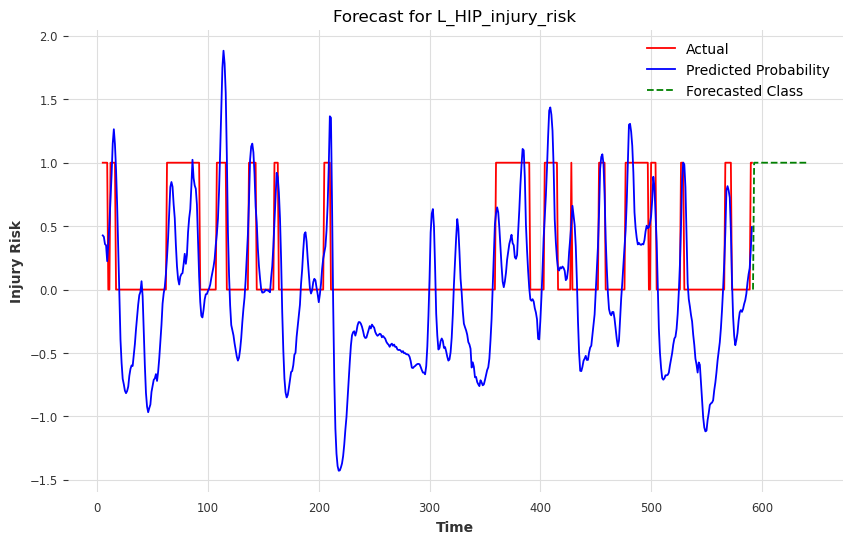

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━

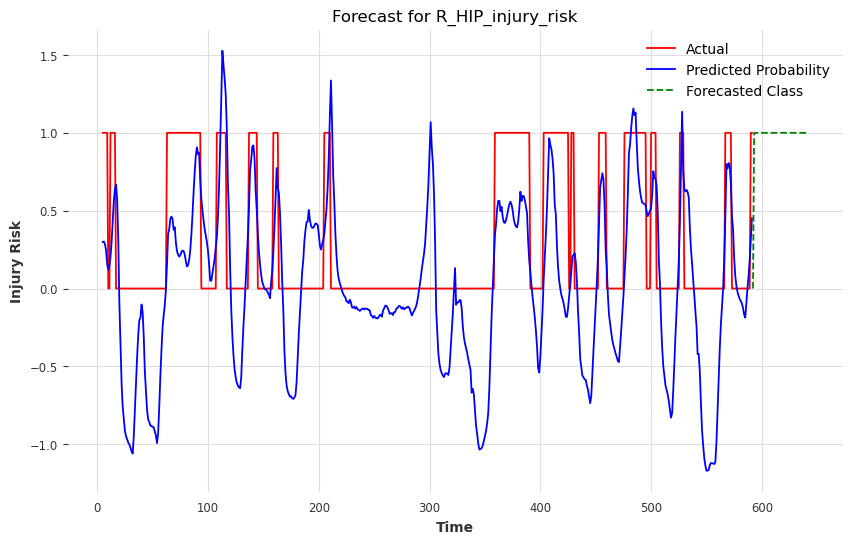

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━

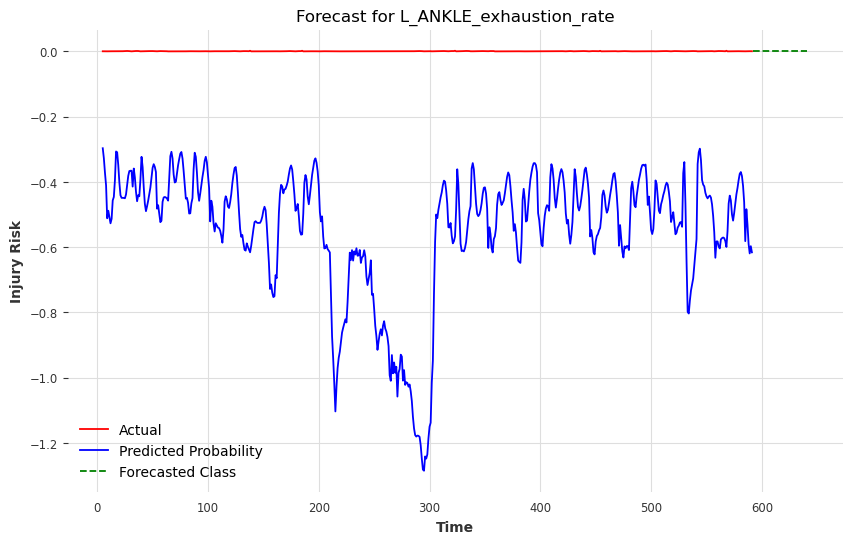

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━

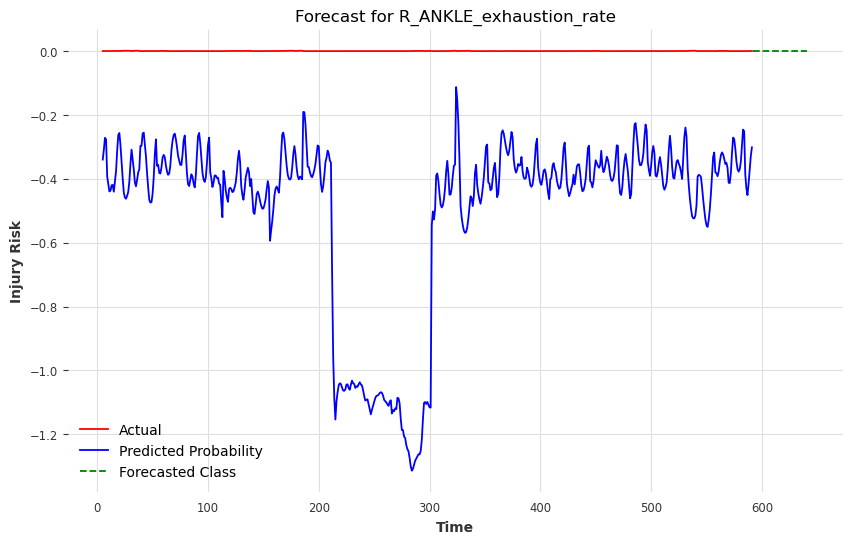

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━

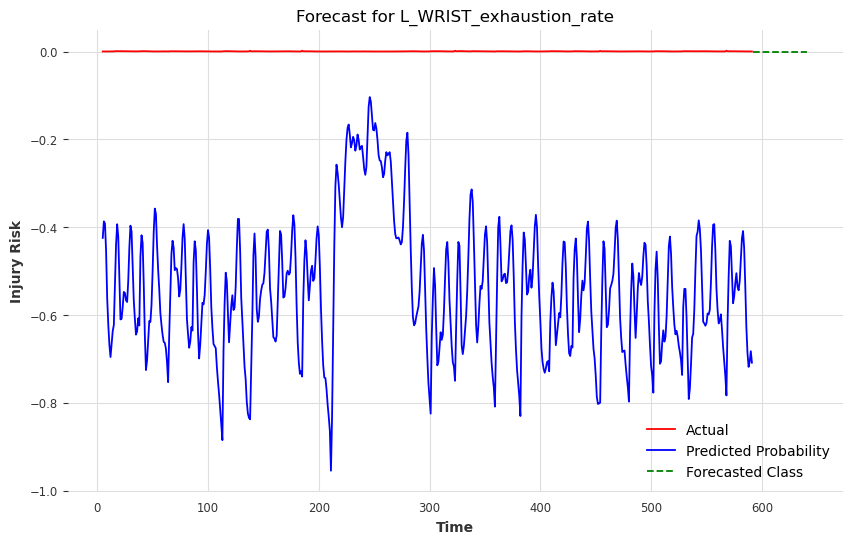

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

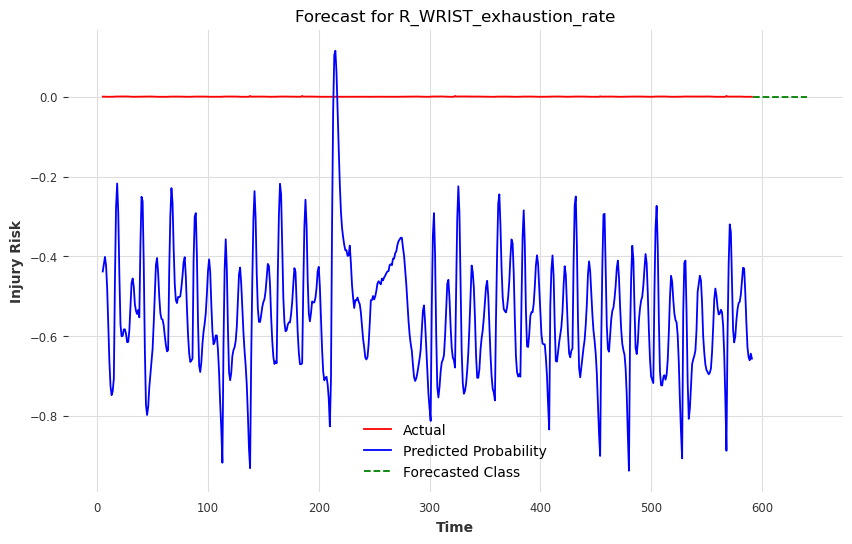

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

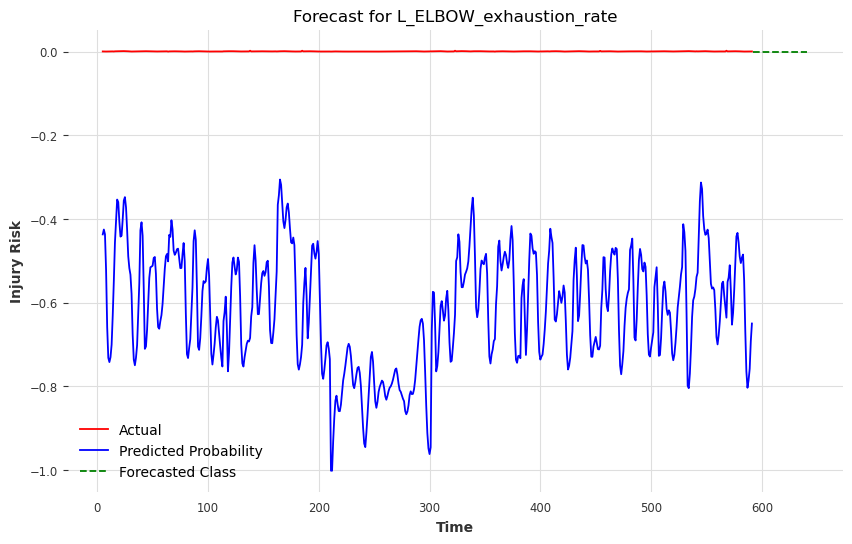

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━

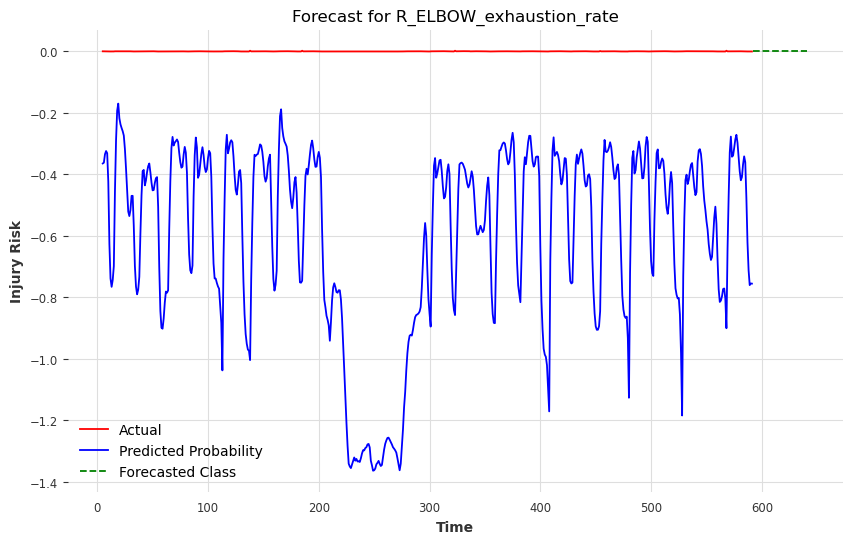

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

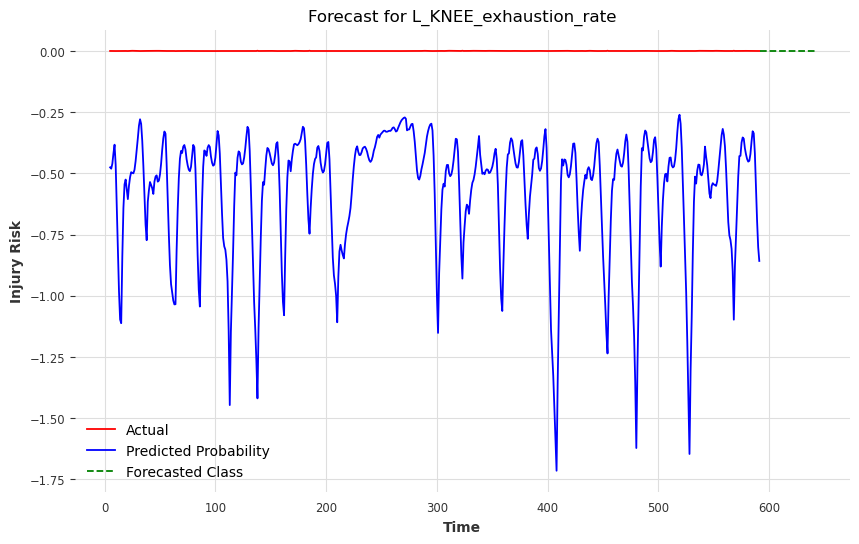

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━

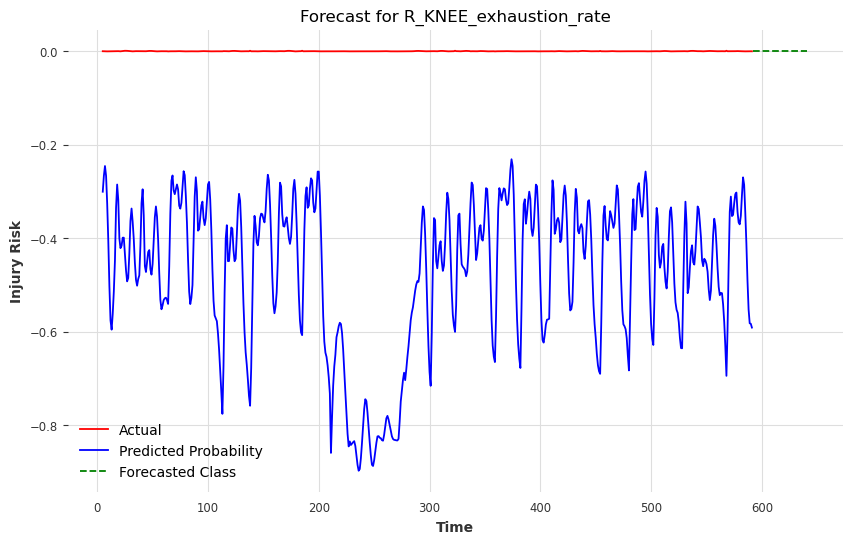

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

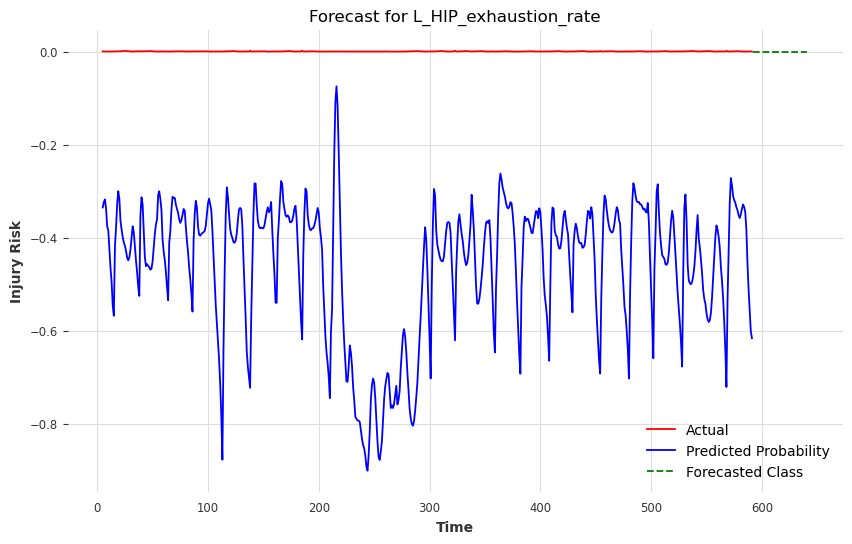

INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

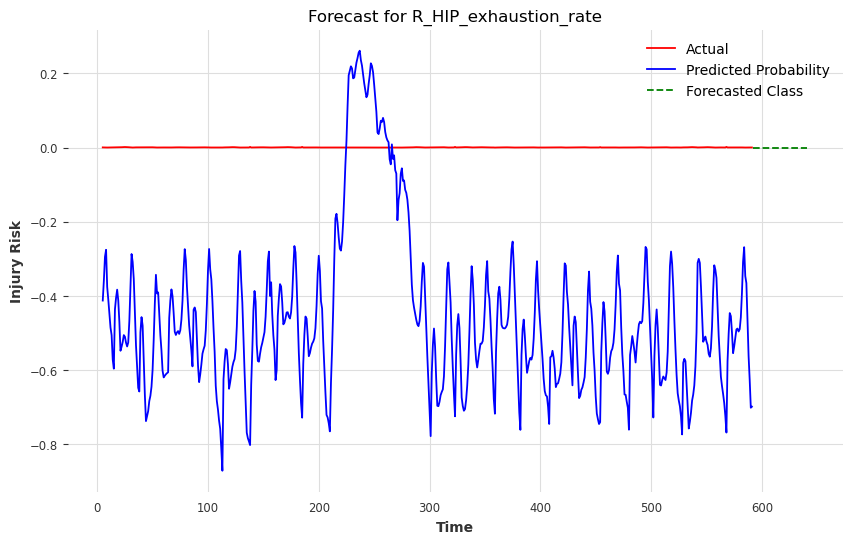

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Saved summary to ../../data/Deep_Learning_Final/model_summary_final.csv
INFO: Running conformal uncertainty integration for exhaustion model...


=== Model Summaries (Base Data) ===
                  Model            Type       MSE       MAE  R2 Score  \
0      Exhaustion Model      Regression  0.009113  0.045029  0.692947   
1          Injury Model  Classification       NaN       NaN       NaN   
2   L_ANKLE_injury_risk  Classification       NaN       NaN       NaN   
3   R_ANKLE_injury_risk  Classification       NaN       NaN       NaN   
4   L_WRIST_injury_risk  Classification       NaN       NaN       NaN   
5   R_WRIST_injury_risk  Classification       NaN       NaN       NaN   
6   L_ELBOW_injury_risk  Classification       NaN       NaN       NaN   
7   R_ELBOW_injury_risk  Classification       NaN       NaN       NaN   
8    L_KNEE_injury_risk  Classification       NaN       NaN       NaN   
9    R_KNEE_injury_risk  Classification       NaN       NaN       NaN   
10    L_HIP_injury_risk  Classification       NaN       NaN       NaN   
11    R_HIP_injury_risk  Classification       NaN       NaN       NaN   

    Accuracy  

INFO: Trained conformal model for target 'exhaustion_rate' using 14 features


Empirical coverage: 0.7618
Error plotting quantile intervals: 'numpy.ndarray' object has no attribute 'columns'


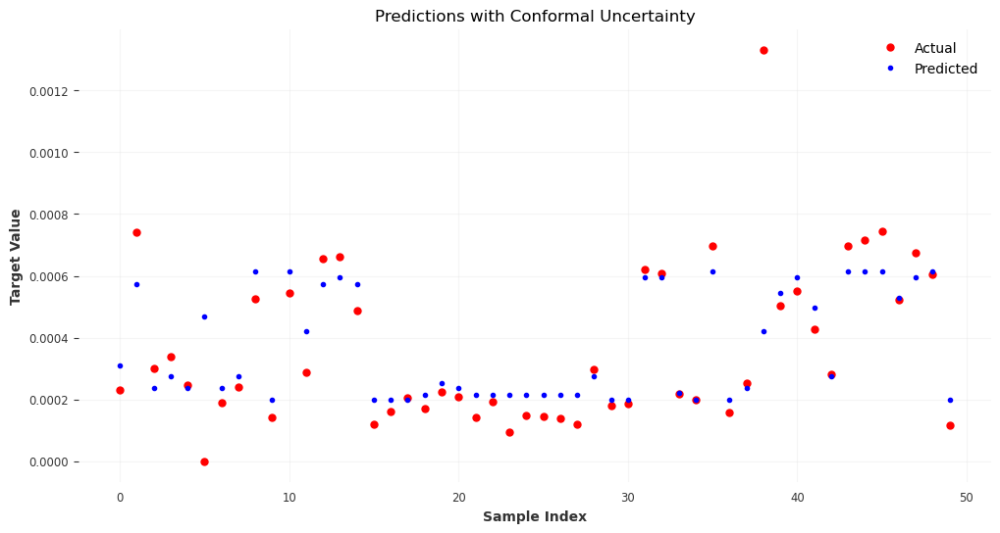

INFO: Running time series forecasting with conformal uncertainty...


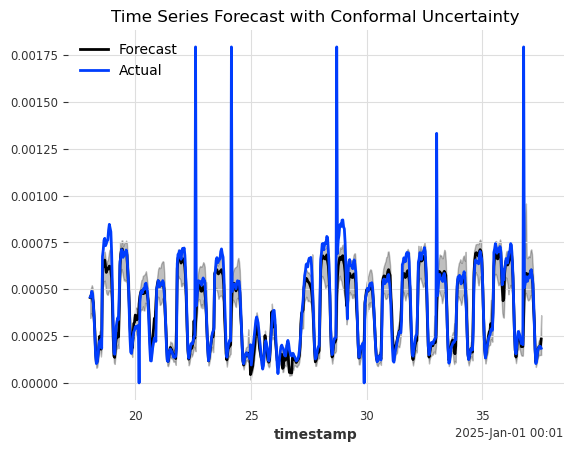

Preprocessed TimeSeries head:
component                exhaustion_rate
timestamp                               
2025-01-01 00:00:00.033         0.396481
2025-01-01 00:00:00.066         0.407974
2025-01-01 00:00:00.099         0.396633
2025-01-01 00:00:00.132         0.409024
2025-01-01 00:00:00.165         0.416775


INFO: Fitting NBEATS model for exhaustion_rate...
INFO: Train dataset contains 1749 samples.
INFO: Time series values are 64-bits; casting model to float64.


Anomaly flags (first 10 values): <TimeSeries (DataArray) (timestamp: 10, component: 1, sample: 1)> Size: 80B
array([[[0.]],

       [[0.]],

       [[0.]],

       [[0.]],

       [[0.]],

       [[0.]],

       [[0.]],

       [[0.]],

       [[0.]],

       [[0.]]])
Coordinates:
  * timestamp  (timestamp) datetime64[ns] 80B 2025-01-01T00:01:18.177000 ... ...
  * component  (component) object 8B 'exhaustion_rate'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
    metadata:           None
Anomaly scores (first 10 values): <TimeSeries (DataArray) (timestamp: 10, component: 1, sample: 1)> Size: 80B
array([[[0.17544583]],

       [[0.17221178]],

       [[0.16329776]],

       [[0.1526295 ]],

       [[0.14713443]],

       [[0.14180084]],

       [[0.13168698]],

       [[0.11756851]],

       [[0.13208544]],

       [[0.1709587 ]]])
Coordinates:
  * timestamp  (timestamp) datetime64[ns] 80B 2025-01-01T00:01:18.177000 ... ...


INFO: GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO: 
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.3 M  | train
-------------------------------------------------------------
6.3 M     Trainable params
1.4 K     Non-trainable params
6.3 M     Total params
25.205    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
INFO: Fitting ExponentialSmoothing model for exhaustion_rate...
INFO: Generating forecasts...
INFO: GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO: Computing metrics...
INFO: Darts metrics for exhaustion_rate:
                   MAE      RMSE      SMAPE
NBEATS        0.135291  0.160437  60.513207
ExpSmoothing  0.116982  0.139461  54.443056


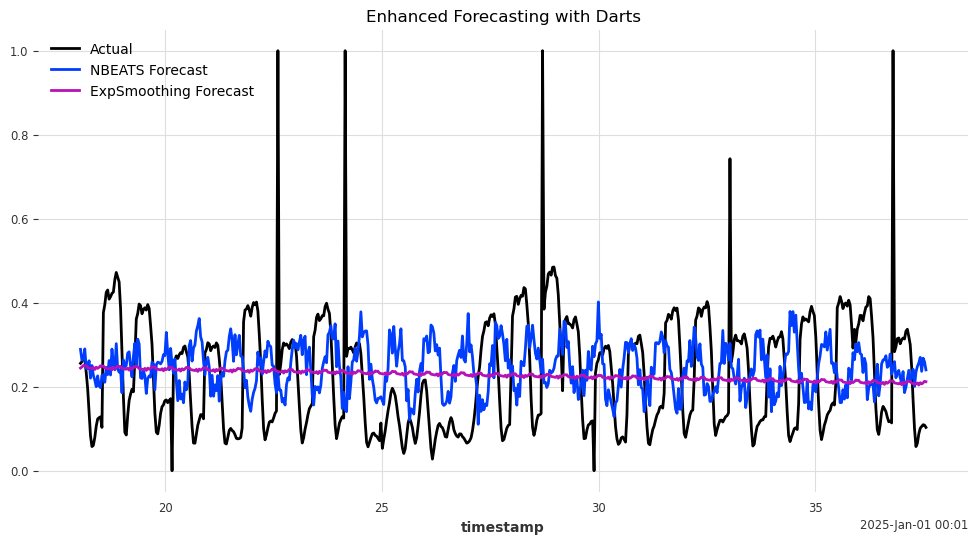

INFO: GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO: Performed temporal train-test split with test size = 0.2
INFO: Training data shape: (100, 233), Testing data shape: (25, 233)
INFO: Features provided for training exhaustion model: ['by_trial_exhaustion_score', 'power_avg_5', 'L_KNEE_angle', 'R_ELBOW_angle', 'joint_energy', 'R_ELBOW_energy', 'joint_power', 'wrist_asymmetry', 'R_ELBOW_ongoing_power', 'L_SHOULDER_ROM']
INFO: Available train_data columns: ['trial_id', 'joint_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'joint_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'elbow_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 'hip_asymmetry', 'L_ELBOW_a

Rolling MAPE distribution: 198.73804608067505

Forecast Metrics:
                   MAE      RMSE      SMAPE
NBEATS        0.135291  0.160437  60.513207
ExpSmoothing  0.116982  0.139461  54.443056
Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 1.0313 - val_loss: 11.2808
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 1.1636 - val_loss: 11.4303
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.8565 - val_loss: 11.5342
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.9588 - val_loss: 11.6296
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.9643 - val_loss: 11.7114
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.9931 - val_loss: 11.7904


INFO: Features provided for training injury model: ['by_trial_exhaustion_score', 'R_WRIST_ROM', 'elbow_asymmetry', 'energy_acceleration', 'L_WRIST_angle', 'rolling_power_std', 'wrist_asymmetry', 'R_KNEE_angle', 'L_HIP_ROM', 'R_ELBOW_angle']
INFO: Available train_data columns: ['trial_id', 'joint_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'joint_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'elbow_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 'hip_asymmetry', 'L_ELBOW_angle', 'R_ELBOW_angle', 'L_WRIST_angle', 'R_WRIST_angle', 'L_KNEE_angle', 'R_KNEE_angle', 'L_SHOULDER_ROM', 'R_SHOULDER_ROM', 'L_WRIST_ROM', 'R_WRIST_ROM', 'L_KNEE_ROM', 'R_KNEE_ROM', 'L_HIP_ROM', 'R_HIP_ROM', 'exhaustion_rate', 'by_trial_exhaustion_score', 'injur

Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.6320 - loss: 0.6854 - val_accuracy: 0.3000 - val_loss: 0.7096
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6597 - loss: 0.6751 - val_accuracy: 0.7500 - val_loss: 0.6814
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.6731 - loss: 0.6620 - val_accuracy: 0.9500 - val_loss: 0.6585
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8129 - loss: 0.6399 - val_accuracy: 0.9000 - val_loss: 0.6338
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8718 - loss: 0.6248 - val_accuracy: 0.9000 - val_loss: 0.6085
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8952 - loss: 0.5950 - val_accuracy: 0.9000 - val_loss: 0.5788
Epoch 7/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9306 - loss: 0.5728 - val_accuracy: 0.9000 - val_loss: 0.5486
Epoch 8/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.8614 - loss: 0.5607 - val_accuracy: 0.9000 - val_loss:

INFO: Created LSTM sequences: (20, 5, 10), (20,)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━

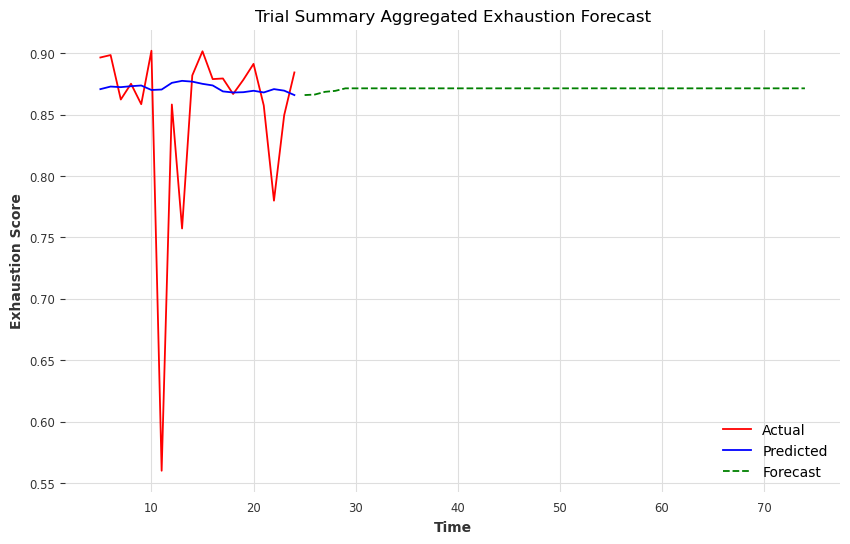

INFO: Created LSTM sequences: (20, 5, 10), (20,)


X_forecast shape: (25, 10), min: -0.005787108962595775, max: 152.78361387226158
X_forecast_scaled shape: (25, 10), min: -13.284210254697728, max: 4.293215660723598
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
predictions_prob shape: (20, 1), min: 0.7545647621154785, max: 0.9890060424804688
After clipping - min: 0.7545647621154785, max: 0.9890060424804688
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 

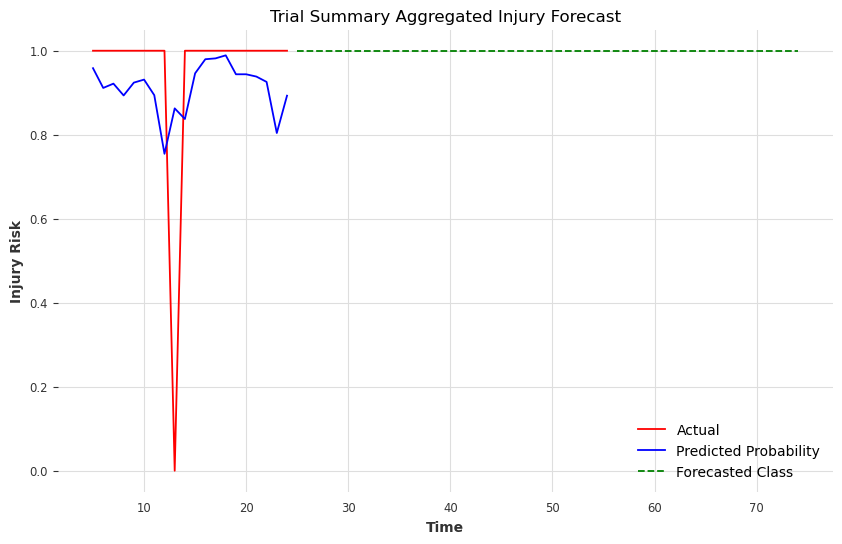

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[DEBUG] Predictions stats: min=0.8658998012542725, max=0.8774811029434204, nan_count=0
[DEBUG] True values stats: min=0.5600770941088724, max=0.9020053382187211, nan_count=0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
[DEBUG] Predicted probabilities stats: min=0.7545647621154785, max=0.9890060424804688, nan_count=0


INFO: Saved summary to ../../data/Deep_Learning_Final/model_summary_final.csv
INFO: Performed temporal train-test split with test size = 0.2
INFO: Training data shape: (400, 234), Testing data shape: (100, 234)
INFO: Features provided for training exhaustion model: ['by_trial_exhaustion_score', 'power_avg_5', 'joint_power', 'R_ELBOW_energy', 'L_SHOULDER_ROM', 'R_SHOULDER_ROM', 'R_WRIST_ongoing_power', 'L_KNEE_angle', 'R_KNEE_angle', 'rolling_hr_mean']
INFO: Available train_data columns: ['trial_id', 'shooting_phases', 'joint_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'joint_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'elbow_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 'hip_asymmetry', 'L_ELBOW_angle', 'R_ELBOW_angle', 'L_WRI

=== Model Summaries (Trial Summary Aggregated Data) ===
              Model            Type       MSE       MAE  R2 Score  Accuracy  \
0  Exhaustion Model      Regression  0.006215  0.038955 -0.080033       NaN   
1      Injury Model  Classification       NaN       NaN       NaN      0.95   

   Precision  Recall  F1 Score  
0        NaN     NaN       NaN  
1       0.95     1.0  0.974359  
Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.9876 - val_loss: 1.1732
Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8385 - val_loss: 1.0534
Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7133 - val_loss: 0.9372
Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5833 - val_loss: 0.8543
Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4871 - val_loss: 0.7790
Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3729 - val_loss: 0.7037
Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2842 - val_loss: 0.6709
Epoch 8/200

INFO: Features provided for training injury model: ['by_trial_exhaustion_score', 'power_avg_5', 'rolling_hr_mean', 'R_HIP_energy', 'R_WRIST_angle', 'elbow_asymmetry', 'R_HIP_ongoing_power', 'R_WRIST_ROM', 'L_ELBOW_energy', 'L_ELBOW_angle']
INFO: Available train_data columns: ['trial_id', 'shooting_phases', 'joint_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'joint_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'elbow_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 'hip_asymmetry', 'L_ELBOW_angle', 'R_ELBOW_angle', 'L_WRIST_angle', 'R_WRIST_angle', 'L_KNEE_angle', 'R_KNEE_angle', 'L_SHOULDER_ROM', 'R_SHOULDER_ROM', 'L_WRIST_ROM', 'R_WRIST_ROM', 'L_KNEE_ROM', 'R_KNEE_ROM', 'L_HIP_ROM', 'R_HIP_ROM', 'exhaustion_rate', 'by_trial_exhaust

Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.4270 - loss: 0.7107 - val_accuracy: 0.5789 - val_loss: 0.6841
Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6375 - loss: 0.6689 - val_accuracy: 0.5684 - val_loss: 0.6575
Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7009 - loss: 0.6337 - val_accuracy: 0.5684 - val_loss: 0.6377
Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6981 - loss: 0.6073 - val_accuracy: 0.5895 - val_loss: 0.6201
Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6936 - loss: 0.6015 - val_accuracy: 0.6211 - val_loss: 0.6022
Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7185 - loss: 0.5598 - val_accuracy: 0.6632 - val_loss: 0.5833
Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7339 - loss: 0.5498 - val_accuracy: 0.6421 - val_loss: 0.5680
Epoch 8/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7478 - loss: 0.5309 - val_accuracy: 0.6421 - 

INFO: Created LSTM sequences: (95, 5, 10), (95,)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

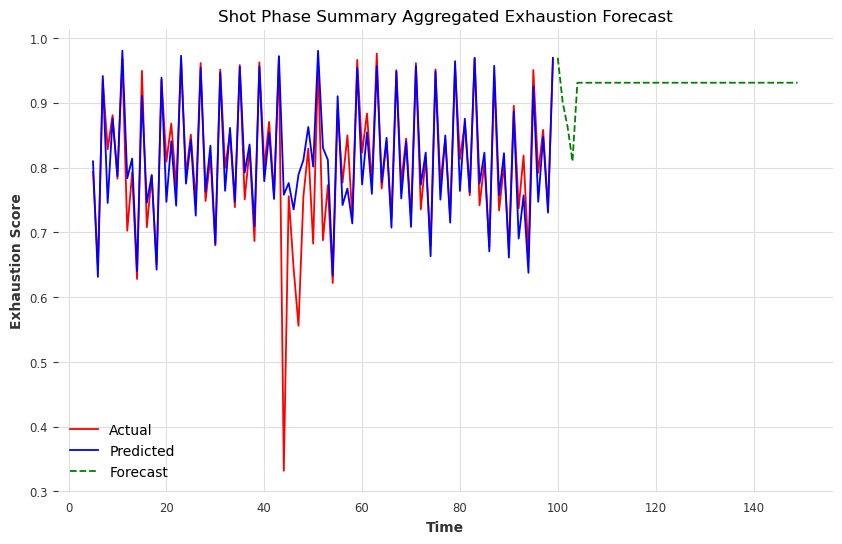

INFO: Created LSTM sequences: (95, 5, 10), (95,)


X_forecast shape: (100, 10), min: 0.0026113632521078123, max: 101.88397552907918
X_forecast_scaled shape: (100, 10), min: -5.004162085986834, max: 2.6798542288193112
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
predictions_prob shape: (95, 1), min: 0.0007729210774414241, max: 0.9901779294013977
After clipping - min: 0.0007729210774414241, max: 0.9901779294013977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/s

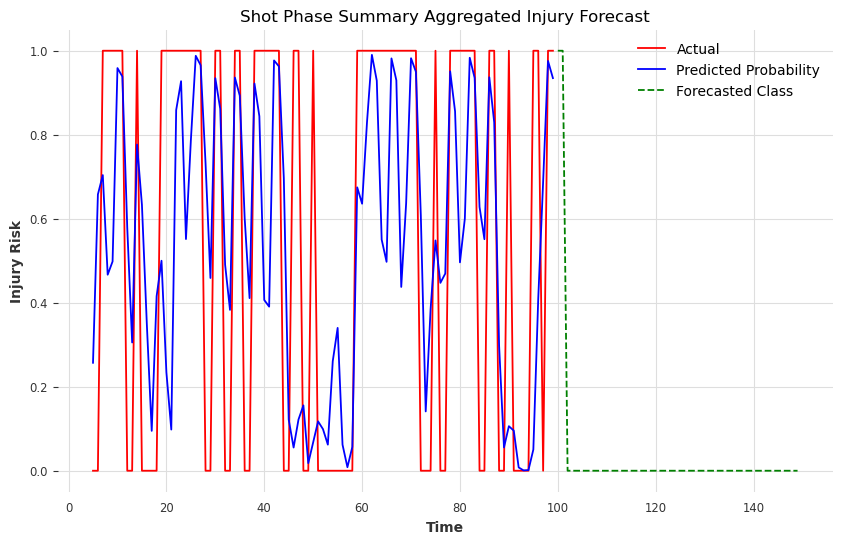

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
[DEBUG] Predictions stats: min=0.6313005685806274, max=0.9805600643157959, nan_count=0
[DEBUG] True values stats: min=0.3319325554462927, max=0.9761321942572885, nan_count=0
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


INFO: Saved summary to ../../data/Deep_Learning_Final/model_summary_final.csv


[DEBUG] Predicted probabilities stats: min=0.0007729210774414241, max=0.9901779294013977, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


=== Model Summaries (Shot Phase Summary Aggregated Data) ===
              Model            Type       MSE       MAE  R2 Score  Accuracy  \
0  Exhaustion Model      Regression  0.003639  0.029593  0.712451       NaN   
1      Injury Model  Classification       NaN       NaN       NaN  0.736842   

   Precision    Recall  F1 Score  
0        NaN       NaN       NaN  
1        0.8  0.727273  0.761905  
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.6354780197143555, max=0.7278618812561035, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-0.7427499890327454, max=0.7821632623672485, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.2558834552764893, max=1.1407620906829834, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.061299204826355, max=2.6407618522644043, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.0911200046539307, max=1.685672402381897, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.065861701965332, max=1.7551684379577637, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.2568713426589966, max=1.2419710159301758, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.239518642425537, max=1.0643306970596313, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.4278863668441772, max=1.8825637102127075, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)
INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predicted probabilities stats: min=-1.1702799797058105, max=1.5272586345672607, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predictions stats: min=-1.3216257095336914, max=2.733318567276001, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.00196970268564941, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
[DEBUG] Predictions stats: min=-3.0726735591888428, max=2.7555675506591797, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0012373941925828977, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predictions stats: min=-1.5728039741516113, max=1.7842345237731934, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0018528358525311942, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] Predictions stats: min=-1.5083907842636108, max=1.2291656732559204, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0021498048098221095, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
[DEBUG] Predictions stats: min=-1.7332754135131836, max=1.8367189168930054, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0020334351110385665, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
[DEBUG] Predictions stats: min=-1.793003797531128, max=1.2234139442443848, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] True values stats: min=0.0, max=0.002523974494981813, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
[DEBUG] Predictions stats: min=-1.2394980192184448, max=2.691464900970459, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0013848643876618006, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
[DEBUG] Predictions stats: min=-1.2901726961135864, max=2.695559024810791, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0014396395589816445, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
[DEBUG] Predictions stats: min=-1.4392664432525635, max=2.683424711227417, nan_count=0


INFO: Created LSTM sequences: (587, 5, 10), (587,)


[DEBUG] True values stats: min=0.0, max=0.0018185686656852103, nan_count=0
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
[DEBUG] Predictions stats: min=-2.1706416606903076, max=2.4883267879486084, nan_count=0
[DEBUG] True values stats: min=0.0, max=0.0018113783629711156, nan_count=0
=== Final Regression Summary ===
              Model        Type       MSE       MAE  R2 Score  Accuracy  \
0  Exhaustion Model  Regression  0.009113  0.045029  0.692947       NaN   
1  Exhaustion Model  Regression  0.006215  0.038955 -0.080033       NaN   
2  Exhaustion Model  Regression  0.003639  0.029593  0.712451       NaN   

   Precision  Recall  F1 Score           Dataset  
0        NaN     NaN       NaN              Base  
1        NaN     NaN       NaN  Trial Aggregated  
2        NaN     NaN       NaN   Shot Aggregated  

=== Final Classification Summary ===
                  Model            Type  MSE  MAE  R2 Score  Accuracy  \
0          Injury Model  Classification  NaN  NaN       NaN  0.884157   
1

In [8]:
# %%writefile ml/preprocess_train_predict/conformal_tights.py

import numpy as np
import pandas as pd
import json
import sys
import logging
from pathlib import Path

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    mean_absolute_error, r2_score, accuracy_score,
    precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
)
import matplotlib.pyplot as plt
import seaborn as sns
from ml.load_and_prepare_data.load_data_and_analyze import (
    load_data, prepare_joint_features, 
    feature_engineering, summarize_data, check_and_drop_nulls,
    prepare_base_datasets)

from ml.feature_selection.feature_selection import (
    load_top_features, perform_feature_importance_analysis, save_top_features,
    analyze_joint_injury_features, check_for_invalid_values,
    perform_feature_importance_analysis, analyze_and_display_top_features, 
    run_feature_importance_analysis, run_feature_import_and_load_top_features)

from ml.preprocess_train_predict.base_training import (
    temporal_train_test_split, scale_features, create_sequences, train_exhaustion_model, 
    train_injury_model,  train_joint_models, forecast_and_plot_exhaustion, forecast_and_plot_injury,
    forecast_and_plot_joint, summarize_regression_model, summarize_classification_model, 
    summarize_joint_models, summarize_all_models, final_model_summary, 
    summarize_joint_exhaustion_models
    )
from ml.preprocess_train_predict.conformal_tights import (
    train_conformal_model, predict_with_uncertainty, plot_conformal_results, add_time_series_forecasting,
    add_conformal_to_exhaustion_model
    )
from ml.preprocess_train_predict.darts_models_for_comparison import ( 
    preprocess_timeseries_darts, detect_anomalies_with_darts, enhanced_forecasting_with_darts_and_metrics)



# --- Main Script: Running Three Separate Analyses ---
if __name__ == "__main__":
    import os
    from pathlib import Path
    from ml.load_and_prepare_data.load_data_and_analyze import (
        load_data, prepare_joint_features, feature_engineering, summarize_data, check_and_drop_nulls
    )
    debug = True
    importance_threshold = 0.01
    csv_path = "../../data/processed/final_granular_dataset.csv"
    json_path = "../../data/basketball/freethrow/participant_information.json"
    output_dir = "../../data/Deep_Learning_Final"
    
    base_feature_dir = os.path.join(output_dir, "feature_lists/base")
    trial_feature_dir = os.path.join(output_dir, "feature_lists/trial_summary")
    shot_feature_dir = os.path.join(output_dir, "feature_lists/shot_phase_summary")
    
    data, trial_df, shot_df = prepare_base_datasets(csv_path, json_path, debug=debug)
    numeric_features = data.select_dtypes(include=[np.number]).columns.tolist()
    summary_targets = ['exhaustion_rate', 'injury_risk']
    trial_summary_features = [col for col in trial_df.columns if col not in summary_targets]
    trial_summary_features = [col for col in trial_summary_features if col in numeric_features]
    shot_summary_features = [col for col in shot_df.columns if col not in summary_targets]
    shot_summary_features = [col for col in shot_summary_features if col in numeric_features]
    print("Available target columns:", [c for c in data.columns if "exhaustion" in c])
    # ========================================
    # 1) Overall Base Dataset (including Joint-Specific Targets)
    # ========================================
    features = [
        'joint_energy', 'joint_power', 'energy_acceleration',
        'elbow_asymmetry', 'hip_asymmetry', 'ankle_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 
        '1stfinger_asymmetry', '5thfinger_asymmetry',
        'elbow_power_ratio', 'hip_power_ratio', 'ankle_power_ratio', 'wrist_power_ratio', 
        'knee_power_ratio', '1stfinger_power_ratio', '5thfinger_power_ratio',
        'L_KNEE_ROM', 'L_KNEE_ROM_deviation', 'L_KNEE_ROM_extreme',
        'R_KNEE_ROM', 'R_KNEE_ROM_deviation', 'R_KNEE_ROM_extreme',
        'L_SHOULDER_ROM', 'L_SHOULDER_ROM_deviation', 'L_SHOULDER_ROM_extreme',
        'R_SHOULDER_ROM', 'R_SHOULDER_ROM_deviation', 'R_SHOULDER_ROM_extreme',
        'L_HIP_ROM', 'L_HIP_ROM_deviation', 'L_HIP_ROM_extreme',
        'R_HIP_ROM', 'R_HIP_ROM_deviation', 'R_HIP_ROM_extreme',
        'L_ANKLE_ROM', 'L_ANKLE_ROM_deviation', 'L_ANKLE_ROM_extreme',
        'R_ANKLE_ROM', 'R_ANKLE_ROM_deviation', 'R_ANKLE_ROM_extreme',
        'exhaustion_lag1', 'power_avg_5', 'rolling_power_std', 'rolling_hr_mean',
        'time_since_start', 'ema_exhaustion', 'rolling_exhaustion', 'rolling_energy_std',
        'simulated_HR',
        'player_height_in_meters', 'player_weight__in_kg'
    ]
    base_targets = ['exhaustion_rate', 'injury_risk']
    joints = ['ANKLE', 'WRIST', 'ELBOW', 'KNEE', 'HIP']
    joint_injury_targets = [f"{side}_{joint}_injury_risk" for joint in joints for side in ['L', 'R']]
    joint_exhaustion_targets = [f"{side}_{joint}_exhaustion_rate" for joint in joints for side in ['L', 'R']]
    joint_targets = joint_injury_targets + joint_exhaustion_targets
    all_targets = base_targets + joint_targets

    logging.info("=== Base Dataset Analysis (Overall + Joint-Specific) ===")
    base_loaded_features = run_feature_import_and_load_top_features(
        dataset=data,
        features=features,
        targets=all_targets,
        base_output_dir=output_dir,
        output_subdir="feature_lists/base",
        debug=debug,
        dataset_label="Base Data",
        importance_threshold=importance_threshold,
        n_top=10,
        run_analysis=False
    )
    print(f"Base Loaded Features: {base_loaded_features}")
    
    joint_feature_dict = {}
    for target in joint_targets:
        try:
            feat_loaded = base_loaded_features.get(target, [])
            logging.info(f"Test Load: Features for {target}: {feat_loaded}")
            joint_feature_dict[target] = feat_loaded
        except Exception as e:
            logging.error(f"Error loading features for {target}: {e}")
    
    # ========================================
    # 2) Trial Summary Dataset Analysis
    # ========================================

    
    logging.info("=== Trial Summary Dataset Analysis ===")
    trial_loaded_features = run_feature_import_and_load_top_features(
        dataset=trial_df,
        features=trial_summary_features,
        targets=summary_targets,
        base_output_dir=output_dir,
        output_subdir="feature_lists/trial_summary",
        debug=debug,
        dataset_label="Trial Summary Data",
        importance_threshold=importance_threshold,
        n_top=10,
        run_analysis=False
    )
    features_exhaustion_trial = trial_loaded_features.get('exhaustion_rate', [])
    features_injury_trial = trial_loaded_features.get('injury_risk', [])
    trial_summary_data = trial_df.copy()
    
    # ========================================
    # 3) Shot Phase Summary Dataset Analysis
    # ========================================

    
    logging.info("=== Shot Phase Summary Dataset Analysis ===")
    shot_loaded_features = run_feature_import_and_load_top_features(
        dataset=shot_df,
        features=shot_summary_features,
        targets=summary_targets,
        base_output_dir=output_dir,
        output_subdir="feature_lists/shot_phase_summary",
        debug=debug,
        dataset_label="Shot Phase Summary Data",
        importance_threshold=importance_threshold,
        n_top=10,
        run_analysis=False
    )
    features_exhaustion_shot = shot_loaded_features.get('exhaustion_rate', [])
    features_injury_shot = shot_loaded_features.get('injury_risk', [])
    shot_phase_summary_data = shot_df.copy()

    # ------------------------------
    # 5. Split Base Data for Training Models
    # ------------------------------
    train_data, test_data = temporal_train_test_split(data, test_size=0.2)
    timesteps = 5

    # Hyperparameters and architecture definitions.
    hyperparams = {
        "epochs": 200,
        "batch_size": 32,
        "early_stop_patience": 5
    }
    arch_exhaustion = {
        "num_lstm_layers": 1,
        "lstm_units": 64,
        "dropout_rate": 0.2,
        "dense_units": 1,
        "dense_activation": None
    }
    arch_injury = {
        "num_lstm_layers": 1,
        "lstm_units": 64,
        "dropout_rate": 0.2,
        "dense_units": 1,
        "dense_activation": "sigmoid"
    }
    
    # For demonstration, define features/targets (you can adjust these as needed)
    features_exhaustion = [
        'joint_power', 
        'joint_energy', 
        'elbow_asymmetry',  
        'L_WRIST_angle', 'R_WRIST_angle',  # Updated: removed "wrist_angle"
        'exhaustion_lag1', 
        'power_avg_5',
        'simulated_HR',
        'player_height_in_meters',
        'player_weight__in_kg'
    ]
    target_exhaustion = 'exhaustion_rate'

    features_injury = [
        'joint_power', 
        'joint_energy', 
        'elbow_asymmetry',  
        'knee_asymmetry', 
        'L_WRIST_angle', 'R_WRIST_angle',  # Updated: removed "wrist_angle"
        'exhaustion_lag1', 
        'power_avg_5',
        'simulated_HR',
        'player_height_in_meters',
        'player_weight__in_kg'
    ]
    target_injury = 'injury_risk'
    # ------------------------------
    # 6a. Train Models on Base Data for Overall Exhaustion and Injury Risk
    # ------------------------------
    model_exhaustion, scaler_exhaustion, target_scaler, X_val_exh, y_val_exh = train_exhaustion_model(
        train_data, test_data, features_exhaustion, timesteps,
        epochs=hyperparams["epochs"],
        batch_size=hyperparams["batch_size"],
        early_stop_patience=hyperparams["early_stop_patience"],
        num_lstm_layers=arch_exhaustion["num_lstm_layers"],
        lstm_units=arch_exhaustion["lstm_units"],
        dropout_rate=arch_exhaustion["dropout_rate"],
        dense_units=arch_exhaustion["dense_units"],
        dense_activation=arch_exhaustion["dense_activation"]
    )
    model_injury, scaler_injury, X_val_injury, y_val_injury = train_injury_model(
        train_data, test_data, features_injury, timesteps,
        epochs=hyperparams["epochs"],
        batch_size=hyperparams["batch_size"],
        num_lstm_layers=arch_injury["num_lstm_layers"],
        lstm_units=arch_injury["lstm_units"],
        dropout_rate=arch_injury["dropout_rate"],
        dense_units=arch_injury["dense_units"],
        dense_activation=arch_injury["dense_activation"]
    )
    # For joint models, train using the base data and the corresponding feature lists.
    joint_models = {}
    for joint_target, features_list in joint_feature_dict.items():
        try:
            logging.info(f"Training joint-specific injury model for {joint_target} using features: {features_list}")
            model, scaler, X_val_joint, y_val_joint = train_injury_model(
                train_data, test_data,
                features=features_list,
                timesteps=timesteps, 
                epochs=hyperparams["epochs"],
                batch_size=hyperparams["batch_size"],
                early_stop_patience=hyperparams["early_stop_patience"],
                num_lstm_layers=arch_exhaustion["num_lstm_layers"],
                lstm_units=arch_exhaustion["lstm_units"],
                dropout_rate=arch_exhaustion["dropout_rate"],
                dense_units=arch_exhaustion["dense_units"],
                dense_activation=arch_exhaustion["dense_activation"],
                target_col=joint_target
            )
            joint_models[joint_target] = {
                'model': model,
                'features': features_list,
                'scaler': scaler
            }
            logging.info(f"Successfully trained joint model for {joint_target}.")
        except Exception as e:
            logging.error(f"Error training joint model for {joint_target}: {e}")

    # 6c. Train joint exhaustion models (by_trial_exhaustion) for each joint.
    joint_exhaustion_models = {}
    for joint in joints:
        for side in ['L', 'R']:
            target_joint_exh = f"{side}_{joint}_exhaustion_rate"
            try:
                if target_joint_exh in joint_feature_dict:
                    features_list = joint_feature_dict[target_joint_exh]
                    logging.info(f"Using preloaded features for {target_joint_exh}: {features_list}")
                else:
                    features_list = load_top_features(target_joint_exh, feature_dir=base_feature_dir, df=data, n_top=10)
                    logging.info(f"Loaded features for {target_joint_exh}: {features_list}")
                
                model_exh, scaler_exh, target_scaler_exh, X_val_joint_exh, y_val_joint_exh = train_exhaustion_model(
                    train_data, test_data,
                    features=features_list,
                    timesteps=timesteps,
                    epochs=hyperparams["epochs"],
                    batch_size=hyperparams["batch_size"],
                    early_stop_patience=hyperparams["early_stop_patience"],
                    num_lstm_layers=arch_exhaustion["num_lstm_layers"],
                    lstm_units=arch_exhaustion["lstm_units"],
                    dropout_rate=arch_exhaustion["dropout_rate"],
                    dense_units=arch_exhaustion["dense_units"],
                    dense_activation=arch_exhaustion["dense_activation"],
                    target_col=target_joint_exh
                )
                joint_exhaustion_models[target_joint_exh] = {
                    'model': model_exh,
                    'features': features_list,
                    'scaler': scaler_exh
                }
                logging.info(f"Successfully trained joint exhaustion model for {target_joint_exh}.")
            except Exception as e:
                logging.error(f"Error training joint exhaustion model for {target_joint_exh}: {e}")

    # ------------------------------
    # 7a. Forecasting for Base Models
    # ------------------------------
    forecast_and_plot_exhaustion(
        model=model_exhaustion,
        test_data=test_data,
        forecast_features=features_exhaustion,
        scaler_exhaustion=scaler_exhaustion,
        target_scaler=target_scaler,
        timesteps=timesteps,
        future_steps=50,
        title="Overall Exhaustion Model Forecast"
    )
    forecast_and_plot_injury(
        model=model_injury,
        test_data=test_data,
        forecast_features=features_injury,
        scaler_injury=scaler_injury,
        timesteps=timesteps,
        future_steps=50,
        title="Overall Injury Risk Forecast"
    )
    forecast_and_plot_joint(
        joint_models=joint_models,
        test_data=test_data,
        timesteps=timesteps,
        future_steps=50
    )

    # ------------------------------
    # 8. Summarize Base Model Testing Results
    # ------------------------------
    summary_df = summarize_all_models(
        model_exhaustion, X_val_exh, y_val_exh, target_scaler,
        model_injury, X_val_injury, y_val_injury,
        joint_models, test_data, timesteps, output_dir
    )
    print("=== Model Summaries (Base Data) ===")
    print(summary_df)


    # ------------------------------
    # Additional: Conformal Uncertainty Integration
    # ------------------------------
    logging.info("Running conformal uncertainty integration for exhaustion model...")
    conformal_model = add_conformal_to_exhaustion_model(train_data, test_data, target_col='exhaustion_rate',)
    
    try:
        # Time series forecasting with uncertainty using Darts.
        logging.info("Running time series forecasting with conformal uncertainty...")
        forecaster, forecast, test_target =add_time_series_forecasting(
            data,
            time_col='timestamp',
            value_cols=['exhaustion_rate']
        )

        # Plot forecast vs. actual (using Darts built-in plotting).
        forecast.plot(label="Forecast")
        test_target.plot(label="Actual")
        plt.title("Time Series Forecast with Conformal Uncertainty")
        plt.legend()
        plt.show()
    except Exception as e:
        logging.error("An error occurred in time series forecasting: " + str(e))
        sys.exit(1)


    # --- A. Preprocess TimeSeries with Darts ---
    from darts import TimeSeries
    # Create a TimeSeries from the exhaustion target column.
    ts_exhaustion = TimeSeries.from_dataframe(
    data,
    time_col='timestamp',
    value_cols=['exhaustion_rate'],
    fill_missing_dates=True,
    freq='33ms'
)

    # Preprocess the TimeSeries using the Darts pipeline.
    ts_preprocessed = preprocess_timeseries_darts(ts_exhaustion)
    print("Preprocessed TimeSeries head:")
    print(ts_preprocessed.to_dataframe().head())

    # --- B. Detect Anomalies with Darts ---
    anomaly_flags, anomaly_scores = detect_anomalies_with_darts(ts_preprocessed)
    print("Anomaly flags (first 10 values):", anomaly_flags[:10])
    print("Anomaly scores (first 10 values):", anomaly_scores[:10])

    # --- C. Enhanced Forecasting with Darts ---
    # Get the trained model and series from enhanced_forecasting
    train_series, test_series, forecast_nbeats, model_nbeats, forecast_es, metrics_df = enhanced_forecasting_with_darts_and_metrics(
        data, timestamp_col='timestamp', 
        target_col='exhaustion_rate')

    # And update the plotting code:
    plt.figure(figsize=(12, 6))
    test_series.plot(label="Actual")
    forecast_nbeats.plot(label="NBEATS Forecast")
    forecast_es.plot(label="ExpSmoothing Forecast")
    plt.title("Enhanced Forecasting with Darts")
    plt.legend()
    plt.show()
    # Explaining the model predictions
    from darts.metrics import mae, mape, rmse, smape

    errors = model_nbeats.backtest(
        series=ts_exhaustion,
        start=0.6,
        forecast_horizon=36,
        metric=smape,
        retrain=False
    )
    print("Rolling MAPE distribution:", errors)

    # Print the metrics
    print("\nForecast Metrics:")
    print(metrics_df)

    # ------------------------------
    # 9. Train, Forecast, and Summarize Aggregated Models
    # ------------------------------
    # Instead of using a hard-coded summary_features list, we now load the top features
    # specific to each aggregated dataset (which were saved using the threshold filter).
    
    # --- 9a. Process Trial Summary Data ---
    trial_train_data, trial_test_data = temporal_train_test_split(trial_summary_data, test_size=0.2)
    



    model_exhaustion_trial, scaler_exhaustion_trial, target_scaler_trial, X_val_exh_trial, y_val_exh_trial = train_exhaustion_model(
        trial_train_data, trial_test_data, features_exhaustion_trial, timesteps,
        epochs=hyperparams["epochs"],
        batch_size=hyperparams["batch_size"],
        early_stop_patience=hyperparams["early_stop_patience"],
        num_lstm_layers=arch_exhaustion["num_lstm_layers"],
        lstm_units=arch_exhaustion["lstm_units"],
        dropout_rate=arch_exhaustion["dropout_rate"],
        dense_units=arch_exhaustion["dense_units"],
        dense_activation=arch_exhaustion["dense_activation"]
    )
    model_injury_trial, scaler_injury_trial, X_val_injury_trial, y_val_injury_trial = train_injury_model(
        trial_train_data, trial_test_data, features_injury_trial, timesteps,
        epochs=hyperparams["epochs"],
        batch_size=hyperparams["batch_size"],
        num_lstm_layers=arch_injury["num_lstm_layers"],
        lstm_units=arch_injury["lstm_units"],
        dropout_rate=arch_injury["dropout_rate"],
        dense_units=arch_injury["dense_units"],
        dense_activation=arch_injury["dense_activation"]
    )
    
    forecast_and_plot_exhaustion(
        model=model_exhaustion_trial,
        test_data=trial_test_data,
        forecast_features=features_exhaustion_trial,
        scaler_exhaustion=scaler_exhaustion_trial,
        target_scaler=target_scaler_trial,
        timesteps=timesteps,
        future_steps=50,
        title="Trial Summary Aggregated Exhaustion Forecast"
    )
    forecast_and_plot_injury(
        model=model_injury_trial,
        test_data=trial_test_data,
        forecast_features=features_injury_trial,
        scaler_injury=scaler_injury_trial,
        timesteps=timesteps,
        future_steps=50,
        title="Trial Summary Aggregated Injury Forecast"
    )
    
    trial_summary_df = summarize_all_models(
        model_exhaustion_trial, X_val_exh_trial, y_val_exh_trial, target_scaler_trial,
        model_injury_trial, X_val_injury_trial, y_val_injury_trial,
        joint_models, trial_test_data, timesteps, output_dir,
        include_joint_models=False, debug=debug
    )

    print("=== Model Summaries (Trial Summary Aggregated Data) ===")
    print(trial_summary_df)
    
    # --- 9b. Process Shot Phase Summary Data ---
    shot_train_data, shot_test_data = temporal_train_test_split(shot_phase_summary_data, test_size=0.2)
    


    model_exhaustion_shot, scaler_exhaustion_shot, target_scaler_shot, X_val_exh_shot, y_val_exh_shot = train_exhaustion_model(
        shot_train_data, shot_test_data, features_exhaustion_shot, timesteps,
        epochs=hyperparams["epochs"],
        batch_size=hyperparams["batch_size"],
        early_stop_patience=hyperparams["early_stop_patience"],
        num_lstm_layers=arch_exhaustion["num_lstm_layers"],
        lstm_units=arch_exhaustion["lstm_units"],
        dropout_rate=arch_exhaustion["dropout_rate"],
        dense_units=arch_exhaustion["dense_units"],
        dense_activation=arch_exhaustion["dense_activation"]
    )
    model_injury_shot, scaler_injury_shot, X_val_injury_shot, y_val_injury_shot = train_injury_model(
        shot_train_data, shot_test_data, features_injury_shot, timesteps,
        epochs=hyperparams["epochs"],
        batch_size=hyperparams["batch_size"],
        num_lstm_layers=arch_injury["num_lstm_layers"],
        lstm_units=arch_injury["lstm_units"],
        dropout_rate=arch_injury["dropout_rate"],
        dense_units=arch_injury["dense_units"],
        dense_activation=arch_injury["dense_activation"]
    )
    
    forecast_and_plot_exhaustion(
        model=model_exhaustion_shot,
        test_data=shot_test_data,
        forecast_features=features_exhaustion_shot,
        scaler_exhaustion=scaler_exhaustion_shot,
        target_scaler=target_scaler_shot,
        timesteps=timesteps,
        future_steps=50,
        title="Shot Phase Summary Aggregated Exhaustion Forecast"
    )
    forecast_and_plot_injury(
        model=model_injury_shot,
        test_data=shot_test_data,
        forecast_features=features_injury_shot,
        scaler_injury=scaler_injury_shot,
        timesteps=timesteps,
        future_steps=50,
        title="Shot Phase Summary Aggregated Injury Forecast"
    )
    
    shot_summary_df = summarize_all_models(
        model_exhaustion_shot, X_val_exh_shot, y_val_exh_shot, target_scaler_shot,
        model_injury_shot, X_val_injury_shot, y_val_injury_shot,
        joint_models, shot_test_data, timesteps, output_dir,
        include_joint_models=False, debug=debug
    )

    print("=== Model Summaries (Shot Phase Summary Aggregated Data) ===")
    print(shot_summary_df)


    # ------------------------------
    # Final Step: Group and Compare Summaries Across Datasets
    # ------------------------------

    # Separate base summary into regression and classification parts.
    base_reg = summary_df[summary_df["Type"] == "Regression"]
    base_class = summary_df[summary_df["Type"] == "Classification"]

    trial_reg = trial_summary_df[trial_summary_df["Type"] == "Regression"]
    trial_class = trial_summary_df[trial_summary_df["Type"] == "Classification"]

    shot_reg = shot_summary_df[shot_summary_df["Type"] == "Regression"]
    shot_class = shot_summary_df[shot_summary_df["Type"] == "Classification"]

    # Generate joint injury summary from the base test data.
    joint_injury_dict = summarize_joint_models(joint_models, test_data, timesteps, debug=debug)
    joint_injury_df = pd.DataFrame.from_dict(joint_injury_dict, orient='index').reset_index().rename(columns={'index': 'Model'})
    joint_injury_df["Type"] = "Classification"

    # Generate joint exhaustion summary from the base test data.
    joint_exh_dict = summarize_joint_exhaustion_models(joint_exhaustion_models, test_data, timesteps, debug=debug)
    joint_exh_df = pd.DataFrame.from_dict(joint_exh_dict, orient='index').reset_index().rename(columns={'index': 'Model'})
    joint_exh_df["Type"] = "Regression"
    

    # Build lists for each group.
    regression_summaries = [base_reg, trial_reg, shot_reg]
    classification_summaries = [base_class, trial_class, shot_class]
    # Combine both joint summaries into one list.
    joint_summaries = [joint_injury_df, joint_exh_df]

    # Provide names for each dataset.
    dataset_names = ["Base", "Trial Aggregated", "Shot Aggregated"]
    # For joint models, you may label them as "Joint Injury" and "Joint Exhaustion".
    joint_names = ["Joint Injury Models", "Joint Exhaustion Models"]

    # Get the final combined summaries (including joint summaries).
    final_reg, final_class, final_joint, final_all = final_model_summary(
        regression_summaries, classification_summaries, 
        regression_names=dataset_names, classification_names=dataset_names,
        joint_summaries=joint_summaries, joint_names=joint_names
    )

    print("=== Final Regression Summary ===")
    print(final_reg)
    print("\n=== Final Classification Summary ===")
    print(final_class)
    print("\n=== Final Joint Summary ===")
    print(final_joint)
    print("\n=== Final Combined Summary ===")
    print(final_all) 



In [9]:
# %%writefile ml/preprocess_train_predict/datapreprocessor_lstm_experimental_training.py


from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import json
from datetime import datetime
import os
import tensorflow as tf
import numpy as np
from datapreprocessor import DataPreprocessor
from darts import TimeSeries
from ml.load_and_prepare_data.load_data_and_analyze import (
    load_data, prepare_joint_features, feature_engineering, summarize_data)

from ml.feature_selection.feature_selection import (
    load_top_features, perform_feature_importance_analysis, save_top_features,
    analyze_joint_injury_features, check_for_invalid_values,
    perform_feature_importance_analysis, analyze_and_display_top_features)

from ml.preprocess_train_predict.base_training import (
    temporal_train_test_split, scale_features, create_sequences, train_exhaustion_model, 
    train_injury_model,  train_joint_models, forecast_and_plot_exhaustion, forecast_and_plot_injury,
    forecast_and_plot_joint, summarize_regression_model, summarize_classification_model, 
    summarize_joint_models, summarize_all_models, final_model_summary, 
    summarize_joint_exhaustion_models
    )


def check_for_nulls(df, step_msg=""):
    """Prints the total number of nulls and lists columns with null values."""
    total_nulls = df.isnull().sum().sum()
    if total_nulls > 0:
        cols_with_nulls = [col for col in df.columns if df[col].isnull().sum() > 0]
        print(f"[{step_msg}] WARNING: Found {total_nulls} null values in columns: {cols_with_nulls}")
    else:
        print(f"[{step_msg}] No null values found.")
        
# Check for extreme values that might cause instability
def analyze_data_distribution(X, name="Data"):
    print(f"\n{name} Analysis:")
    
    if np.isnan(X).any():
        print(f"WARNING: Contains {np.isnan(X).sum()} NaN values")
    
    if np.isinf(X).any():
        print(f"WARNING: Contains {np.isinf(X).sum()} infinite values")
    
    # Calculate statistics per feature
    for i in range(X.shape[-1]):
        feature_data = X[:,:,i].flatten()
        feature_data = feature_data[~np.isnan(feature_data)]  # Remove NaNs for calculation
        
        if len(feature_data) > 0:
            print(f"Feature {i}:")
            print(f"  Range: {np.min(feature_data):.4f} to {np.max(feature_data):.4f}")
            print(f"  Mean: {np.mean(feature_data):.4f}, Std: {np.std(feature_data):.4f}")
            
            # Check for potential outliers
            q1, q3 = np.percentile(feature_data, [25, 75])
            iqr = q3 - q1
            outlier_count = np.sum((feature_data < q1 - 1.5*iqr) | (feature_data > q3 + 1.5*iqr))
            print(f"  Potential outliers: {outlier_count} ({outlier_count/len(feature_data)*100:.2f}%)")




def evaluate_model_metrics(y_true, y_pred):
    """
    Evaluate model predictions using common metrics: MAE, RMSE, and R².
    
    Args:
        y_true (array-like): Ground truth target values.
        y_pred (array-like): Predicted values.
    
    Returns:
        dict: A dictionary with keys 'mae', 'rmse', and 'r2' representing the evaluation metrics.
    """
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    import numpy as np

    # Ensure dimensions are compatible using the existing helper function.
    y_true, y_pred = ensure_compatible_dimensions(y_true, y_pred)
    
    # Compute metrics.
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    
    return {'mae': mae, 'rmse': rmse, 'r2': r2}

def generate_final_report(report_data):
    """
    Generate and print a summary report for model evaluation metrics.

    Args:
        report_data (list of dict): A list where each dictionary contains:
            'test' (str): A descriptive test name,
            'mae' (float): The Mean Absolute Error,
            'rmse' (float): The Root Mean Squared Error,
            'r2' (float): The R² score.
    """
    print("\n\n==== Final Evaluation Report ====")
    for entry in report_data:
        print(f"Test: {entry['test']}")
        print(f"  MAE: {entry['mae']:.4f}")
        print(f"  RMSE: {entry['rmse']:.4f}")
        print(f"  R²: {entry['r2']:.4f}\n")
    print("==== End of Report ====\n")


#---------------------------------------------
# Custom functions for preprocessing
#---------------------------------------------
def debug_datasets(variables, max_sample_rows=5):
    """
    Debug multiple datasets with detailed information.
    
    Args:
        variables (dict): Dictionary of variable_name: variable_value pairs to debug
        max_sample_rows (int, optional): Maximum number of sample rows to display
    """
    print("\n==== DATASET DEBUG INFORMATION ====")
    
    for name, value in variables.items():
        print(f"\n[{name}]:")
        print(f"  Type: {type(value)}")
        
        if hasattr(value, 'shape'):
            print(f"  Shape: {value.shape}")
        elif isinstance(value, dict):
            print(f"  Length: {len(value)} items")
        elif hasattr(value, '__len__'):
            print(f"  Length: {len(value)}")
        
        # Handle different data types
        if isinstance(value, pd.DataFrame):
            print("\n  Data Sample:")
            print(value.head(max_sample_rows))
            print("\n  Columns:")
            print(value.columns.tolist())
            print("\n  Data Types:")
            print(value.dtypes)
            print(f"\n  Missing Values: {value.isna().sum().sum()} total")
        elif isinstance(value, np.ndarray):
            print("\n  Array Sample:")
            if value.ndim == 1:
                print(value[:min(max_sample_rows, value.shape[0])])
            elif value.ndim == 2:
                print(value[:min(max_sample_rows, value.shape[0]), :min(10, value.shape[1])])
            else:
                print(f"  {value.ndim}-dimensional array (sample not shown)")
            print(f"\n  Data Type: {value.dtype}")
            if np.isnan(value).any():
                print(f"  Warning: Contains {np.isnan(value).sum()} NaN values")
        elif isinstance(value, dict):
            print("\n  Dictionary Keys:")
            print(list(value.keys())[:min(20, len(value))])
            if len(value) > 20:
                print(f"  ... and {len(value) - 20} more keys")
        
        # Add more detailed information for model prediction results
        if name.startswith('result') and isinstance(value, tuple):
            print("\n  Tuple Contents:")
            for i, item in enumerate(value):
                print(f"  Element {i}:")
                print(f"    Type: {type(item)}")
                if hasattr(item, 'shape'):
                    print(f"    Shape: {item.shape}")
                if isinstance(item, np.ndarray) and item.size > 0:
                    print(f"    Sample: {item.flatten()[:min(5, item.size)]}")
    
    print("\n==== END DEBUG INFORMATION ====")

# Example usage:
def debug_preprocessing_result(result, expected_shape=None):
    print(f"Type of result: {type(result)}")
    
    # Create a dictionary to pass to our debug function
    debug_data = {
        'result': result,
        'summary': summary,
        'test_data': test_data,
        'train_data': train_data
    }
    
    if expected_shape:
        debug_data['expected_shape'] = expected_shape
        
    # If result is a tuple, add each component separately
    if isinstance(result, tuple):
        for i, item in enumerate(result):
            debug_data[f'result_element_{i}'] = item
            
    # If we have sequence data, add those too
    if 'y_test_seq' in globals():
        debug_data['y_test_seq'] = y_test_seq
    if 'y_train_seq' in globals():
        debug_data['y_train_seq'] = y_train_seq
        
    debug_datasets(debug_data)
    
    return result

# Updated usage example:
# result = dtw_date_predict.final_preprocessing(new_data, model_input_shape=expected_shape)
# result = debug_preprocessing_result(result, expected_shape)

def select_complete_test_data(full_data, n_trials=2):
    """
    Select a subset of the data that contains complete sequences with all phases.
    
    Args:
        full_data (pd.DataFrame): The complete dataset
        n_trials (int): Number of complete trials to select
        
    Returns:
        pd.DataFrame: A subset containing complete sequences with all phases
    """
    # Get all unique phases in the dataset
    all_phases = full_data['shooting_phases'].unique()
    print(f"All phases in dataset: {all_phases}")
    
    # Find trials that contain all required phases
    complete_trials = []
    
    # Get unique trial/session combinations
    trial_combinations = full_data[['session_biomech', 'trial_biomech']].drop_duplicates().values
    
    for session, trial in trial_combinations:
        # Get data for this trial
        trial_data = full_data[(full_data['session_biomech'] == session) & 
                              (full_data['trial_biomech'] == trial)]
        
        # Check if this trial has all phases
        trial_phases = set(trial_data['shooting_phases'].unique())
        
        if len(trial_phases) >= len(all_phases) - 1:  # Allow for one missing phase
            complete_trials.append((session, trial, len(trial_data)))
    
    print(f"Found {len(complete_trials)} trials with complete phase data")
    
    # Sort by data size (descending) and select the top n_trials
    complete_trials.sort(key=lambda x: x[2], reverse=True)
    selected_trials = complete_trials[:n_trials]
    
    # Create a new DataFrame with the selected trials
    test_data = pd.DataFrame()
    for session, trial, _ in selected_trials:
        trial_data = full_data[(full_data['session_biomech'] == session) & 
                              (full_data['trial_biomech'] == trial)]
        print(f"Selected trial {session}/{trial} with {len(trial_data)} samples and phases: {trial_data['shooting_phases'].unique()}")
        test_data = pd.concat([test_data, trial_data])
    
    return test_data

if __name__ == "__main__":
    import pandas as pd
    import numpy as np
    from datetime import datetime
    import matplotlib.pyplot as plt
    import os
    import logging
    import yaml
    import shutil
    from tensorflow.keras.models import Sequential, load_model
    from tensorflow.keras.layers import LSTM, Dense, Dropout
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    import os
    from pathlib import Path
    from ml.load_and_prepare_data.load_data_and_analyze import (
        load_data, prepare_joint_features, 
        feature_engineering, summarize_data, check_and_drop_nulls,
        prepare_base_datasets)

    from ml.feature_selection.feature_selection import (
        load_top_features, perform_feature_importance_analysis, save_top_features,
        analyze_joint_injury_features, check_for_invalid_values,
        perform_feature_importance_analysis, analyze_and_display_top_features, 
        run_feature_importance_analysis, run_feature_import_and_load_top_features)

    from ml.preprocess_train_predict.base_training import (
        temporal_train_test_split, scale_features, create_sequences, train_exhaustion_model, 
        train_injury_model,  train_joint_models, forecast_and_plot_exhaustion, forecast_and_plot_injury,
        forecast_and_plot_joint, summarize_regression_model, summarize_classification_model, 
        summarize_joint_models, summarize_all_models, final_model_summary, 
        summarize_joint_exhaustion_models
        )
    from ml.preprocess_train_predict.conformal_tights import (
        train_conformal_model, predict_with_uncertainty, plot_conformal_results, add_time_series_forecasting,
        add_conformal_to_exhaustion_model
        )
    from ml.preprocess_train_predict.darts_models_for_comparison import ( 
        preprocess_timeseries_darts, detect_anomalies_with_darts, enhanced_forecasting_with_darts_and_metrics)


    graphs_output_dir="../../data/Deep_Learning_Final/graphs"
    transformers_dir="../../data/Deep_Learning_Final/transformers"
    debug = True
    importance_threshold = 0.01
    csv_path = "../../data/processed/final_granular_dataset.csv"
    json_path = "../../data/basketball/freethrow/participant_information.json"
    output_dir = "../../data/Deep_Learning_Final"
    
    base_feature_dir = os.path.join(output_dir, "feature_lists/base")
    trial_feature_dir = os.path.join(output_dir, "feature_lists/trial_summary")
    shot_feature_dir = os.path.join(output_dir, "feature_lists/shot_phase_summary")
    
    data, trial_df, shot_df = prepare_base_datasets(csv_path, json_path, debug=debug)
    # check uniques in shooting_phases
    print("Unique shooting phases:", data['shooting_phases'].unique())
    PHASE_MAP = {
    'leg_cock':      'leg_cock',
    'arm_cock':      'arm_cock',
    'arm_release':   'arm_release',
    'wrist_release': 'wrist_release'
    }
    EXPECTED_PHASES = {'leg_cock', 'arm_cock', 'arm_release', 'wrist_release'}

    # Group the data first by trial_id (or another appropriate column)
    for group_key, group_df in data.groupby('trial_id'):
        raw_phases = group_df['shooting_phases'].unique().tolist()
        normalized_phases = [PHASE_MAP.get(p, p) for p in raw_phases]
        unique_phases = set(normalized_phases)

        print(f"[DEBUG] Group {group_key}")
        print(f"  raw_phases      : {raw_phases}")
        print(f"  normalized      : {normalized_phases}")
        print(f"  unique_phases   : {unique_phases}")
        print(f"  expected        : {EXPECTED_PHASES}")

        missing = EXPECTED_PHASES - unique_phases
        if missing:
            print(f"  → DROPPING: missing {missing}")
            continue
        # else: proceed to build sequences


    numeric_features = data.select_dtypes(include=[np.number]).columns.tolist()
    summary_targets = ['exhaustion_rate', 'injury_risk']
    trial_summary_features = [col for col in trial_df.columns if col not in summary_targets]
    trial_summary_features = [col for col in trial_summary_features if col in numeric_features]
    shot_summary_features = [col for col in shot_df.columns if col not in summary_targets]
    shot_summary_features = [col for col in shot_summary_features if col in numeric_features]
    print("Available target columns:", [c for c in data.columns if "exhaustion" in c])
    # ========================================
    # 1) Overall Base Dataset (including Joint-Specific Targets)
    # ========================================
    features = [
        'joint_energy', 'joint_power', 'energy_acceleration',
        'elbow_asymmetry', 'hip_asymmetry', 'ankle_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 
        '1stfinger_asymmetry', '5thfinger_asymmetry',
        'elbow_power_ratio', 'hip_power_ratio', 'ankle_power_ratio', 'wrist_power_ratio', 
        'knee_power_ratio', '1stfinger_power_ratio', '5thfinger_power_ratio',
        'L_KNEE_ROM', 'L_KNEE_ROM_deviation', 'L_KNEE_ROM_extreme',
        'R_KNEE_ROM', 'R_KNEE_ROM_deviation', 'R_KNEE_ROM_extreme',
        'L_SHOULDER_ROM', 'L_SHOULDER_ROM_deviation', 'L_SHOULDER_ROM_extreme',
        'R_SHOULDER_ROM', 'R_SHOULDER_ROM_deviation', 'R_SHOULDER_ROM_extreme',
        'L_HIP_ROM', 'L_HIP_ROM_deviation', 'L_HIP_ROM_extreme',
        'R_HIP_ROM', 'R_HIP_ROM_deviation', 'R_HIP_ROM_extreme',
        'L_ANKLE_ROM', 'L_ANKLE_ROM_deviation', 'L_ANKLE_ROM_extreme',
        'R_ANKLE_ROM', 'R_ANKLE_ROM_deviation', 'R_ANKLE_ROM_extreme',
        'exhaustion_lag1', 'power_avg_5', 'rolling_power_std', 'rolling_hr_mean',
        'time_since_start', 'ema_exhaustion', 'rolling_exhaustion', 'rolling_energy_std',
        'simulated_HR',
        'player_height_in_meters', 'player_weight__in_kg'
    ]
    base_targets = ['exhaustion_rate', 'injury_risk']
    joints = ['ANKLE', 'WRIST', 'ELBOW', 'KNEE', 'HIP']
    joint_injury_targets = [f"{side}_{joint}_injury_risk" for joint in joints for side in ['L', 'R']]
    joint_exhaustion_targets = [f"{side}_{joint}_exhaustion_rate" for joint in joints for side in ['L', 'R']]
    joint_targets = joint_injury_targets + joint_exhaustion_targets
    all_targets = base_targets + joint_targets

    logging.info("=== Base Dataset Analysis (Overall + Joint-Specific) ===")
    base_loaded_features = run_feature_import_and_load_top_features(
        dataset=data,
        features=features,
        targets=all_targets,
        base_output_dir=output_dir,
        output_subdir="feature_lists/base",
        debug=debug,
        dataset_label="Base Data",
        importance_threshold=importance_threshold,
        n_top=10,
        run_analysis=False
    )
    print(f"Base Loaded Features: {base_loaded_features}")
    
    joint_feature_dict = {}
    for target in joint_targets:
        try:
            feat_loaded = base_loaded_features.get(target, [])
            logging.info(f"Test Load: Features for {target}: {feat_loaded}")
            joint_feature_dict[target] = feat_loaded
        except Exception as e:
            logging.error(f"Error loading features for {target}: {e}")
    
    # ========================================
    # 2) Trial Summary Dataset Analysis
    # ========================================

    
    logging.info("=== Trial Summary Dataset Analysis ===")
    trial_loaded_features = run_feature_import_and_load_top_features(
        dataset=trial_df,
        features=trial_summary_features,
        targets=summary_targets,
        base_output_dir=output_dir,
        output_subdir="feature_lists/trial_summary",
        debug=debug,
        dataset_label="Trial Summary Data",
        importance_threshold=importance_threshold,
        n_top=10,
        run_analysis=False
    )
    features_exhaustion_trial = trial_loaded_features.get('exhaustion_rate', [])
    features_injury_trial = trial_loaded_features.get('injury_risk', [])
    trial_summary_data = trial_df.copy()
    
    # ========================================
    # 3) Shot Phase Summary Dataset Analysis
    # ========================================

    
    logging.info("=== Shot Phase Summary Dataset Analysis ===")
    shot_loaded_features = run_feature_import_and_load_top_features(
        dataset=shot_df,
        features=shot_summary_features,
        targets=summary_targets,
        base_output_dir=output_dir,
        output_subdir="feature_lists/shot_phase_summary",
        debug=debug,
        dataset_label="Shot Phase Summary Data",
        importance_threshold=importance_threshold,
        n_top=10,
        run_analysis=False
    )
    features_exhaustion_shot = shot_loaded_features.get('exhaustion_rate', [])
    features_injury_shot = shot_loaded_features.get('injury_risk', [])
    shot_phase_summary_data = shot_df.copy()
    # Nominal/Categorical variables: For example, identifiers or labels (none of these apply here)
    nominal_categorical = ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']

    # Ordinal/Categorical variables: Categorical variables with a natural order (none of these apply here)
    ordinal_categorical = []

    # Numerical variables: All of your features are continuous numerical measurements.
    numerical = [
        'joint_energy',
        'joint_power',
        'energy_acceleration',
        'hip_asymmetry',
        'wrist_asymmetry',
        'rolling_power_std',
        'rolling_hr_mean',
        'rolling_energy_std',
        'simulated_HR'
    ]
    # Set up logging for debugging purposes.
    logging.basicConfig(level=logging.DEBUG, format='%(asctime)s [%(levelname)s] %(message)s')
    logger = logging.getLogger(__name__)

    features = nominal_categorical + ordinal_categorical + numerical
    base_targets = ['exhaustion_rate', 'injury_risk']
    
    
    # Load your training data
    logger.info(f"Training data loaded from {csv_path}. Shape: {data.shape}")
    
    y_variable = [base_targets[0]]
    ordinal_categoricals=ordinal_categorical
    nominal_categoricals=nominal_categorical
    numericals=numerical

    from tensorflow.keras.losses import MeanSquaredError
    # Define model building function
    def build_lstm_model(input_shape, horizon=1):
        """
        Build an LSTM model with an output layer that matches the specified horizon.
        
        Args:
            input_shape: Tuple defining the input shape (timesteps, features)
            horizon: Number of future timesteps to predict (output dimension)
            
        Returns:
            A compiled Keras Sequential model
        """
        model = Sequential([
            LSTM(64, input_shape=input_shape, return_sequences=True),
            Dropout(0.2),
            LSTM(32),
            Dropout(0.2),
            Dense(horizon)  # Output dimension now dynamically set by horizon
        ])
        model.compile(optimizer='adam', loss=MeanSquaredError(), metrics=['mae'])
        return model

    def ensure_compatible_dimensions(targets, predictions):
        """
        Ensure that targets and predictions have compatible dimensions for error metric calculation.
        
        This function converts inputs to NumPy arrays, squeezes the last dimension if it is 1
        (to convert a (samples, time_steps, 1) array to (samples, time_steps)), truncates both arrays
        to the minimum number of samples if they differ, and reshapes 1D arrays to 2D if needed.
        
        Args:
            targets (array-like): Ground truth target values.
            predictions (array-like): Predicted values.
        
        Returns:
            Tuple[np.ndarray, np.ndarray]: The adjusted target and prediction arrays.
        """
        import numpy as np

        # Convert inputs to NumPy arrays
        targets = np.array(targets)
        predictions = np.array(predictions)

        # If targets or predictions have an extra dimension of size 1, squeeze that axis.
        if targets.ndim == 3 and targets.shape[2] == 1:
            targets = targets.squeeze(axis=2)
        if predictions.ndim == 3 and predictions.shape[2] == 1:
            predictions = predictions.squeeze(axis=2)

        # If number of samples (first axis) differ, truncate both arrays to the minimum count.
        if targets.shape[0] != predictions.shape[0]:
            n_samples = min(targets.shape[0], predictions.shape[0])
            targets = targets[:n_samples]
            predictions = predictions[:n_samples]

        # If one array is 1D and the other 2D, reshape the 1D array to 2D.
        if targets.ndim == 1 and predictions.ndim == 2:
            targets = targets.reshape(-1, 1)
        elif predictions.ndim == 1 and targets.ndim == 2:
            predictions = predictions.reshape(-1, 1)

        # Debug print the adjusted shapes
        print(f"Adjusted shapes - targets: {targets.shape}, predictions: {predictions.shape}")

        return targets, predictions



    def get_horizon_from_preprocessor(preprocessor):
        """
        Extract the horizon parameter from the preprocessor.
        
        For DTW or pad modes, if the horizon has not been computed yet,
        it returns the product of horizon_sequence_number and sequence_length.
        Otherwise, it returns the computed horizon.
        """
        if hasattr(preprocessor, 'time_series_sequence_mode') and preprocessor.time_series_sequence_mode in ["dtw", "pad"]:
            if preprocessor.horizon is not None:
                return preprocessor.horizon
            else:
                return preprocessor.horizon_sequence_number * preprocessor.sequence_length
        elif hasattr(preprocessor, 'options') and isinstance(preprocessor.options, dict):
            return preprocessor.options.get('horizon', 1)
        elif hasattr(preprocessor, 'horizon'):
            return preprocessor.horizon
        else:
            return 1  # Default horizon if not specified


    
    # ---------- Test 1: Percentage-based Split ----------
    print("\n\n=== Test 1: Percentage-based Split (80/20) ===")

    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)
    # Calculate the index to split the dataset into thirds
    split_index = int(len(data) * (2 / 3))

    # Set new_data as the last third of the dataset
    new_data = data.iloc[split_index:].copy()
    
    # list columns
    print("New data columns:", new_data.columns.tolist())

    # Debugging information
    print(f"Total dataset size: {len(data)}")
    print(f"Split index (start of last third): {split_index}")
    print(f"New data (last third) shape: {new_data.shape}")

    # Configure the preprocessor for training without explicit window_size, step_size, or horizon parameters.
    preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            "horizon": 10,  # Horizon value is provided here
            "step_size": 1,  # Step size provided here
            "sequence_modes": {
                "set_window": {
                    "window_size": 10,  # Window size provided here
                    "max_sequence_length": 10
                }
            },
            "ts_sequence_mode": "set_window",
            "split_dataset": {
                "test_size": 0.2,
                "random_state": 42
            },
            "time_series_split": {
                "method": "standard"
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="set_window",
        debug=True
    )

    # Preprocess the training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = preprocessor.final_ts_preprocessing(data)
    
    # Debug on the data
    analyze_data_distribution(X_train_seq, "Training Features")
    analyze_data_distribution(y_train_seq, "Training Targets")

    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")
    
    # Train a model
    print("Training LSTM model with percentage-based split...")
    # Extract horizon from preprocessor
    horizon = get_horizon_from_preprocessor(preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    # Build the LSTM model using the extracted horizon
    model1 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)

    model1.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model1.save('./transformers/model_percentage_split.h5')
    
    # Predict using the test set
    predictions = model1.predict(X_test_seq)
    print(f"Predictions shape: {predictions.shape}, Target shape: {y_test_seq.shape}")
    if predictions.shape[-1] != y_test_seq.shape[-1]:
        print(f"WARNING: Shape mismatch detected: predictions {predictions.shape} vs targets {y_test_seq.shape}")
        
    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    mae = mean_absolute_error(y_test_seq, predictions)
    rmse = np.sqrt(mean_squared_error(y_test_seq, predictions))
    print(f"Model evaluation - MAE: {mae:.4f}, RMSE: {rmse:.4f}")

    
    # Predict using predict mode
    print("\nTesting prediction mode with new data...")
    
    # Take the last segment of data as "new" data for prediction
    # new_data = data.iloc[-48:].copy()  
    
    # Configure the preprocessor for prediction
    predict_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "horizon": 10,              # Number of time steps ahead to predict
            "step_size": 1,             # Step size for moving the window
            "sequence_modes": {         # Window configuration for sequence mode
                "set_window": {
                    "window_size": 10,         # Size of each window
                    "max_sequence_length": 10  # Maximum sequence length
                }
            },
            "ts_sequence_mode": "set_window"
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        transformers_dir="./transformers"
    )

    

    # Make predictions
    model1 = load_model('./transformers/model_percentage_split.h5')
    expected_shape = model1.input_shape
    print(f"Expected model input shape: {expected_shape}")

    # Preprocess new data for prediction
    # results = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = results[0]
    X_new_preprocessed, recommendations, X_inversed = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    
    print(f"Prediction data shape: {X_new_preprocessed.shape}")
    
    predictions = model1.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    print(f"Predictions: {predictions[:5].flatten()}")
    # Compute and print evaluation metrics using the new function.
    model1_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation metrics - MAE: {model1_metrics['mae']:.4f}, RMSE: {model1_metrics['rmse']:.4f}, R²: {model1_metrics['r2']:.4f}")

    
    # ---------- Test 2: Date-based Split ----------
    print("\n\n=== Test 2: Date-based Split (2025-02-14 11:00) ===")
    
    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)

    new_data = new_data.copy()
    # Configure the preprocessor for training with date-based split
    preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            "horizon": 10,
            "step_size": 1,
            "sequence_modes": {
                "set_window": {
                    "window_size": 10,  # 1 day window
                    "max_sequence_length": 10
                }
            },
            "ts_sequence_mode": "set_window",
            "split_dataset": {
                "test_size": 0.2,  # Not used for date-based split
                "random_state": 42,
                "time_split_column": "datetime",
                "time_split_value": pd.Timestamp("2025-02-14 11:50:00")
            },
            "time_series_split": {
                "method": "standard"
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="set_window",
        debug=True
    )
    
    # Preprocess the training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = preprocessor.final_ts_preprocessing(data)
    
    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")
    
    # Train a model
    print("Training LSTM model with date-based split...")
    # Extract horizon from preprocessor
    horizon = get_horizon_from_preprocessor(preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    # Build the LSTM model using the extracted horizon
    model2 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)

    model2.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model2.save('./transformers/model_date_split.h5')
    
    # Test prediction mode
    print("\nTesting prediction mode with new data...")
    
    # Take the last segment of data as "new" data for prediction
    # new_data = data.iloc[-48:].copy()  
    
    # Configure the preprocessor for prediction
    predict_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "horizon": 10,              # Number of time steps ahead to predict
            "step_size": 1,             # Step size for moving the window
            "sequence_modes": {         # Window configuration for sequence mode
                "set_window": {
                    "window_size": 10,         # Size of each window
                    "max_sequence_length": 10  # Maximum sequence length
                }
            },
            "ts_sequence_mode": "set_window"
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        transformers_dir="./transformers"
    )

    
    # Preprocess new data for prediction
    # results = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = results[0]
    X_new_preprocessed, recommendations, X_inversed = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    # Make predictions
    model2 = load_model('./transformers/model_date_split.h5')
    expected_shape = model2.input_shape
    print(f"Expected model input shape: {expected_shape}")
    predictions = model2.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model2_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation metrics - MAE: {model2_metrics['mae']:.4f}, RMSE: {model2_metrics['rmse']:.4f}, R²: {model2_metrics['r2']:.4f}")

    # ---------- Test 3: PSI-based Split with Feature-Engine ----------
    print("\n\n=== Test 3: PSI-based Split with Feature-Engine ===")
    
    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)

    new_data = new_data.copy()
    # Configure the preprocessor for training with PSI-based split
    preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            "horizon": 10,
            "step_size": 1,
            "sequence_modes": {
                "set_window": {
                    "window_size": 10,  # 1 day window
                    "max_sequence_length": 10
                }
            },
            "ts_sequence_mode": "set_window",
            "psi_feature_selection": {
                "enabled": True,
                "threshold": 0.25,
                "split_frac": 0.75,
                "split_distinct": False,
                "apply_before_split": True
            },
            "feature_engine_split": {
                "enabled": True,
                "split_frac": 0.75,
                "split_distinct": False
            },
            "time_series_split": {
                "method": "feature_engine"
            }
        },
        # sequence_categorical=["trial_id"],
        # sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="set_window",
        debug=True,
        graphs_output_dir="./plots"
    )
    
    # Preprocess the training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = preprocessor.final_ts_preprocessing(data)
    
    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")
    
    # Visualize PSI results if the method was run
    preprocessor.visualize_psi_results(data, top_n=5)
    
    # Train a model
    print("Training LSTM model with PSI-based split...")
    # Extract horizon from preprocessor
    horizon = get_horizon_from_preprocessor(preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    # Build the LSTM model using the extracted horizon
    model3 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)

    model3.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model3.save('./transformers/model_psi_split.h5')
    
    # Test prediction mode
    print("\nTesting prediction mode with new data...")
    
    # Take the last segment of data as "new" data for prediction
    # new_data = data.iloc[-48:].copy()  
    
    # Configure the preprocessor for prediction
    predict_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "horizon": 10,              # Number of time steps ahead to predict
            "step_size": 1,             # Step size for moving the window
            "sequence_modes": {         # Window configuration for sequence mode
                "set_window": {
                    "window_size": 10,         # Size of each window
                    "max_sequence_length": 10  # Maximum sequence length
                }
            },
            "ts_sequence_mode": "set_window"
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        transformers_dir="./transformers"
    )

    
    # Preprocess new data for prediction
    # results = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = results[0]
    X_new_preprocessed, recommendations, X_inversed = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    # Make predictions
    model3 = load_model('./transformers/model_psi_split.h5')
    expected_shape = model3.input_shape
    print(f"Expected model input shape: {expected_shape}")
    predictions = model3.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")

    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model3_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation metrics - MAE: {model3_metrics['mae']:.4f}, RMSE: {model3_metrics['rmse']:.4f}, R²: {model3_metrics['r2']:.4f}")

    # ---------- Test 4: DTW/Pad Mode with PSI-based Split ----------
    print("\n\n=== Test 4: DTW/Pad Mode with PSI-based Split ===")
    
    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)

    new_data = new_data.copy()
    # Configure the preprocessor for training with DTW mode
    preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            # "horizon": 379,
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {
                "pad": {
                    "pad_threshold": 1.2,  # Allows up to 90% padding
                    "padding_side": "post"
                }
            },
            "ts_sequence_mode": "pad",
            "psi_feature_selection": {
                "enabled": True,
                "threshold": 0.25,
                "split_frac": 0.75,
                "split_distinct": False,
                "apply_before_split": True
            },
            "feature_engine_split": {
                "enabled": True,
                "split_frac": 0.75,
                "split_distinct": False
            },
            "time_series_split": {
                "method": "feature_engine"
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="pad",
        debug=True,
        graphs_output_dir="./plots"
    )
    
    # Preprocess the training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = preprocessor.final_ts_preprocessing(data)
    
    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")
    
    # Train a model
    print("Training LSTM model with DTW/Pad mode...")
    # Extract horizon from preprocessor
    horizon = get_horizon_from_preprocessor(preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    print(f"X_train_seq shape: {X_train_seq.shape}, X_test_seq shape: {X_test_seq.shape}")
    print(f"y_train_seq shape: {y_train_seq.shape}, y_test_seq shape: {y_test_seq.shape}")

    # Build the LSTM model using the extracted horizon
    model4 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)

    model4.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model4.save('./transformers/model_dtw_pad.h5')
    
    # Test prediction mode
    print("\nTesting prediction mode with new data...")
    
    # Take the last segment of data as "new" data for prediction
    # new_data = data.iloc[-48:].copy()  
    
    # Configure the preprocessor for prediction
    predict_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "ts_sequence_mode": "pad"
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="pad",
        transformers_dir="./transformers"
    )
    
    # Preprocess new data for prediction
    # results = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = results[0]
    X_new_preprocessed, recommendations, X_inversed = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    # Make predictions
    model4 = load_model('./transformers/model_dtw_pad.h5')
    expected_shape = model4.input_shape
    print(f"Expected model input shape: {expected_shape}")
    predictions = model4.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    
    print("\n\nAll tests completed successfully!")

    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model4_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation metrics - MAE: {model4_metrics['mae']:.4f}, RMSE: {model4_metrics['rmse']:.4f}, R²: {model4_metrics['r2']:.4f}")


    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)

    new_data = new_data.copy()
    # Configure the preprocessor for training with DTW mode
    preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            # "horizon": 379,
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {
                "dtw": {
                    "reference_sequence": "mean",  # Use mean sequence as reference
                    "dtw_threshold": 3.0          # DTW threshold for sequences
                }
            },
            "ts_sequence_mode": "dtw",
            "psi_feature_selection": {
                "enabled": True,
                "threshold": 0.25,
                "split_frac": 0.75,
                "split_distinct": False,
                "apply_before_split": True
            },
            "feature_engine_split": {
                "enabled": True,
                "split_frac": 0.75,
                "split_distinct": False
            },
            "time_series_split": {
                "method": "feature_engine"
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="dtw",
        debug=True,
        graphs_output_dir="./plots"
    )
    
    # Preprocess the training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = preprocessor.final_ts_preprocessing(data)
    
    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")
    
    # Train a model
    print("Training LSTM model with DTW/Pad mode...")
    # Extract horizon from preprocessor
    horizon = get_horizon_from_preprocessor(preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    # Build the LSTM model using the extracted horizon
    model5 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)

    model5.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model5.save('./transformers/model_dtw.h5')
    
    # Test prediction mode
    print("\nTesting prediction mode with new data...")
    
    # Take the last segment of data as "new" data for prediction
    # new_data = data.iloc[-48:].copy()  
    
    # Configure the preprocessor for prediction
    predict_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "ts_sequence_mode": "dtw"
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="dtw",
        transformers_dir="./transformers"
    )
    # Load your model to extract the input shape
    model5 = load_model('./transformers/model_dtw.h5')
    expected_shape = model5.input_shape
    print(f"Expected model input shape: {expected_shape}")

    # Preprocess new data for prediction
    # results = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = results[0]
    X_new_preprocessed, recommendations, X_inversed = predict_preprocessor.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    # Make predictions
    # model5 = load_model('./transformers/model_dtw.h5')
    # expected_shape = model5.input_shape
    # print(f"Expected model input shape: {expected_shape}")
    predictions = model5.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    
    print("\n\nAll tests completed successfully!")

    # Test 5: Pad Mode with Percentage-Based Sequence-Aware Split
    print("\n\n=== Test 5: Pad Mode with Percentage-Based Sequence-Aware Split ===")

    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)
    new_data = new_data.copy()
    # Configure preprocessor for training with pad mode and percentage-based split
    pad_pct_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            # "horizon": 379,
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {
                "pad": {
                    "pad_threshold": 0.3,  # Allows up to 90% padding
                    "padding_side": "post"
                }
            },
            "time_series_split": {
                "method": "sequence_aware",  # Use sequence-aware splitting
                # "test_size": 0.2,            # Use 20% of sequences for testing
                'target_train_fraction': 0.8,  # Aim for 80% training, 20% testing
                "debug_phases": True         # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="pad",
        debug=True,
        graphs_output_dir="./plots"
    )

    # Preprocess training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = pad_pct_preprocessor.final_ts_preprocessing(data)

    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")

    # Train model
    print("Training LSTM model with pad mode and percentage-based split...")
    horizon = get_horizon_from_preprocessor(pad_pct_preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    model5 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)
    model5.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model5.save('./transformers/model_pad_pct.h5')

    # Test prediction
    print("\nTesting prediction mode with new data...")
    # new_data = data.iloc[-48:].copy()

    pad_pct_predict = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "time_series_split": {
                "method": "sequence_aware",  # Use sequence-aware splitting
                # "test_size": 0.2,            # Use 20% of sequences for testing
                'target_train_fraction': 0.8,  # Aim for 80% training, 20% testing
                "debug_phases": True         # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="pad",
        transformers_dir="./transformers"
    )

    # result = pad_pct_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = result[0]
    X_new_preprocessed, recommendations, X_inversed = pad_pct_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    model5 = load_model('./transformers/model_pad_pct.h5')
    expected_shape = model5.input_shape
    print(f"Expected model input shape: {expected_shape}")
    predictions = model5.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model5_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation model5_metrics - MAE: {model5_metrics['mae']:.4f}, RMSE: {model5_metrics['rmse']:.4f}, R²: {model5_metrics['r2']:.4f}")

    # Test 6: Pad Mode with Date-Based Sequence-Aware Split
    print("\n\n=== Test 6: Pad Mode with Date-Based Sequence-Aware Split ===")

    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)

    new_data = new_data.copy()
    # Calculate median date for splitting
    median_date = data['datetime'].median()
    print(f"Using median date as split point: {median_date}")

    # Configure preprocessor for training with pad mode and date-based split
    pad_date_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            # "horizon": 379,
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {
                "pad": {
                    "pad_threshold": 0.3,  # Allows up to 90% padding
                    "padding_side": "post"
                }
            },
            "time_series_split": {
                "method": "sequence_aware",   # Use sequence-aware splitting
                "split_date": str(median_date), # Split at the median date
                "debug_phases": True          # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="pad",
        debug=True,
        graphs_output_dir="./plots"
    )

    # Analyze potential split points first
    print("Analyzing potential split points...")
    split_options = pad_date_preprocessor.analyze_split_options(data)
    for i, option in enumerate(split_options[:3]):  # Show top 3
        print(f"Option {i+1}: Split at {option['split_time']} - Train fraction: {option['train_fraction']:.2f}")

    # Preprocess training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = pad_date_preprocessor.final_ts_preprocessing(data)

    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")

    # Train model
    print("Training LSTM model with pad mode and date-based split...")
    horizon = get_horizon_from_preprocessor(pad_date_preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    model6 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)
    model6.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model6.save('./transformers/model_pad_date.h5')

    # Test prediction
    print("\nTesting prediction mode with new data...")
    # new_data = data.iloc[-48:].copy()

    pad_date_predict = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "time_series_split": {
                "method": "sequence_aware",   # Use sequence-aware splitting
                "split_date": str(median_date), # Split at the median date
                "debug_phases": True          # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="pad",
        transformers_dir="./transformers"
    )

    # result = pad_date_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = result[0]
    X_new_preprocessed, recommendations, X_inversed = pad_date_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    
    model6 = load_model('./transformers/model_pad_date.h5')
    expected_shape = model6.input_shape
    print(f"Expected model input shape: {expected_shape}")
    predictions = model6.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model6_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation model6_metrics - MAE: {model6_metrics['mae']:.4f}, RMSE: {model6_metrics['rmse']:.4f}, R²: {model6_metrics['r2']:.4f}")

    # Test 7: DTW Mode with Percentage-Based Sequence-Aware Split
    print("\n\n=== Test 7: DTW Mode with Percentage-Based Sequence-Aware Split ===")

    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)
    
    new_data = new_data.copy()
    # Configure preprocessor for training with DTW mode and percentage-based split
    dtw_pct_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            # "horizon": 379,
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {
                "dtw": {
                    "reference_sequence": "max",  # Use max length sequence as reference
                    "dtw_threshold": 0.3          # DTW threshold for sequences
                }
            },
            "time_series_split": {
                "method": "sequence_aware",  # Use sequence-aware splitting
                # "test_size": 0.2,            # Use 20% of sequences for testing
                'target_train_fraction': 0.75,  # Aim for 80% training, 20% testing
                "debug_phases": True         # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="dtw",
        debug=True,
        graphs_output_dir="./plots"
    )

    # Preprocess training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = dtw_pct_preprocessor.final_ts_preprocessing(data)

    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")

    # Train model
    print("Training LSTM model with DTW mode and percentage-based split...")
    horizon = get_horizon_from_preprocessor(dtw_pct_preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    model7 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)
    model7.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model7.save('./transformers/model_dtw_pct.h5')

    # Test prediction
    print("\nTesting prediction mode with new data...")
    # new_data = data.iloc[-48:].copy()

    dtw_pct_predict = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "time_series_split": {
                "method": "sequence_aware",  # Use sequence-aware splitting
                # "test_size": 0.2,            # Use 20% of sequences for testing
                'target_train_fraction': 0.75,  # Aim for 80% training, 20% testing
                "debug_phases": True         # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="dtw",
        transformers_dir="./transformers"
    )
    
    # result = dtw_pct_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # X_new_preprocessed = result[0]
    X_new_preprocessed, recommendations, X_inversed = dtw_pct_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    model7 = load_model('./transformers/model_dtw_pct.h5')
    expected_shape = model7.input_shape
    print(f"Expected model input shape: {expected_shape}")
    predictions = model7.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model7_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation model7_metrics - MAE: {model7_metrics['mae']:.4f}, RMSE: {model7_metrics['rmse']:.4f}, R²: {model7_metrics['r2']:.4f}")

    # Test 8: DTW Mode with Date-Based Sequence-Aware Split
    print("\n\n=== Test 8: DTW Mode with Date-Based Sequence-Aware Split ===")

    # Clean transformers directory
    shutil.rmtree('./transformers', ignore_errors=True)
    os.makedirs('./transformers', exist_ok=True)

    # Configure preprocessor for training with DTW mode and date-based split
    dtw_date_preprocessor = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="train",
        options={
            "enabled": True,
            "time_column": "datetime",
            # "horizon": 379,
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {
                "dtw": {
                    "reference_sequence": "max",  # Use max length sequence as reference
                    "dtw_threshold": 0.3          # DTW threshold for sequences
                }
            },
            "time_series_split": {
                "method": "sequence_aware",      # Use sequence-aware splitting
                "split_date": str(median_date),   # Split at the calculated date
                "debug_phases": True             # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="dtw",
        debug=True,
        graphs_output_dir="./plots"
    )

    # Analyze potential split points first
    print("Analyzing potential split points...")
    split_options = dtw_date_preprocessor.analyze_split_options(data)
    for i, option in enumerate(split_options[:3]):  # Show top 3
        print(f"Option {i+1}: Split at {option['split_time']} - Train fraction: {option['train_fraction']:.2f}")

    # Preprocess training data
    X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = dtw_date_preprocessor.final_ts_preprocessing(data)

    print(f"Train shapes - X: {X_train_seq.shape}, y: {y_train_seq.shape}")
    print(f"Test shapes - X: {X_test_seq.shape}, y: {y_test_seq.shape}")

    # Train model
    print("Training LSTM model with DTW mode and date-based split...")
    horizon = get_horizon_from_preprocessor(dtw_date_preprocessor)
    print(f"Using horizon of {horizon} for model output dimension")

    model8 = build_lstm_model((X_train_seq.shape[1], X_train_seq.shape[2]), horizon=horizon)
    model8.fit(
        X_train_seq, y_train_seq, 
        validation_data=(X_test_seq, y_test_seq),
        epochs=10, batch_size=32, verbose=1
    )
    model8.save('./transformers/model_dtw_date.h5')

    # Test prediction
    print("\nTesting prediction mode with new data...")




    dtw_date_predict = DataPreprocessor(
        model_type="LSTM",
        y_variable=y_variable,
        ordinal_categoricals=ordinal_categoricals,
        nominal_categoricals=nominal_categoricals,
        numericals=numericals,
        mode="predict",
        options={
            "enabled": True,
            "time_column": "datetime",
            "time_series_split": {
                "method": "sequence_aware",      # Use sequence-aware splitting
                "split_date": str(median_date),   # Split at the calculated date
                "debug_phases": True             # Enable detailed phase debugging
            }
        },
        sequence_categorical=["trial_id"],
        sub_sequence_categorical=["shooting_phases"],
        time_series_sequence_mode="dtw",
        transformers_dir="./transformers"
    )


    expected_shape = model8.input_shape
    X_new_preprocessed, recommendations, X_inversed = dtw_date_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    print(f"Expected model input shape: {expected_shape}")
    # result = dtw_date_predict.final_ts_preprocessing(new_data, model_input_shape=expected_shape)
    # result = debug_preprocessing_result(result, expected_shape)
                

    # X_new_preprocessed = result[0]
    # print(f"Type of result: {type(result)}")
    # if isinstance(result, tuple):
    #     print(f"Result contains {len(result)} elements")
    #     for i, item in enumerate(result):
    #         print(f"Item {i} is of type {type(item)}")
    #         if hasattr(item, 'shape'):
    #             print(f"  Shape: {item.shape}")
    model8 = load_model('./transformers/model_dtw_date.h5')
    predictions = model8.predict(X_new_preprocessed)
    print(f"Prediction results shape: {predictions.shape}")
    # Apply dimension compatibility function
    y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)

    # Compute and print evaluation metrics using the new function.
    model8_metrics = evaluate_model_metrics(y_test_seq, predictions)
    print(f"Model evaluation metrics - MAE: {model8_metrics['mae']:.4f}, RMSE: {model8_metrics['rmse']:.4f}, R²: {model8_metrics['r2']:.4f}")


    print("\n\nAll tests completed successfully!")


    # At the end of all tests, collect each model's metrics into a report list.
    evaluation_report = []
    evaluation_report.append({
        'test': 'Model 1: Percentage-based Split',
        'mae': model1_metrics['mae'],
        'rmse': model1_metrics['rmse'],
        'r2': model1_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 2: Date-based Split',
        'mae': model2_metrics['mae'],
        'rmse': model2_metrics['rmse'],
        'r2': model2_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 3: PSI-based Split with Feature-Engine',
        'mae': model3_metrics['mae'],
        'rmse': model3_metrics['rmse'],
        'r2': model3_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 4: DTW/Pad Mode with PSI-based Split',
        'mae': model4_metrics['mae'],
        'rmse': model4_metrics['rmse'],
        'r2': model4_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 5: DTW Mode with Feature-Engine Split',
        'mae': model5_metrics['mae'],
        'rmse': model5_metrics['rmse'],
        'r2': model5_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 6: Pad Mode with Date-based Sequence-Aware Split',
        'mae': model6_metrics['mae'],
        'rmse': model6_metrics['rmse'],
        'r2': model6_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 7: DTW Mode with Percentage-Based Sequence-Aware Split',
        'mae': model7_metrics['mae'],
        'rmse': model7_metrics['rmmse'] if 'rmmse' in model7_metrics else model7_metrics['rmse'],  # ensuring consistency
        'r2': model7_metrics['r2']
    })
    evaluation_report.append({
        'test': 'Model 8: DTW Mode with Date-Based Sequence-Aware Split',
        'mae': model8_metrics['mae'],
        'rmse': model8_metrics['rmse'],
        'r2': model8_metrics['r2']
    })

    # Generate the final summary report.
    generate_final_report(evaluation_report)

def get_horizon_from_preprocessor(preprocessor):
    """
    Extract the horizon parameter from the preprocessor.
    
    For DTW or pad modes, if the horizon has not been computed yet,
    it returns the product of horizon_sequence_number and sequence_length.
    Otherwise, it returns the computed horizon.
    """
    if hasattr(preprocessor, 'time_series_sequence_mode') and preprocessor.time_series_sequence_mode in ["dtw", "pad"]:
        if preprocessor.horizon is not None:
            return preprocessor.horizon
        else:
            # Compute dynamic horizon as horizon_sequence_number * sequence_length
            return preprocessor.horizon_sequence_number * preprocessor.sequence_length
    elif hasattr(preprocessor, 'options') and isinstance(preprocessor.options, dict):
        return preprocessor.options.get('horizon', 1)
    elif hasattr(preprocessor, 'horizon'):
        return preprocessor.horizon
    else:
        return 1  # Default horizon if not specified

        
# -----------------------------------------------------------------------------
# Helper function to ensure targets and predictions have compatible dimensions.
def ensure_compatible_dimensions(targets, predictions):
    import numpy as np

    targets = np.array(targets)
    predictions = np.array(predictions)

    if targets.ndim == 3 and targets.shape[2] == 1:
        targets = targets.squeeze(axis=2)
    if predictions.ndim == 3 and predictions.shape[2] == 1:
        predictions = predictions.squeeze(axis=2)

    if targets.shape[0] != predictions.shape[0]:
        n_samples = min(targets.shape[0], predictions.shape[0])
        targets = targets[:n_samples]
        predictions = predictions[:n_samples]

    if targets.ndim == 1 and predictions.ndim == 2:
        targets = targets.reshape(-1, 1)
    elif predictions.ndim == 1 and targets.ndim == 2:
        predictions = predictions.reshape(-1, 1)

    print(f"Adjusted shapes - targets: {targets.shape}, predictions: {predictions.shape}")
    return targets, predictions

import matplotlib.pyplot as plt

def forecast_model(model, predict_preprocessor, forecast_data):
    """
    Generate forecast predictions on unseen forecast_data using the provided model and preprocessor.
    
    Args:
         model: A trained Keras model.
         predict_preprocessor: A DataPreprocessor instance configured for prediction.
         forecast_data: A pandas DataFrame containing unseen future data.
         
    Returns:
         forecast: Numpy array of forecast predictions.
    """
    # Get the expected input shape from the model.
    expected_shape = model.input_shape
    print(f"[Forecast Model] Expected model input shape: {expected_shape}")
    
    # Preprocess the forecast data using final_ts_preprocessing.
    X_forecast, recommendations, X_inversed = predict_preprocessor.final_ts_preprocessing(
        forecast_data, model_input_shape=expected_shape)
    print(f"[Forecast Model] Processed forecast data shape: {X_forecast.shape}")
    
    # Generate predictions (the forecast) with the model.
    forecast = model.predict(X_forecast)
    print(f"[Forecast Model] Forecast prediction shape: {forecast.shape}")
    
    return forecast


def plot_forecasts(actual, predicted, forecast, title="Actual vs Predicted & Forecast"):
    """
    Plot actual and predicted values for a given time span along with forecast predictions.
    
    In this example, we assume that the provided arrays represent the forecast period.
    The x-axis is indexed by time steps.
    
    Args:
        actual (np.array): Actual target values for the forecast period (1D array).  
                           (If not available, pass an array of zeros.)
        predicted (np.array): Predicted target values for the forecast period (1D array).
        forecast (np.array): Forecast predictions for the forecast period (1D array).
        title (str): Title for the plot.
    """
    T = len(actual)
    x = list(range(T))
    
    plt.figure(figsize=(10, 6))
    plt.plot(x, actual, label="Actual Forecast", marker='o')
    plt.plot(x, predicted, label="Predicted Forecast", marker='x')
    plt.plot(x, forecast, label="Forecast", marker='s')
    plt.xlabel("Time Step")
    plt.ylabel("Target Value")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()


def run_forecasting_experiments(data):
    """
    Run forecast experiments for multiple trained models on a hold-out forecast segment,
    and plot the forecast results.
    
    For each forecasting test (each model/sequence mode combination), this function:
      - Loads the saved model.
      - Creates a prediction preprocessor with matching settings.
      - Runs forecast_model() on a forecast data segment (e.g. the last 48 rows).
      - If the forecast_data contains the true target column (e.g. "exhaustion_rate"),
        it will extract those values and plot a graph showing actual vs predicted vs forecast.
    
    Args:
         data (pd.DataFrame): The full dataset from which a forecast segment is taken.
    
    Returns:
         forecasts_dict: Dictionary mapping test names to forecast prediction arrays.
    """
    from tensorflow.keras.models import load_model
    import pandas as pd

    # Mapping of descriptive test names to (model file path, sequence mode).
    # (Adjust the model file names and sequence modes to match your saved models.)
    forecasting_tests = {
        "Percentage-based (set_window)": ("./transformers/model_percentage_split.h5", "set_window"),
        "DTW (Feature-Engine)": ("./transformers/model_dtw.h5", "dtw"),
        "Pad (Date-based)": ("./transformers/model_pad_date.h5", "pad"),
        "DTW (Date-based)": ("./transformers/model_dtw_date.h5", "dtw"),
    }
    
    # Define a hold-out forecast segment.
    # For this example, we choose the last 48 rows of the DataFrame.
    forecast_data = data.iloc[-48:].copy()
    print(f"[Forecast Experiment] Forecasting on unseen data segment with shape: {forecast_data.shape}")
    
    forecasts_dict = {}
    
    # Loop over each forecasting test.
    for test_name, (model_path, seq_mode) in forecasting_tests.items():
        print(f"\n[Forecast Experiment] Running forecast test: {test_name}")
        # Create a prediction preprocessor using a configuration matching the model.
        predict_preprocessor = DataPreprocessor(
            model_type="LSTM",
            y_variable=["exhaustion_rate"],  # adjust if your target is different
            ordinal_categoricals=[],
            nominal_categoricals=nominal_categorical,
            numericals=numerical,
            mode="predict",
            options={
                "enabled": True,
                "time_column": "datetime",
                "ts_sequence_mode": seq_mode
            },
            sequence_categorical=["trial_id"],
            sub_sequence_categorical=["shooting_phases"],
            transformers_dir="./transformers"
        )
        # Load the trained model.
        model_instance = load_model(model_path)
        print(f"[Forecast Experiment] Loaded model from {model_path}")
        
        # Run the forecast using the helper function.
        forecast_pred = forecast_model(model_instance, predict_preprocessor, forecast_data)
        forecasts_dict[test_name] = forecast_pred
        
        # If forecast_data contains the actual target, extract it and plot.
        if "exhaustion_rate" in forecast_data.columns:
            # Obtain the actual forecast target values.
            # Here we assume the forecast segment’s target values can be extracted directly.
            forecast_actual = forecast_data["exhaustion_rate"].values  
            # Since the preprocessor reshapes the data into sequences,
            # we assume forecast_pred is of shape (n_seq, time_steps, [1]) or (n_seq, time_steps).
            # For simplicity, we take the first sequence from forecast_pred.
            if forecast_pred.ndim == 3:
                fp = forecast_pred[0].flatten()
            elif forecast_pred.ndim == 2:
                fp = forecast_pred[0].flatten()
            else:
                fp = forecast_pred.flatten()
            # We then slice the actual target to match the length of the forecast predictions.
            T_forecast = len(fp)
            fa = forecast_actual[-T_forecast:]
            # Use the same actual values for both "actual" and "predicted" lines on the forecast period
            # if a separate “predicted” value is not available for the forecast segment.
            # (Alternatively, if you have a separate forecast prediction from an evaluation split, you can use it.)
            plot_forecasts(fa, fa, fp, title=f"{test_name} - Forecast (Actual vs Predicted)")
        else:
            # If there is no actual target column, plot forecast predictions against zeros.
            print(f"[Forecast Experiment] No actual target found in forecast_data for {test_name}; plotting forecast only.")
            dummy_actual = np.zeros_like(forecast_pred.flatten())
            plot_forecasts(dummy_actual, dummy_actual, forecast_pred.flatten(), title=f"{test_name} - Forecast (Predicted Only)")
        
    return forecasts_dict


# -----------------------------------------------------------------------------
# Function to train an LSTM (or TCN-LSTM) model.
def train_lstm_model(X_train, y_train, ts_params, config, use_tcn=False, bidirectional=False):
    """
    Train an LSTM or TCN-LSTM model based on provided configuration.

    Args:
        X_train (np.ndarray): Training data of shape (samples, timesteps, features).
        y_train (np.ndarray): Target training data.
        ts_params (dict): Time series parameters dictionary, used to extract horizon.
        config (dict): Configuration dictionary.
        use_tcn (bool): If True, use TCN layer before LSTM.
        bidirectional (bool): If True, use Bidirectional wrapper for LSTM layers.

    Returns:
        model: Trained Keras model.
    """
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import LSTM, Dense, Dropout
    if bidirectional:
        from tensorflow.keras.layers import Bidirectional

    horizon = ts_params.get("horizon", 1)
    input_shape = (X_train.shape[1], X_train.shape[2])
    model = Sequential()
    
    if use_tcn:
        try:
            from tcn import TCN
        except ImportError:
            raise ImportError("TCN layer not found. Please install the tcn package.")
        
        # Add a TCN layer; wrap with Bidirectional if needed.
        if bidirectional:
            model.add(Bidirectional(TCN(nb_filters=64, return_sequences=True), input_shape=input_shape))
        else:
            model.add(TCN(nb_filters=64, return_sequences=True, input_shape=input_shape))
        model.add(Dropout(0.2))
        
        # Follow with an LSTM layer.
        if bidirectional:
            model.add(Bidirectional(LSTM(32)))
        else:
            model.add(LSTM(32))
        model.add(Dropout(0.2))
        model.add(Dense(horizon))
    else:
        # Standard LSTM architecture.
        if bidirectional:
            model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=input_shape))
        else:
            model.add(LSTM(64, return_sequences=True, input_shape=input_shape))
        model.add(Dropout(0.2))
        if bidirectional:
            model.add(Bidirectional(LSTM(32)))
        else:
            model.add(LSTM(32))
        model.add(Dropout(0.2))
        model.add(Dense(horizon))
    
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    # Train the model using default training parameters.
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)
    
    return model

# -----------------------------------------------------------------------------
# Experiment function for running models in different sequence modes.
def run_sequence_mode_experiment(data, sequence_mode, model_architectures):
    """
    Run an experiment for a given sequence mode by preprocessing the data,
    training a model for each architecture, and evaluating predictions.
    
    Args:
        data (pd.DataFrame): The complete dataset.
        sequence_mode (str): The sequence mode (e.g., "set_window", "dtw", "pad").
        model_architectures (list): List of architecture configurations to test.
        
    Returns:
        dict: A dictionary of results with metrics and shapes for each architecture.
    """
    results = {}

    # Set up sequence-specific parameters.
    if sequence_mode in ["set_window"]:
        ts_params = {
            "enabled": True,
            "time_column": "datetime",
            "horizon": 5,  # initial dummy horizon; will be updated later
            "step_size": 1,
            "window_size": 10,
            "sequence_modes": {},
            "ts_sequence_mode": sequence_mode,
            "split_dataset": {"test_size": 0.2, "random_state": 42},
            "time_series_split": {"method": "standard"}
        }
        ts_params["sequence_modes"]["set_window"] = {"window_size": 10, "max_sequence_length": 10}
    elif sequence_mode == "pad":
        ts_params = {
            "enabled": True,
            "time_column": "datetime",
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {},
            "ts_sequence_mode": sequence_mode,
            "split_dataset": {"test_size": 0.2, "random_state": 42},
            "time_series_split": {"method": "standard"}
        }
        ts_params["sequence_modes"]["pad"] = {"pad_threshold": 0.3, "padding_side": "post"}
    elif sequence_mode == "dtw":
        ts_params = {
            "enabled": True,
            "time_column": "datetime",
            "use_horizon_sequence": True,
            "horizon_sequence_number": 1,
            "step_size": 1,
            "sequence_modes": {},
            "ts_sequence_mode": sequence_mode,
            "split_dataset": {"test_size": 0.2, "random_state": 42},
            "time_series_split": {"method": "standard"}
        }
        ts_params["sequence_modes"]["dtw"] = {"reference_sequence": "max", "dtw_threshold": 0.3}

    try:
        # Create the DataPreprocessor for training.
        preprocessor = DataPreprocessor(
            model_type="LSTM",
            y_variable=y_variable,
            ordinal_categoricals=ordinal_categoricals,
            nominal_categoricals=nominal_categoricals,
            numericals=numericals,
            mode="train",
            options=ts_params,
            sequence_categorical=["trial_id"],
            sub_sequence_categorical=["shooting_phases"],
            time_series_sequence_mode=sequence_mode,
            debug=True,
            graphs_output_dir=graphs_output_dir,
            transformers_dir=transformers_dir
        )

        # Call final_ts_preprocessing; this call updates preprocessor.horizon dynamically
        X_train_seq, X_test_seq, y_train_seq, y_test_seq, recommendations, _ = preprocessor.final_ts_preprocessing(data)

        # --- NEW STEP: Update ts_params with the computed horizon ---
        ts_params["horizon"] = preprocessor.horizon
        preprocessor.logger.info(f"Updated ts_params horizon to: {ts_params['horizon']}")

        # Loop over each model architecture to train and evaluate.
        for arch in model_architectures:
            arch_name = f"{'TCN-' if arch['use_tcn'] else ''}{'Bi' if arch['bidirectional'] else ''}LSTM"
            # Use the updated horizon from ts_params when building the model.
            model = build_lstm_model(
                (X_train_seq.shape[1], X_train_seq.shape[2]),
                horizon=ts_params.get("horizon", 1)
            )
            model.fit(
                X_train_seq, y_train_seq, 
                validation_data=(X_test_seq, y_test_seq),
                epochs=10, batch_size=32, verbose=1
            )
            predictions = model.predict(X_test_seq)
            # Ensure targets and predictions have compatible dimensions.
            y_test_seq, predictions = ensure_compatible_dimensions(y_test_seq, predictions)
            metrics = {
                'mae': mean_absolute_error(y_test_seq, predictions),
                'rmse': np.sqrt(mean_squared_error(y_test_seq, predictions)),
                'r2': r2_score(y_test_seq, predictions)
            }
            results[arch_name] = {
                'metrics': metrics,
                'train_shape': X_train_seq.shape,
                'test_shape': X_test_seq.shape,
                'architecture': arch
            }
            del model
            tf.keras.backend.clear_session()

    except Exception as e:
        results['preprocessing_error'] = str(e)

    return results



# -----------------------------------------------------------------------------
def save_experiment_results(results, config):
    """Save experiment results to a JSON file."""
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"experiment_results_{timestamp}.json"
    filepath = os.path.join(config["paths"]["training_output_dir"], filename)
    
    def convert_to_serializable(obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        return obj
    
    serializable_results = json.loads(json.dumps(results, default=convert_to_serializable))
    
    with open(filepath, 'w') as f:
        json.dump(serializable_results, f, indent=2)
    
    print(f"Results saved to {filepath}")

# -----------------------------------------------------------------------------
def print_experiment_summary(all_results):
    """Print a summary of all experiment results."""
    print("\n" + "="*100)
    print("EXPERIMENT SUMMARY")
    print("="*100)
    
    for sequence_mode, results in all_results.items():
        print(f"\nSequence Mode: {sequence_mode}")
        print("-" * 80)
        
        if 'preprocessing_error' in results:
            print(f"ERROR: {results['preprocessing_error']}")
            continue
            
        for arch_name, arch_results in results.items():
            if 'error' in arch_results:
                print(f"{arch_name}: ERROR - {arch_results['error']}")
                continue
                
            metrics = arch_results['metrics']
            print(f"\n{arch_name}:")
            print(f"  Sequence Shape: {arch_results['train_shape']}")
            print(f"  MAE: {metrics['mae']:.4f}")
            print(f"  RMSE: {metrics['rmse']:.4f}")
            print(f"  R²: {metrics['r2']:.4f}")
            # Assuming MAPE is part of metrics if computed elsewhere.
            if 'mape' in metrics:
                print(f"  MAPE: {metrics['mape']:.4f}")

# -----------------------------------------------------------------------------
# Define model architectures to test
model_architectures = [
    {'use_tcn': False, 'bidirectional': False},  # LSTM
    {'use_tcn': False, 'bidirectional': True},   # BiLSTM
    {'use_tcn': True, 'bidirectional': False},   # TCN-LSTM
    {'use_tcn': True, 'bidirectional': True}       # TCN-BiLSTM
]

# Sequence modes to test
sequence_modes = ["set_window", "dtw", "pad"]

# Run experiments for each sequence mode and collect results.
all_results = {}
for mode in sequence_modes:
    all_results[mode] = run_sequence_mode_experiment(data, mode, model_architectures)

# Print summary of all experiments.
print_experiment_summary(all_results)


INFO: Loaded data from ../../data/processed/final_granular_dataset.csv with shape (16047, 228)
INFO: Added 'participant_id' column with value 'P0001'
INFO: Loaded participant information from ../../data/basketball/freethrow/participant_information.json
INFO: Merged participant data. New shape: (16047, 231)
INFO: Step [load_data]: DataFrame shape = (16047, 231)
INFO: Calculated L_SHOULDER_angle with mean: 105.13°
INFO: Calculated R_SHOULDER_angle with mean: 114.71°
INFO: Calculated L_HIP_angle with mean: 156.78°
INFO: Calculated R_HIP_angle with mean: 159.84°
INFO: Calculated L_KNEE_angle with mean: 150.54°
INFO: Calculated R_KNEE_angle with mean: 146.17°
INFO: Calculated L_ANKLE_angle with mean: 119.13°
INFO: Calculated R_ANKLE_angle with mean: 118.34°
INFO: Step [calculate_joint_angles]: DataFrame shape = (2958, 233)
INFO: New columns added: ['L_SHOULDER_angle', 'R_SHOULDER_angle', 'L_HIP_angle', 'R_HIP_angle', 'L_KNEE_angle', 'R_KNEE_angle', 'L_ANKLE_angle', 'R_ANKLE_angle']
INFO:  -

Joint energy columns:  ['L_ANKLE_energy', 'R_ANKLE_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_1STFINGER_energy', 'R_1STFINGER_energy', 'L_5THFINGER_energy', 'R_5THFINGER_energy', 'total_energy']
Joint power columns:  ['L_ANKLE_ongoing_power', 'R_ANKLE_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_1STFINGER_ongoing_power', 'L_5THFINGER_ongoing_power', 'R_1STFINGER_ongoing_power', 'R_5THFINGER_ongoing_power']
All angle columns:  ['entry_angle', 'L_ELBOW_angle', 'L_WRIST_angle', 'L_KNEE_angle', 'L_ELBOW_ongoing_angle', 'L_WRIST_ongoing_angle', 'L_KNEE_ongoing_angle', 'R_ELBOW_angle', 'R_WRIST_angle', 'R_KNEE_angle', 'R_ELBOW_ongoing_angle', 'R_WRIST_ongoing_angle', 'R_KNEE_ongoing_angle', 'initial_release_angle', 'calcu

c:\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\notebooks\Deep_Learning_Final\ml\load_and_prepare_data\load_data_and_analyze.py:714: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'{joint_name}_injury_risk'] = (rolling_series > safe_expanding_quantile(rolling_series)).astype(int)
c:\docker_projects\spl_freethrow_biomechanics_analysis_ml_prediction\notebooks\Deep_Learning_Final\ml\load_and_prepare_data\load_data_and_analyze.py:711: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'{joint_name}_exhaust

Data columns for Darts processing: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x', 'R_WRIST_y', 'R_WRIST_z', 'L_WRIST_x', 'L_WRIST_y', 'L_WRIST_z', 'R_HIP_x', 'R_HIP_y', 'R_HIP_z', 'L_HIP_x', 'L_HIP_y', 'L_HIP_z', 'R_KNEE_x', 'R_KNEE_y', 'R_KNEE_z', 'L_KNEE_x', 'L_KNEE_y', 'L_KNEE_z', 'R_ANKLE_x', 'R_ANKLE_y', 'R_ANKLE_z', 'L_ANKLE_x', 'L_ANKLE_y', 'L_ANKLE_z', 'R_1STFINGER_x', 'R_1STFINGER_y', 'R_1STFINGER_z', 'R_5THFINGER_x', 'R_5THFINGER_y', 'R_5THFINGER_z', 'L_1STFINGER_x', 'L_1STFINGER_y', 'L_1STFINGER_z', 'L_5THFINGER_x', 'L_5THFINGER_y', 'L_5THFINGER_z', 'R_1STTOE_x', 'R_1STTOE

INFO: Computed ROM deviation for R WRIST as R_WRIST_ROM_deviation
INFO: Created binary flag for R WRIST ROM extremes: R_WRIST_ROM_extreme
INFO: Sorted data by 'participant_id' and 'continuous_frame_time'.
INFO: Created 'exhaustion_rate' feature.
INFO: Created 'simulated_HR' feature.
INFO: Added trial-level aggregated features: trial_mean_exhaustion, trial_total_joint_energy.
INFO: Step [prepare_joint_features]: DataFrame shape = (2957, 324)
INFO: New columns added: ['joint_energy', 'joint_power', 'energy_acceleration', 'ankle_power_ratio', 'hip_asymmetry', 'ankle_asymmetry', 'wrist_asymmetry', 'elbow_asymmetry', 'knee_asymmetry', '1stfinger_asymmetry', '5thfinger_asymmetry', 'hip_power_ratio', 'ankle_power_ratio', 'wrist_power_ratio', 'elbow_power_ratio', 'knee_power_ratio', '1stfinger_power_ratio', '5thfinger_power_ratio', 'L_KNEE_ROM', 'L_KNEE_ROM_deviation', 'L_KNEE_ROM_extreme', 'R_KNEE_ROM', 'R_KNEE_ROM_deviation', 'R_KNEE_ROM_extreme', 'L_SHOULDER_ROM', 'L_SHOULDER_ROM_deviation'

print all the columns with by_trial_exhaustion_score:  ['by_trial_exhaustion_score', 'L_ANKLE_energy_by_trial_exhaustion_score', 'R_ANKLE_energy_by_trial_exhaustion_score', 'L_KNEE_energy_by_trial_exhaustion_score', 'R_KNEE_energy_by_trial_exhaustion_score', 'L_HIP_energy_by_trial_exhaustion_score', 'R_HIP_energy_by_trial_exhaustion_score', 'L_ELBOW_energy_by_trial_exhaustion_score', 'R_ELBOW_energy_by_trial_exhaustion_score', 'L_WRIST_energy_by_trial_exhaustion_score', 'R_WRIST_energy_by_trial_exhaustion_score', 'L_1STFINGER_energy_by_trial_exhaustion_score', 'R_1STFINGER_energy_by_trial_exhaustion_score', 'L_5THFINGER_energy_by_trial_exhaustion_score', 'R_5THFINGER_energy_by_trial_exhaustion_score']
Data columns for Darts processing: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR

INFO:  - L_ELBOW_exhaustion_rate: dtype=float64, sample values=[0.00069994 0.00080763 0.0008893  0.00101637 0.00107346]
INFO:  - L_ELBOW_rolling_exhaustion: dtype=float64, sample values=[1.1848754  1.81551392 2.47638871 3.17080372 3.90064293]
INFO:  - L_ELBOW_injury_risk: dtype=int32, sample values=[1 0]
INFO:  - R_ELBOW_exhaustion_rate: dtype=float64, sample values=[0.00073245 0.00077548 0.00080537 0.00089206 0.00093756]
INFO:  - R_ELBOW_rolling_exhaustion: dtype=float64, sample values=[1.20683865 1.84793407 2.51641216 3.21432837 3.943184  ]
INFO:  - R_ELBOW_injury_risk: dtype=int32, sample values=[1 0]
INFO:  - L_KNEE_exhaustion_rate: dtype=float64, sample values=[0.0003438  0.00028033 0.00014732 0.00015179 0.00038617]
INFO:  - L_KNEE_rolling_exhaustion: dtype=float64, sample values=[1.37079523 2.07111644 2.77644664 3.48678581 4.20986849]
INFO:  - L_KNEE_injury_risk: dtype=int32, sample values=[1 0]
INFO:  - R_KNEE_exhaustion_rate: dtype=float64, sample values=[0.00038636 0.00032651 


--- DEBUG: summarize_data START ---
Initial data shape: (2957, 322)
Grouping by: ['trial_id']
Aggregation columns: ['joint_energy', 'L_ELBOW_energy', 'R_ELBOW_energy', 'L_WRIST_energy', 'R_WRIST_energy', 'L_KNEE_energy', 'R_KNEE_energy', 'L_HIP_energy', 'R_HIP_energy', 'joint_power', 'L_ELBOW_ongoing_power', 'R_ELBOW_ongoing_power', 'L_WRIST_ongoing_power', 'R_WRIST_ongoing_power', 'L_KNEE_ongoing_power', 'R_KNEE_ongoing_power', 'L_HIP_ongoing_power', 'R_HIP_ongoing_power', 'elbow_asymmetry', 'wrist_asymmetry', 'knee_asymmetry', 'hip_asymmetry', 'L_ELBOW_angle', 'R_ELBOW_angle', 'L_WRIST_angle', 'R_WRIST_angle', 'L_KNEE_angle', 'R_KNEE_angle', 'L_SHOULDER_ROM', 'R_SHOULDER_ROM', 'L_WRIST_ROM', 'R_WRIST_ROM', 'L_KNEE_ROM', 'R_KNEE_ROM', 'L_HIP_ROM', 'R_HIP_ROM', 'exhaustion_rate', 'by_trial_exhaustion_score', 'injury_risk', 'energy_acceleration', 'power_avg_5', 'rolling_power_std', 'rolling_hr_mean', 'simulated_HR', 'player_height_in_meters', 'player_weight__in_kg']
Lag columns: ['join

INFO: Added trial-level aggregated features: trial_mean_exhaustion, trial_total_joint_energy.
INFO: Added shot-phase-level aggregated features: shot_phase_mean_exhaustion, shot_phase_total_joint_energy.
INFO: Step [prepare_joint_features]: DataFrame shape = (2957, 326)
INFO: New columns added: ['joint_energy', 'joint_power', 'energy_acceleration', 'ankle_power_ratio', 'hip_asymmetry', 'ankle_asymmetry', 'wrist_asymmetry', 'elbow_asymmetry', 'knee_asymmetry', '1stfinger_asymmetry', '5thfinger_asymmetry', 'hip_power_ratio', 'ankle_power_ratio', 'wrist_power_ratio', 'elbow_power_ratio', 'knee_power_ratio', '1stfinger_power_ratio', '5thfinger_power_ratio', 'L_KNEE_ROM', 'L_KNEE_ROM_deviation', 'L_KNEE_ROM_extreme', 'R_KNEE_ROM', 'R_KNEE_ROM_deviation', 'R_KNEE_ROM_extreme', 'L_SHOULDER_ROM', 'L_SHOULDER_ROM_deviation', 'L_SHOULDER_ROM_extreme', 'R_SHOULDER_ROM', 'R_SHOULDER_ROM_deviation', 'R_SHOULDER_ROM_extreme', 'L_HIP_ROM', 'L_HIP_ROM_deviation', 'L_HIP_ROM_extreme', 'R_HIP_ROM', 'R_HI

Data columns for Darts processing: ['trial_id', 'result', 'landing_x', 'landing_y', 'entry_angle', 'frame_time', 'ball_x', 'ball_y', 'ball_z', 'R_EYE_x', 'R_EYE_y', 'R_EYE_z', 'L_EYE_x', 'L_EYE_y', 'L_EYE_z', 'NOSE_x', 'NOSE_y', 'NOSE_z', 'R_EAR_x', 'R_EAR_y', 'R_EAR_z', 'L_EAR_x', 'L_EAR_y', 'L_EAR_z', 'R_SHOULDER_x', 'R_SHOULDER_y', 'R_SHOULDER_z', 'L_SHOULDER_x', 'L_SHOULDER_y', 'L_SHOULDER_z', 'R_ELBOW_x', 'R_ELBOW_y', 'R_ELBOW_z', 'L_ELBOW_x', 'L_ELBOW_y', 'L_ELBOW_z', 'R_WRIST_x', 'R_WRIST_y', 'R_WRIST_z', 'L_WRIST_x', 'L_WRIST_y', 'L_WRIST_z', 'R_HIP_x', 'R_HIP_y', 'R_HIP_z', 'L_HIP_x', 'L_HIP_y', 'L_HIP_z', 'R_KNEE_x', 'R_KNEE_y', 'R_KNEE_z', 'L_KNEE_x', 'L_KNEE_y', 'L_KNEE_z', 'R_ANKLE_x', 'R_ANKLE_y', 'R_ANKLE_z', 'L_ANKLE_x', 'L_ANKLE_y', 'L_ANKLE_z', 'R_1STFINGER_x', 'R_1STFINGER_y', 'R_1STFINGER_z', 'R_5THFINGER_x', 'R_5THFINGER_y', 'R_5THFINGER_z', 'L_1STFINGER_x', 'L_1STFINGER_y', 'L_1STFINGER_z', 'L_5THFINGER_x', 'L_5THFINGER_y', 'L_5THFINGER_z', 'R_1STTOE_x', 'R_1STTOE

INFO: Loaded feature list for 'R_KNEE_exhaustion_rate': ['rolling_exhaustion', 'rolling_hr_mean', 'ema_exhaustion', 'elbow_power_ratio', 'joint_power', 'energy_acceleration', '5thfinger_power_ratio', 'exhaustion_lag1', 'simulated_HR', 'joint_energy']
INFO: [Base Data] Loaded top features for target 'R_KNEE_exhaustion_rate': ['rolling_exhaustion', 'rolling_hr_mean', 'ema_exhaustion', 'elbow_power_ratio', 'joint_power', 'energy_acceleration', '5thfinger_power_ratio', 'exhaustion_lag1', 'simulated_HR', 'joint_energy']
INFO: Loaded feature list for 'L_HIP_exhaustion_rate': ['power_avg_5', 'ema_exhaustion', 'joint_power', 'exhaustion_lag1', 'hip_power_ratio', 'wrist_power_ratio', 'rolling_exhaustion', 'wrist_asymmetry', 'L_HIP_ROM', 'simulated_HR']
INFO: [Base Data] Loaded top features for target 'L_HIP_exhaustion_rate': ['power_avg_5', 'ema_exhaustion', 'joint_power', 'exhaustion_lag1', 'hip_power_ratio', 'wrist_power_ratio', 'rolling_exhaustion', 'wrist_asymmetry', 'L_HIP_ROM', 'simulated

Base Loaded Features: {'exhaustion_rate': ['joint_power', 'joint_energy', 'ema_exhaustion', 'power_avg_5', 'exhaustion_lag1', 'R_SHOULDER_ROM', 'simulated_HR', 'wrist_asymmetry', 'rolling_exhaustion', 'wrist_power_ratio'], 'injury_risk': ['rolling_exhaustion', 'ema_exhaustion', 'knee_power_ratio', 'exhaustion_lag1', 'hip_asymmetry', 'power_avg_5', 'time_since_start', 'knee_asymmetry', 'L_SHOULDER_ROM', 'elbow_power_ratio'], 'L_ANKLE_injury_risk': ['rolling_exhaustion', 'R_SHOULDER_ROM', 'L_HIP_ROM', 'L_ANKLE_ROM', 'time_since_start', 'wrist_power_ratio', 'L_ANKLE_ROM_deviation', '5thfinger_power_ratio', 'joint_power', 'R_HIP_ROM'], 'R_ANKLE_injury_risk': ['rolling_exhaustion', 'exhaustion_lag1', 'L_SHOULDER_ROM', 'joint_energy', 'R_SHOULDER_ROM', 'L_KNEE_ROM_deviation', 'joint_power', 'L_HIP_ROM', 'L_KNEE_ROM', 'rolling_hr_mean'], 'L_WRIST_injury_risk': ['rolling_exhaustion', 'exhaustion_lag1', 'ema_exhaustion', 'power_avg_5', 'L_ANKLE_ROM_deviation', 'rolling_hr_mean', 'L_ANKLE_ROM', 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


2025-04-12 17:00:13,629 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:00:13,630 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:00:13,631 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:00:13,633 [INFO] Loaded sequence_length: 379 steps per sequence
INFO: Loaded sequence_length: 379 steps per sequence
2025-04-12 17:00:13,633 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:00:13,634 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for pre

Predictions shape: (573, 10), Target shape: (573, 10, 1)
Adjusted shapes - targets: (573, 10), predictions: (573, 10)
Model evaluation - MAE: 0.0011, RMSE: 0.0016

Testing prediction mode with new data...


2025-04-12 17:00:13,668 [INFO] Starting final preprocessing pipeline
INFO: Starting final preprocessing pipeline
2025-04-12 17:00:13,669 [INFO] Adding grouping column 'trial_id' to grouping_columns
INFO: Adding grouping column 'trial_id' to grouping_columns
2025-04-12 17:00:13,670 [INFO] Adding phase column 'shooting_phases' to grouping_columns
INFO: Adding phase column 'shooting_phases' to grouping_columns
2025-04-12 17:00:13,670 [INFO] Step: filter_columns
INFO: Step: filter_columns
2025-04-12 17:00:13,671 [INFO] Dropping time column 'datetime' from desired features as per configuration.
INFO: Dropping time column 'datetime' from desired features as per configuration.
2025-04-12 17:00:13,673 [INFO] ✅ Filtered DataFrame to include only specified features. Shape: (986, 13)
INFO: ✅ Filtered DataFrame to include only specified features. Shape: (986, 13)
2025-04-12 17:00:13,673 [INFO] Filtered data shape: (986, 13)
INFO: Filtered data shape: (986, 13)
2025-04-12 17:00:13,676 [INFO] Step: 

Expected model input shape: (None, 10, 15)
Prediction data shape: (967, 10, 15)
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


2025-04-12 17:00:13,969 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:00:13,969 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:00:13,970 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:00:13,970 [WARNING] Sequence categorical and sub-sequence categorical parameters are ignored in 'set_window' mode. They will not be used for grouping.
2025-04-12 17:00:13,971 [INFO] Set_window mode: 

Prediction results shape: (967, 10)
Predictions: [ 9.5467549e-06  2.7023323e-03  1.3178154e-03 -2.2150128e-04
  1.8305329e-03  2.7522771e-04  3.3570471e-04 -9.1542141e-05
 -2.0426564e-04  7.3765242e-04  6.3233933e-04  3.0351446e-03
  8.3826116e-04 -5.8962865e-04  1.4885324e-03  5.7437038e-04
  4.5783352e-04 -2.6564393e-04 -3.1267037e-04  5.4580899e-04
  9.6736453e-04  3.3996999e-03  3.5494252e-04 -6.1118946e-04
  1.2442647e-03  7.0309720e-04  6.9988141e-04 -2.8285081e-04
 -1.7610635e-04  3.8088375e-04  6.0745352e-04  3.0182702e-03
 -3.2404481e-05 -2.0841096e-04  1.0859384e-03  6.8991451e-04
  7.2908838e-04 -2.3083040e-04 -1.5456753e-05  5.5716955e-05
 -1.7091774e-04  2.1428450e-03 -5.4214208e-04  5.8436202e-04
  8.0725289e-04  5.2170095e-04  5.5668590e-04 -2.4978048e-04
  3.8102554e-04 -2.3033191e-04]
Adjusted shapes - targets: (573, 10), predictions: (573, 10)
Model evaluation metrics - MAE: 0.0009, RMSE: 0.0011, R²: -19.8719


=== Test 2: Date-based Split (2025-02-14 11:00) ===


INFO: Data shape after handling missing values: (2956, 13)
2025-04-12 17:00:13,989 [INFO] Step: Split Dataset into Train and Test
INFO: Step: Split Dataset into Train and Test
2025-04-12 17:00:13,991 [DEBUG] Sorted X_test and y_test by index for alignment.
DEBUG: Sorted X_test and y_test by index for alignment.
2025-04-12 17:00:13,992 [INFO] Training data shape: X=(2364, 12), y=(2364, 1)
INFO: Training data shape: X=(2364, 12), y=(2364, 1)
2025-04-12 17:00:13,992 [INFO] Test data shape: X=(592, 12), y=(592, 1)
INFO: Test data shape: X=(592, 12), y=(592, 1)
2025-04-12 17:00:13,993 [INFO] Processing time series data with set_window mode
INFO: Processing time series data with set_window mode
2025-04-12 17:00:13,996 [DEBUG] process_set_window called with data shape: (2364, 13)
DEBUG: process_set_window called with data shape: (2364, 13)
2025-04-12 17:00:13,996 [DEBUG] Column 'player_height_in_meters' unique values: [1.91]
DEBUG: Column 'player_height_in_meters' unique values: [1.91]
2025-0

Train shapes - X: (2345, 10, 15), y: (2345, 10, 1)
Test shapes - X: (573, 10, 15), y: (573, 10, 1)
Training LSTM model with date-based split...
Using horizon of 10 for model output dimension
Epoch 1/10


c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0339 - mae: 0.1300 - val_loss: 2.2683e-04 - val_mae: 0.0121
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0026 - mae: 0.0401 - val_loss: 9.7215e-05 - val_mae: 0.0080
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - mae: 0.0245 - val_loss: 2.0214e-05 - val_mae: 0.0035
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0070e-04 - mae: 0.0153 - val_loss: 8.3602e-06 - val_mae: 0.0022
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6759e-04 - mae: 0.0123 - val_loss: 7.7213e-06 - val_mae: 0.0022
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.0111e-04 - mae: 0.0105 - val_loss: 5.4951e-06 - val_mae: 0.0018
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5629e-04 - mae: 0.0092 - val_loss: 4.4164e-06 - val_mae: 0.0017
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1789e-04 - mae: 0.0079 - val_loss: 4.4797e-06 - val_mae: 0.0017
Epoch 9/10
74/74 ━━━━━━━━━━━━━━

2025-04-12 17:00:18,924 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:00:18,925 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:00:18,926 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:00:18,928 [INFO] Loaded sequence_length: 379 steps per sequence
INFO: Loaded sequence_length: 379 steps per sequence
2025-04-12 17:00:18,928 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:00:18,929 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for pre


Testing prediction mode with new data...
Expected model input shape: (None, 10, 15)
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


2025-04-12 17:00:19,286 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:00:19,287 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:00:19,288 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:00:19,289 [INFO] Set_window mode: Using fixed horizon: 10 step(s)
INFO: Set_window mode: Using fixed horizon: 10 step(s)
2025-04-12 17:00:19,289 [INFO] Starting final preprocessing pipeline
INFO: Sta

Prediction results shape: (967, 10)
Adjusted shapes - targets: (573, 10), predictions: (573, 10)
Adjusted shapes - targets: (573, 10), predictions: (573, 10)
Model evaluation metrics - MAE: 0.0010, RMSE: 0.0012, R²: -23.3232


=== Test 3: PSI-based Split with Feature-Engine ===


2025-04-12 17:00:19,331 [DEBUG] ('nominal', Pipeline(steps=[('imputer', SimpleImputer(strategy='most_frequent')),
                ('onehot_encoder',
                 OneHotEncoder(handle_unknown='ignore', sparse_output=False))]), ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases'])
DEBUG: ('nominal', Pipeline(steps=[('imputer', SimpleImputer(strategy='most_frequent')),
                ('onehot_encoder',
                 OneHotEncoder(handle_unknown='ignore', sparse_output=False))]), ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases'])
2025-04-12 17:00:19,343 [INFO] ✅ Preprocessor fitted on training data.
INFO: ✅ Preprocessor fitted on training data.
2025-04-12 17:00:19,344 [DEBUG] Created new pipeline and fitting on data.
DEBUG: Created new pipeline and fitting on data.
2025-04-12 17:00:19,370 [DEBUG] Created 2345 sequences using set_window mode.
DEBUG: Created 2345 sequences using set_window mode.
2025-04-12 17:00:19,373 [INFO] Processed training 

Train shapes - X: (2345, 10, 15), y: (2345, 10, 1)
Test shapes - X: (573, 10, 15), y: (573, 10, 1)
Training LSTM model with PSI-based split...
Using horizon of 10 for model output dimension
Epoch 1/10


c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0275 - mae: 0.1197 - val_loss: 2.0944e-04 - val_mae: 0.0117
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - mae: 0.0292 - val_loss: 3.0937e-05 - val_mae: 0.0042
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9882e-04 - mae: 0.0131 - val_loss: 8.1416e-06 - val_mae: 0.0023
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6511e-05 - mae: 0.0069 - val_loss: 2.9945e-06 - val_mae: 0.0014
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1489e-05 - mae: 0.0046 - val_loss: 1.4880e-06 - val_mae: 9.4455e-04
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2354e-05 - mae: 0.0033 - val_loss: 1.0075e-06 - val_mae: 7.9117e-04
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.7209e-05 - mae: 0.0029 - val_loss: 6.8424e-07 - val_mae: 6.3923e-04
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2312e-05 - mae: 0.0023 - val_loss: 5.1872e-07 - val_mae: 5.5920e-04
Epoch 9/10


2025-04-12 17:00:24,082 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:00:24,083 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:00:24,083 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:00:24,086 [INFO] Loaded sequence_length: 379 steps per sequence
INFO: Loaded sequence_length: 379 steps per sequence
2025-04-12 17:00:24,086 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:00:24,087 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for pre


Testing prediction mode with new data...
Expected model input shape: (None, 10, 15)
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


2025-04-12 17:00:24,442 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:00:24,443 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:00:24,443 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:00:24,445 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Prediction results shape: (967, 10)
Adjusted shapes - targets: (573, 10), predictions: (573, 10)
Adjusted shapes - targets: (573, 10), predictions: (573, 10)
Model evaluation metrics - MAE: 0.0004, RMSE: 0.0005, R²: -3.7253


=== Test 4: DTW/Pad Mode with PSI-based Split ===


2025-04-12 17:00:24,458 [INFO] Step: Handle Missing Values
INFO: Step: Handle Missing Values
2025-04-12 17:00:24,467 [INFO] Data shape after handling missing values: (2956, 14)
INFO: Data shape after handling missing values: (2956, 14)
2025-04-12 17:00:24,469 [INFO] Step: Split Dataset into Train and Test
INFO: Step: Split Dataset into Train and Test
2025-04-12 17:00:24,472 [DEBUG] Sorted X_test and y_test by index for alignment.
DEBUG: Sorted X_test and y_test by index for alignment.
2025-04-12 17:00:24,473 [INFO] Training data shape: X=(2364, 13), y=(2364, 1)
INFO: Training data shape: X=(2364, 13), y=(2364, 1)
2025-04-12 17:00:24,474 [INFO] Test data shape: X=(592, 13), y=(592, 1)
INFO: Test data shape: X=(592, 13), y=(592, 1)
2025-04-12 17:00:24,475 [INFO] Processing time series data with pad mode
INFO: Processing time series data with pad mode
2025-04-12 17:00:24,480 [DEBUG] Group keys: ['T0001', 'T0002', 'T0003', 'T0004', 'T0005', 'T0006', 'T0007', 'T0008', 'T0009', 'T0010', 'T00

Train shapes - X: (102, 32, 9), y: (102, 32, 1)
Test shapes - X: (21, 32, 9), y: (21, 32, 1)
Training LSTM model with DTW/Pad mode...
Using horizon of 32 for model output dimension
X_train_seq shape: (102, 32, 9), X_test_seq shape: (21, 32, 9)
y_train_seq shape: (102, 32, 1), y_test_seq shape: (21, 32, 1)
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0370 - mae: 0.1479 - val_loss: 0.0065 - val_mae: 0.0674
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0085 - mae: 0.0741 - val_loss: 0.0047 - val_mae: 0.0568
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0066 - mae: 0.0657 - val_loss: 0.0025 - val_mae: 0.0404
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0042 - mae: 0.0502 - val_loss: 0.0012 - val_mae: 0.0281
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0027 - mae: 0.0400 - val_loss: 8.9582e-04 - val_mae: 0.0245
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0023 - mae: 0.0365 - val_loss: 6.0746e-04 - val_mae: 0.

2025-04-12 17:00:47,147 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.



Testing prediction mode with new data...


INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:00:47,148 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:00:47,149 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:00:47,151 [INFO] Loaded horizon_sequence_number: 1 sequence(s)
INFO: Loaded horizon_sequence_number: 1 sequence(s)
2025-04-12 17:00:47,152 [INFO] Loaded sequence_length: 32 steps per sequence
INFO: Loaded sequence_length: 32 steps per sequence
2025-04-12 17:00:47,152 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:00:47,154 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for prediction
2

Expected model input shape: (None, 32, 9)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


2025-04-12 17:00:50,509 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:00:50,510 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:00:50,511 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:00:50,511 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Prediction results shape: (38, 32)


All tests completed successfully!
Adjusted shapes - targets: (21, 32), predictions: (21, 32)
Adjusted shapes - targets: (21, 32), predictions: (21, 32)
Model evaluation metrics - MAE: 0.0139, RMSE: 0.0210, R²: -43958031660424953214928343118381056.0000


DEBUG: get_phase_order() called from _segment_subphases at line 614 for {'group_key': ('T0001',)}
2025-04-12 17:00:50,676 [DEBUG] Using predefined phases (no global_target_lengths yet) for {'group_key': ('T0001',)}: ['windup', 'arm_cocking', 'arm_acceleration', 'stride']
DEBUG: Using predefined phases (no global_target_lengths yet) for {'group_key': ('T0001',)}: ['windup', 'arm_cocking', 'arm_acceleration', 'stride']
2025-04-12 17:00:50,676 [DEBUG] Expected phase keys: {'arm_acceleration', 'stride', 'windup', 'arm_cocking'}
DEBUG: Expected phase keys: {'arm_acceleration', 'stride', 'windup', 'arm_cocking'}
2025-04-12 17:00:50,678 [DEBUG] Sub-phase raw key [Group: ('T0002',)] 'arm_cock' normalized to: 'arm_cock'
DEBUG: Sub-phase raw key [Group: ('T0002',)] 'arm_cock' normalized to: 'arm_cock'
2025-04-12 17:00:50,679 [DEBUG] Phase 'arm_cock' [Group: ('T0002',)] (normalized: 'arm_cock') length: 1
DEBUG: Phase 'arm_cock' [Group: ('T0002',)] (normalized: 'arm_cock') length: 1
2025-04-12 17:

Train shapes - X: (102, 32, 9), y: (102, 32, 1)
Test shapes - X: (21, 32, 9), y: (21, 32, 1)
Training LSTM model with DTW/Pad mode...
Using horizon of 32 for model output dimension
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0686 - mae: 0.2080 - val_loss: 0.0157 - val_mae: 0.0980
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0224 - mae: 0.1194 - val_loss: 0.0066 - val_mae: 0.0609
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0142 - mae: 0.0929 - val_loss: 0.0029 - val_mae: 0.0382
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0080 - mae: 0.0717 - val_loss: 0.0025 - val_mae: 0.0386
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0074 - mae: 0.0685 - val_loss: 0.0016 - val_mae: 0.0310
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0062 - mae: 0.0625 - val_loss: 0.0012 - val_mae: 0.0269
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0050 - mae: 0.0562 - val_loss: 9.1905e-04 - val_mae: 0.0244
Epoch 8/10

2025-04-12 17:01:13,806 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.



Testing prediction mode with new data...


INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:01:13,807 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:01:13,808 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:01:13,810 [INFO] Loaded horizon_sequence_number: 1 sequence(s)
INFO: Loaded horizon_sequence_number: 1 sequence(s)
2025-04-12 17:01:13,810 [INFO] Loaded sequence_length: 32 steps per sequence
INFO: Loaded sequence_length: 32 steps per sequence
2025-04-12 17:01:13,811 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:01:13,812 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for prediction
2

Expected model input shape: (None, 32, 9)


INFO: Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:01:13,900 [INFO] Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
INFO: Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:01:13,901 [WARNING] Group ('T0086',) is missing phases: {'arm_release', 'leg_cock'}
2025-04-12 17:01:13,902 [WARNING] Skipping short phase 'arm_cock' [Group: ('T0087',)] (length 1 < 2)
2025-04-12 17:01:13,921 [INFO] Using detected phases for prediction (('T0087',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
INFO: Using detected phases for prediction (('T0087',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:01:13,936 [INFO] Using detected 

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/stepWARNING:tensorflow:6 out of the last 35 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002396FF43B50> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


2025-04-12 17:01:16,882 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:01:16,883 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:01:16,884 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:01:16,884 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Prediction results shape: (38, 32)


All tests completed successfully!


=== Test 5: Pad Mode with Percentage-Based Sequence-Aware Split ===


2025-04-12 17:01:16,926 [DEBUG] Group '('T0012',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
DEBUG: Group '('T0012',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
2025-04-12 17:01:16,928 [DEBUG] Group '('T0013',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (24, 14)
DEBUG: Group '('T0013',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (24, 14)
2025-04-12 17:01:16,929 [DEBUG] Group '('T0014',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
DEBUG: Group '('T0014',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
2025-04-12 17:01:16,930 [DEBUG] Group '('T0015',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
DEBUG: Group '('T0015',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
2025-04-12 17:01:16,930 [DEBUG] Group '('T0016',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
DEBUG: Group '('T0016',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 14)
2025-

Train shapes - X: (11, 32, 9), y: (11, 32, 1)
Test shapes - X: (4, 32, 9), y: (4, 32, 1)
Training LSTM model with pad mode and percentage-based split...
Using horizon of 32 for model output dimension
Epoch 1/10


c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0593 - mae: 0.1953 - val_loss: 0.0182 - val_mae: 0.1049
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0434 - mae: 0.1640 - val_loss: 0.0103 - val_mae: 0.0841
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0275 - mae: 0.1302 - val_loss: 0.0070 - val_mae: 0.0720
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0214 - mae: 0.1130 - val_loss: 0.0055 - val_mae: 0.0640
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0182 - mae: 0.1051 - val_loss: 0.0054 - val_mae: 0.0637
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0151 - mae: 0.0986 - val_loss: 0.0058 - val_mae: 0.0623
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0121 - mae: 0.0877 - val_loss: 0.0068 - val_mae: 0.0647
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0132 - mae: 0.0938 - val_loss: 0.0073 - val_mae: 0.0655
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0141 - mae: 0.0947 - val_loss: 0.0

2025-04-12 17:01:31,138 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:01:31,139 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:01:31,140 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:01:31,142 [INFO] Loaded horizon_sequence_number: 1 sequence(s)
INFO: Loaded horizon_sequence_number: 1 sequence(s)
2025-04-12 17:01:31,142 [INFO] Loaded sequence_length: 32 steps per sequence
INFO: Loaded sequence_length: 32 steps per sequence
2025-04-12 17:01:31,143 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:01:31,144 


Testing prediction mode with new data...


INFO: Processing time series data with pad mode
2025-04-12 17:01:31,180 [INFO] Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
INFO: Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:01:31,193 [INFO] Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
INFO: Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:01:31,194 [WARNING] Group ('T0086',) is missing phases: {'arm_release', 'leg_cock'}
2025-04-12 17:01:31,195 [WARNING] Skipping short phase 'arm_cock' [Group: ('T0087',)] (length 1 < 2)
2025-04-12 17:01:31,212 [INFO] Using detected phases for prediction (('T0087',)) for sequence_categorical: ['trial_id']: ['arm_release', 'l

Expected model input shape: (None, 32, 9)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


2025-04-12 17:01:34,285 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:01:34,286 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:01:34,287 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:01:34,287 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Prediction results shape: (38, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Model evaluation model5_metrics - MAE: 0.0750, RMSE: 0.0863, R²: 0.0000


=== Test 6: Pad Mode with Date-Based Sequence-Aware Split ===
Using median date as split point: 2025-01-01 00:04:35.486500096
Analyzing potential split points...
Option 1: Split at 2025-01-01 00:00:03.233000 - Train fraction: 0.01
Option 2: Split at 2025-01-01 00:00:07.199000 - Train fraction: 0.02
Option 3: Split at 2025-01-01 00:00:11.533000 - Train fraction: 0.02


INFO: Test data shape: X=(592, 13), y=(592, 1)
2025-04-12 17:01:34,441 [INFO] Processing time series data with pad mode
INFO: Processing time series data with pad mode
2025-04-12 17:01:34,444 [DEBUG] Group keys: ['T0001', 'T0002', 'T0003', 'T0004', 'T0005', 'T0006', 'T0007', 'T0008', 'T0009', 'T0010', 'T0011', 'T0012', 'T0013', 'T0014', 'T0015', 'T0016', 'T0017', 'T0018', 'T0019', 'T0020', 'T0021', 'T0022', 'T0023', 'T0024', 'T0025', 'T0026', 'T0027', 'T0028', 'T0029', 'T0030', 'T0031', 'T0032', 'T0033', 'T0034', 'T0035', 'T0036', 'T0037', 'T0038', 'T0039', 'T0040', 'T0041', 'T0042', 'T0043', 'T0044', 'T0045', 'T0046', 'T0047', 'T0048', 'T0049', 'T0050', 'T0051', 'T0052', 'T0053', 'T0054', 'T0055', 'T0056', 'T0057', 'T0058', 'T0059', 'T0060', 'T0061', 'T0062', 'T0063', 'T0064', 'T0065', 'T0066', 'T0067', 'T0068', 'T0069', 'T0070', 'T0071', 'T0072', 'T0073', 'T0074', 'T0075', 'T0076', 'T0077', 'T0078', 'T0079', 'T0080', 'T0081', 'T0082', 'T0083', 'T0084', 'T0085', 'T0086', 'T0087', 'T00

Train shapes - X: (11, 32, 9), y: (11, 32, 1)
Test shapes - X: (4, 32, 9), y: (4, 32, 1)
Training LSTM model with pad mode and date-based split...
Using horizon of 32 for model output dimension
Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0587 - mae: 0.1994 - val_loss: 0.0207 - val_mae: 0.1176
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0370 - mae: 0.1586 - val_loss: 0.0116 - val_mae: 0.0873
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0269 - mae: 0.1310 - val_loss: 0.0065 - val_mae: 0.0640
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0171 - mae: 0.1035 - val_loss: 0.0052 - val_mae: 0.0589
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0150 - mae: 0.0964 - val_loss: 0.0046 - val_mae: 0.0528
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0109 - mae: 0.0845 - val_loss: 0.0048 - val_mae: 0.0535
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0108 - mae: 0.0822 - val_loss: 0.0051 - val_mae: 0.0552
Epo

2025-04-12 17:01:48,932 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.



Testing prediction mode with new data...


INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:01:48,933 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:01:48,933 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:01:48,935 [INFO] Loaded horizon_sequence_number: 1 sequence(s)
INFO: Loaded horizon_sequence_number: 1 sequence(s)
2025-04-12 17:01:48,936 [INFO] Loaded sequence_length: 32 steps per sequence
INFO: Loaded sequence_length: 32 steps per sequence
2025-04-12 17:01:48,937 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:01:48,938 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for prediction
2

Expected model input shape: (None, 32, 9)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


2025-04-12 17:01:52,047 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:01:52,047 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:01:52,049 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:01:52,049 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Prediction results shape: (38, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Model evaluation model6_metrics - MAE: 0.0563, RMSE: 0.0662, R²: 0.0000


=== Test 7: DTW Mode with Percentage-Based Sequence-Aware Split ===


DEBUG: get_phase_order() called from _segment_subphases at line 614 for {'group_key': ('T0001',)}
2025-04-12 17:01:52,212 [DEBUG] Using predefined phases (no global_target_lengths yet) for {'group_key': ('T0001',)}: ['windup', 'arm_cocking', 'arm_acceleration', 'stride']
DEBUG: Using predefined phases (no global_target_lengths yet) for {'group_key': ('T0001',)}: ['windup', 'arm_cocking', 'arm_acceleration', 'stride']
2025-04-12 17:01:52,213 [DEBUG] Expected phase keys: {'arm_acceleration', 'stride', 'windup', 'arm_cocking'}
DEBUG: Expected phase keys: {'arm_acceleration', 'stride', 'windup', 'arm_cocking'}
2025-04-12 17:01:52,214 [DEBUG] Sub-phase raw key [Group: ('T0002',)] 'arm_cock' normalized to: 'arm_cock'
DEBUG: Sub-phase raw key [Group: ('T0002',)] 'arm_cock' normalized to: 'arm_cock'
2025-04-12 17:01:52,215 [DEBUG] Phase 'arm_cock' [Group: ('T0002',)] (normalized: 'arm_cock') length: 1
DEBUG: Phase 'arm_cock' [Group: ('T0002',)] (normalized: 'arm_cock') length: 1
2025-04-12 17:

Train shapes - X: (11, 32, 9), y: (11, 32, 1)
Test shapes - X: (4, 32, 9), y: (4, 32, 1)
Training LSTM model with DTW mode and percentage-based split...
Using horizon of 32 for model output dimension
Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0514 - mae: 0.1810 - val_loss: 0.0193 - val_mae: 0.1056
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0282 - mae: 0.1352 - val_loss: 0.0155 - val_mae: 0.0979
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0281 - mae: 0.1347 - val_loss: 0.0123 - val_mae: 0.0900
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0226 - mae: 0.1232 - val_loss: 0.0098 - val_mae: 0.0825
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0191 - mae: 0.1117 - val_loss: 0.0081 - val_mae: 0.0769
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0132 - mae: 0.0930 - val_loss: 0.0070 - val_mae: 0.0723
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0098 - mae: 0.0797 - val_loss: 0.0062 - val_mae: 0.06

2025-04-12 17:02:06,083 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.



Testing prediction mode with new data...


INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:02:06,084 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:02:06,085 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:02:06,087 [INFO] Loaded horizon_sequence_number: 1 sequence(s)
INFO: Loaded horizon_sequence_number: 1 sequence(s)
2025-04-12 17:02:06,087 [INFO] Loaded sequence_length: 32 steps per sequence
INFO: Loaded sequence_length: 32 steps per sequence
2025-04-12 17:02:06,088 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:02:06,088 [INFO] Successfully loaded 19 transformer components for prediction
INFO: Successfully loaded 19 transformer components for prediction
2

Expected model input shape: (None, 32, 9)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


2025-04-12 17:02:09,180 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:02:09,181 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:02:09,182 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:02:09,183 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Prediction results shape: (38, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Model evaluation model7_metrics - MAE: 0.0562, RMSE: 0.0653, R²: 0.0000


=== Test 8: DTW Mode with Date-Based Sequence-Aware Split ===
Analyzing potential split points...


2025-04-12 17:02:11,746 [DEBUG] Group '('T0023',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (22, 322)
DEBUG: Group '('T0023',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (22, 322)
2025-04-12 17:02:11,747 [DEBUG] Group '('T0024',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 322)
DEBUG: Group '('T0024',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 322)
2025-04-12 17:02:11,748 [DEBUG] Group '('T0025',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 322)
DEBUG: Group '('T0025',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (23, 322)
2025-04-12 17:02:11,749 [DEBUG] Group '('T0026',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (21, 322)
DEBUG: Group '('T0026',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (21, 322)
2025-04-12 17:02:11,750 [DEBUG] Group '('T0027',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (26, 322)
DEBUG: Group '('T0027',)' type: <class 'pandas.core.frame.DataFrame'>, Shape: (26, 

Option 1: Split at 2025-01-01 00:00:03.233000 - Train fraction: 0.01
Option 2: Split at 2025-01-01 00:00:07.199000 - Train fraction: 0.02
Option 3: Split at 2025-01-01 00:00:11.533000 - Train fraction: 0.02


DEBUG: Sub-phase raw key [Group: ('T0002',)] 'arm_cock' normalized to: 'arm_cock'
2025-04-12 17:02:12,037 [DEBUG] Phase 'arm_cock' [Group: ('T0002',)] (normalized: 'arm_cock') length: 1
DEBUG: Phase 'arm_cock' [Group: ('T0002',)] (normalized: 'arm_cock') length: 1
2025-04-12 17:02:12,037 [WARNING] Skipping short phase 'arm_cock' [Group: ('T0002',)] (length 1 < 2)
2025-04-12 17:02:12,038 [DEBUG] Sub-phase raw key [Group: ('T0002',)] 'arm_release' normalized to: 'arm_release'
DEBUG: Sub-phase raw key [Group: ('T0002',)] 'arm_release' normalized to: 'arm_release'
2025-04-12 17:02:12,039 [DEBUG] Phase 'arm_release' [Group: ('T0002',)] (normalized: 'arm_release') length: 6
DEBUG: Phase 'arm_release' [Group: ('T0002',)] (normalized: 'arm_release') length: 6
2025-04-12 17:02:12,040 [DEBUG] Sub-phase raw key [Group: ('T0002',)] 'leg_cock' normalized to: 'leg_cock'
DEBUG: Sub-phase raw key [Group: ('T0002',)] 'leg_cock' normalized to: 'leg_cock'
2025-04-12 17:02:12,041 [DEBUG] Phase 'leg_cock' 

Train shapes - X: (11, 32, 9), y: (11, 32, 1)
Test shapes - X: (4, 32, 9), y: (4, 32, 1)
Training LSTM model with DTW mode and date-based split...
Using horizon of 32 for model output dimension
Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0830 - mae: 0.2386 - val_loss: 0.0491 - val_mae: 0.1770
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0633 - mae: 0.2007 - val_loss: 0.0363 - val_mae: 0.1534
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0492 - mae: 0.1782 - val_loss: 0.0273 - val_mae: 0.1311
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0420 - mae: 0.1630 - val_loss: 0.0208 - val_mae: 0.1116
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0339 - mae: 0.1460 - val_loss: 0.0162 - val_mae: 0.0981
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0268 - mae: 0.1287 - val_loss: 0.0132 - val_mae: 0.0897
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0261 - mae: 0.1284 - val_loss: 0.0116 - val_mae: 0.0874
Epo

2025-04-12 17:02:25,923 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
2025-04-12 17:02:25,924 [INFO] Prediction mode detected. Automatically loading transformers from './transformers'
INFO: Prediction mode detected. Automatically loading transformers from './transformers'
2025-04-12 17:02:25,925 [INFO] Step: Load Transformers
INFO: Step: Load Transformers
2025-04-12 17:02:25,927 [INFO] Loaded horizon_sequence_number: 1 sequence(s)
INFO: Loaded horizon_sequence_number: 1 sequence(s)
2025-04-12 17:02:25,927 [INFO] Loaded sequence_length: 32 steps per sequence
INFO: Loaded sequence_length: 32 steps per sequence
2025-04-12 17:02:25,928 [INFO] Transformers loaded successfully from './transformers\transformers.pkl'.
INFO: Transformers loaded successfully from './transformers\transformers.pkl'.
2025-04-12 17:02:25,928 


Testing prediction mode with new data...


INFO: Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:02:25,994 [INFO] Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
INFO: Using detected phases for prediction (('T0086',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:02:25,995 [WARNING] Group ('T0086',) is missing phases: {'arm_release', 'leg_cock'}
2025-04-12 17:02:25,996 [WARNING] Skipping short phase 'arm_cock' [Group: ('T0087',)] (length 1 < 2)
2025-04-12 17:02:26,023 [INFO] Using detected phases for prediction (('T0087',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
INFO: Using detected phases for prediction (('T0087',)) for sequence_categorical: ['trial_id']: ['arm_release', 'leg_cock', 'wrist_release']
2025-04-12 17:02:26,039 [INFO] Using detected 

Expected model input shape: (None, 32, 9)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


2025-04-12 17:02:28,966 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:02:28,967 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:02:28,967 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:02:28,969 [WARNING] Sequence categorical and sub-sequence categorical parameters are ignored in 'set_window' mode. They will not be used for grouping.
2025-04-12 17:02:28,970 [INFO] Set_window mode: 

Prediction results shape: (38, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Adjusted shapes - targets: (4, 32), predictions: (4, 32)
Model evaluation metrics - MAE: 0.0837, RMSE: 0.0977, R²: 0.0000


All tests completed successfully!


==== Final Evaluation Report ====
Test: Model 1: Percentage-based Split
  MAE: 0.0009
  RMSE: 0.0011
  R²: -19.8719

Test: Model 2: Date-based Split
  MAE: 0.0010
  RMSE: 0.0012
  R²: -23.3232

Test: Model 3: PSI-based Split with Feature-Engine
  MAE: 0.0004
  RMSE: 0.0005
  R²: -3.7253

Test: Model 4: DTW/Pad Mode with PSI-based Split
  MAE: 0.0139
  RMSE: 0.0210
  R²: -43958031660424953214928343118381056.0000

Test: Model 5: DTW Mode with Feature-Engine Split
  MAE: 0.0750
  RMSE: 0.0863
  R²: 0.0000

Test: Model 6: Pad Mode with Date-based Sequence-Aware Split
  MAE: 0.0563
  RMSE: 0.0662
  R²: 0.0000

Test: Model 7: DTW Mode with Percentage-Based Sequence-Aware Split
  MAE: 0.0562
  RMSE: 0.0653
  R²: 0.0000

Test: Model 8: DTW Mode w

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0328 - mae: 0.1304 - val_loss: 4.2094e-04 - val_mae: 0.0136
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - mae: 0.0352 - val_loss: 7.5340e-05 - val_mae: 0.0052
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2838e-04 - mae: 0.0223 - val_loss: 3.7552e-05 - val_mae: 0.0037
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.5253e-04 - mae: 0.0144 - val_loss: 1.8095e-05 - val_mae: 0.0021
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4512e-04 - mae: 0.0091 - val_loss: 6.6057e-06 - val_mae: 0.0015
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.0921e-05 - mae: 0.0065 - val_loss: 4.2024e-06 - val_mae: 0.0012
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.1806e-05 - mae: 0.0052 - val_loss: 2.9651e-06 - val_mae: 9.9202e-04
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8293e-05 - mae: 0.0044 - val_loss: 1.8766e-06 - val_mae: 7.9271e-04
Epoch 9/10
74/74 ━━

Epoch 1/10


c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0275 - mae: 0.1159 - val_loss: 2.7341e-04 - val_mae: 0.0128
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0024 - mae: 0.0381 - val_loss: 7.7896e-05 - val_mae: 0.0068
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.8028e-04 - mae: 0.0185 - val_loss: 1.6412e-05 - val_mae: 0.0029
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9828e-04 - mae: 0.0107 - val_loss: 8.9660e-06 - val_mae: 0.0021
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0968e-04 - mae: 0.0078 - val_loss: 4.3353e-06 - val_mae: 0.0014
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.4715e-05 - mae: 0.0048 - val_loss: 1.7011e-06 - val_mae: 8.6513e-04
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7144e-05 - mae: 0.0036 - val_loss: 1.1890e-06 - val_mae: 7.2290e-04
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.8837e-05 - mae: 0.0030 - val_loss: 7.5717e-07 - val_mae: 5.6861e-04
Epoch 9/10
74/7

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0266 - mae: 0.1174 - val_loss: 4.9424e-04 - val_mae: 0.0187
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - mae: 0.0428 - val_loss: 1.1025e-04 - val_mae: 0.0091
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8059e-04 - mae: 0.0215 - val_loss: 1.2826e-05 - val_mae: 0.0030
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9777e-04 - mae: 0.0106 - val_loss: 4.8408e-06 - val_mae: 0.0019
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1379e-04 - mae: 0.0079 - val_loss: 2.3446e-06 - val_mae: 0.0013
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.5474e-05 - mae: 0.0063 - val_loss: 1.5440e-06 - val_mae: 9.9224e-04
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3088e-05 - mae: 0.0056 - val_loss: 1.9326e-06 - val_mae: 0.0012
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.5730e-05 - mae: 0.0048 - val_loss: 1.7774e-06 - val_mae: 0.0012
Epoch 9/10
74/74 ━━━━━━

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0348 - mae: 0.1382 - val_loss: 2.2871e-04 - val_mae: 0.0120
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0021 - mae: 0.0353 - val_loss: 4.0399e-05 - val_mae: 0.0051
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.1552e-04 - mae: 0.0175 - val_loss: 7.8363e-06 - val_mae: 0.0022
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7050e-04 - mae: 0.0098 - val_loss: 2.2618e-06 - val_mae: 0.0013
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6270e-05 - mae: 0.0060 - val_loss: 1.0008e-06 - val_mae: 8.1852e-04
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.1132e-05 - mae: 0.0046 - val_loss: 1.0004e-06 - val_mae: 8.1543e-04
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1384e-05 - mae: 0.0033 - val_loss: 2.8529e-07 - val_mae: 4.3892e-04
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2032e-05 - mae: 0.0024 - val_loss: 2.7761e-07 - val_mae: 4.3183e-04
Epoch 9/10


2025-04-12 17:03:00,470 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:03:00,471 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:03:00,472 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:03:00,473 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Epoch 1/10


c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0773 - mae: 0.2213 - val_loss: 0.0424 - val_mae: 0.1630
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0551 - mae: 0.1879 - val_loss: 0.0318 - val_mae: 0.1414
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0452 - mae: 0.1745 - val_loss: 0.0243 - val_mae: 0.1238
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0386 - mae: 0.1554 - val_loss: 0.0191 - val_mae: 0.1072
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0281 - mae: 0.1347 - val_loss: 0.0145 - val_mae: 0.0920
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0241 - mae: 0.1263 - val_loss: 0.0112 - val_mae: 0.0798
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0216 - mae: 0.1176 - val_loss: 0.0090 - val_mae: 0.0747
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0160 - mae: 0.0984 - val_loss: 0.0078 - val_mae: 0.0703
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0156 - mae: 0.1003 - val_loss: 0.0

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0976 - mae: 0.2430 - val_loss: 0.0740 - val_mae: 0.2170
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0829 - mae: 0.2300 - val_loss: 0.0574 - val_mae: 0.1894
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0625 - mae: 0.1930 - val_loss: 0.0466 - val_mae: 0.1729
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0626 - mae: 0.1975 - val_loss: 0.0390 - val_mae: 0.1583
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0449 - mae: 0.1665 - val_loss: 0.0309 - val_mae: 0.1398
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0423 - mae: 0.1625 - val_loss: 0.0238 - val_mae: 0.1203
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0283 - mae: 0.1343 - val_loss: 0.0202 - val_mae: 0.1101
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0285 - mae: 0.1365 - val_loss: 0.0156 - val_mae: 0.1009
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0233 - mae: 0.1268 - val_loss: 0.

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.1046 - mae: 0.2657 - val_loss: 0.0565 - val_mae: 0.2023
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0793 - mae: 0.2330 - val_loss: 0.0364 - val_mae: 0.1557
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0560 - mae: 0.1924 - val_loss: 0.0255 - val_mae: 0.1256
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0401 - mae: 0.1598 - val_loss: 0.0206 - val_mae: 0.1131
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0330 - mae: 0.1458 - val_loss: 0.0177 - val_mae: 0.1054
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0348 - mae: 0.1483 - val_loss: 0.0153 - val_mae: 0.0992
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0272 - mae: 0.1323 - val_loss: 0.0134 - val_mae: 0.0925
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0267 - mae: 0.1289 - val_loss: 0.0118 - val_mae: 0.0879
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0223 - mae: 0.1207 - val_loss: 0.

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0765 - mae: 0.2303 - val_loss: 0.0317 - val_mae: 0.1517
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0412 - mae: 0.1605 - val_loss: 0.0246 - val_mae: 0.1302
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0362 - mae: 0.1545 - val_loss: 0.0229 - val_mae: 0.1174
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0352 - mae: 0.1499 - val_loss: 0.0217 - val_mae: 0.1136
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0329 - mae: 0.1416 - val_loss: 0.0195 - val_mae: 0.1083
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0305 - mae: 0.1395 - val_loss: 0.0163 - val_mae: 0.0992
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0237 - mae: 0.1239 - val_loss: 0.0131 - val_mae: 0.0888
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0255 - mae: 0.1255 - val_loss: 0.0099 - val_mae: 0.0767
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0202 - mae: 0.1112 - val_loss: 0.0

2025-04-12 17:03:36,166 [DEBUG] Initialized ordinal_categoricals: []
DEBUG: Initialized ordinal_categoricals: []
2025-04-12 17:03:36,168 [DEBUG] Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
DEBUG: Initialized nominal_categoricals: ['player_height_in_meters', 'player_weight__in_kg', 'shooting_phases']
2025-04-12 17:03:36,169 [DEBUG] Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
DEBUG: Initialized numericals: ['joint_energy', 'joint_power', 'energy_acceleration', 'hip_asymmetry', 'wrist_asymmetry', 'rolling_power_std', 'rolling_hr_mean', 'rolling_energy_std', 'simulated_HR']
2025-04-12 17:03:36,170 [INFO] DTW/pad mode detected: Horizon will be updated dynamically as horizon_sequence_number * sequence_length.
INFO: DTW/pad mode detected: Horizon will be updated dynamically as horizon_s

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0560 - mae: 0.1835 - val_loss: 0.0201 - val_mae: 0.1053
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0416 - mae: 0.1626 - val_loss: 0.0128 - val_mae: 0.0844
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0305 - mae: 0.1404 - val_loss: 0.0098 - val_mae: 0.0742
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0247 - mae: 0.1267 - val_loss: 0.0075 - val_mae: 0.0653
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0216 - mae: 0.1166 - val_loss: 0.0059 - val_mae: 0.0583
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0162 - mae: 0.1006 - val_loss: 0.0049 - val_mae: 0.0545
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0136 - mae: 0.0897 - val_loss: 0.0040 - val_mae: 0.0497
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0130 - mae: 0.0895 - val_loss: 0.0034 - val_mae: 0.0472
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0115 - mae: 0.0851 - va

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0641 - mae: 0.2102 - val_loss: 0.0266 - val_mae: 0.1435
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0442 - mae: 0.1702 - val_loss: 0.0147 - val_mae: 0.1055
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0293 - mae: 0.1363 - val_loss: 0.0081 - val_mae: 0.0737
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0223 - mae: 0.1181 - val_loss: 0.0062 - val_mae: 0.0605
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0164 - mae: 0.0996 - val_loss: 0.0071 - val_mae: 0.0662
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0139 - mae: 0.0916 - val_loss: 0.0082 - val_mae: 0.0713
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0141 - mae: 0.0941 - val_loss: 0.0076 - val_mae: 0.0687
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0132 - mae: 0.0888 - val_loss: 0.0058 - val_mae: 0.0615
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0098 - mae: 0.0792 - val_loss: 0.0

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0745 - mae: 0.2190 - val_loss: 0.0282 - val_mae: 0.1329
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0531 - mae: 0.1793 - val_loss: 0.0155 - val_mae: 0.0976
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0377 - mae: 0.1566 - val_loss: 0.0085 - val_mae: 0.0731
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0268 - mae: 0.1294 - val_loss: 0.0052 - val_mae: 0.0569
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0217 - mae: 0.1121 - val_loss: 0.0041 - val_mae: 0.0526
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0170 - mae: 0.0989 - val_loss: 0.0041 - val_mae: 0.0524
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0164 - mae: 0.1007 - val_loss: 0.0045 - val_mae: 0.0553
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0159 - mae: 0.0975 - val_loss: 0.0049 - val_mae: 0.0577
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0132 - mae: 0.0907 - val_loss: 0.0

c:\Users\ghadf\Anaconda3\envs\data_science_ft_bio_predictions\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0709 - mae: 0.2073 - val_loss: 0.0351 - val_mae: 0.1433
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0560 - mae: 0.1887 - val_loss: 0.0234 - val_mae: 0.1164
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0393 - mae: 0.1592 - val_loss: 0.0151 - val_mae: 0.0921
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0273 - mae: 0.1334 - val_loss: 0.0099 - val_mae: 0.0735
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0214 - mae: 0.1152 - val_loss: 0.0070 - val_mae: 0.0638
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0216 - mae: 0.1147 - val_loss: 0.0057 - val_mae: 0.0610
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0176 - mae: 0.1074 - val_loss: 0.0052 - val_mae: 0.0588
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0135 - mae: 0.0931 - val_loss: 0.0047 - val_mae: 0.0551
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0121 - mae: 0.0869 - val_loss: 0.0